# 17 — Local Consistency Metrics

**Origin:** Existing Previous Version of Notebook 31, Pre-refactor, expanded with colour and seam requirements  
**Refactor status:** Finished           
**Validation status:** Finished          
**Completion gate passed:** Yes            
**Output root:** `outputs/17_local_consistency_metrics/`  
**Depends on:** Notebooks 01, 02, and 08–12

## Purpose

Compute model-agnostic local-consistency evidence for every completed and technically valid restoration candidate produced by:

- OpenCV Telea;
- LaMa;
- Stable Diffusion inpainting;
- the technically validated SDXL partial scope.

The notebook evaluates three related but scientifically distinct evidence families.

### Texture consistency

- Local Binary Pattern histogram distance;
- Gabor-response distance;
- validated GLCM feature distance;
- local texture error;
- excessive-smoothing proxies;
- hallucinated-detail proxies;
- periodicity/repeated-texture proxies;
- gradient magnitude, edge density, orientation coherence, and orientation-histogram brushstroke-like proxies.

Brushstroke-like measurements are image-processing diagnostics. They do not authenticate brushstrokes, identify an artist, recognize semantic texture, or establish historical correctness.

### Colour consistency

Processed RGB pixels are interpreted using the colour-space policy recorded by Notebook 02. All current processed images are treated as sRGB and converted to CIELAB using the D65 illuminant and 2-degree observer.

The notebook computes:

- CIEDE2000 colour difference;
- mean, median, and high-percentile colour drift;
- circular hue shift;
- chroma shift;
- L*, a*, and b* channel-distribution differences;
- Lab histogram distance;
- reconstruction, boundary-transition, and outside-mask spillover evidence.

This is a documented and repeatable evaluation policy, not a fully colour-managed conservation-imaging workflow.

### Seam and boundary consistency

The canonical inner boundary band, outer boundary band, symmetric boundary ring, and outside boundary ring are used to measure:

- luminance discontinuity;
- colour discontinuity;
- gradient mismatch;
- edge-orientation mismatch;
- local structural mismatch;
- transition roughness;
- restoration-induced boundary spillover.

Local SSIM is computed as a mathematically valid full-frame local map before boundary pixels are summarized. Sparse masked-pixel SSIM is prohibited.

Seam measurements are continuous comparative evidence. The notebook does not declare a universal visible-seam or conservation-acceptability threshold.

## Approved candidate scope

- 410 OpenCV Telea candidates;
- 410 LaMa candidates;
- 1,330 Stable Diffusion candidates;
- 10 technically validated SDXL candidates;
- 2,160 candidates total;
- 2,010 non-zero candidates;
- 150 zero-control candidates.

All 2,160 candidates receive numeric evidence.

Saved maps are restricted to the 1,090 non-zero primary comparison candidates. Repeated Stable Diffusion prompt and uncertainty candidates remain in the metric table but do not create redundant map collections.

## Canonical outputs

- `metrics/local_consistency.csv`
- `images/maps/<model_id>/<map_id>/texture.png`
- `images/maps/<model_id>/<map_id>/colour.png`
- `images/maps/<model_id>/<map_id>/seam.png`
- `figures/local_consistency_summary.png`
- `figures/selected_local_consistency_panels/`
- `manifests/map_images.csv`
- `manifests/run_manifest.json`
- `manifests/artifacts.csv`
- `validation/checks.csv`

The metrics and diagnostic maps do not independently establish perceptual quality, semantic correctness, conservation validity, historical plausibility, or final restoration trustworthiness.

In [1]:
from pathlib import Path
import json
import platform
import sys

import cv2
import matplotlib
import numpy as np
import pandas as pd
import PIL
import scipy
import skimage
import yaml
from IPython.display import display


# ---------------------------------------------------------------------------
# Minimal repository bootstrap
# ---------------------------------------------------------------------------

CURRENT_DIRECTORY = Path.cwd().resolve()

PROJECT_ROOT_MATCHES = [
    candidate
    for candidate in (
        CURRENT_DIRECTORY,
        *CURRENT_DIRECTORY.parents,
    )
    if (
        (candidate / ".git").exists()
        and (
            candidate
            / "src"
            / "restoration_eval"
        ).is_dir()
        and (candidate / "notebooks").is_dir()
    )
]

if not PROJECT_ROOT_MATCHES:
    raise FileNotFoundError(
        "Could not locate the painting-restoration repository root "
        f"from {CURRENT_DIRECTORY}."
    )

PROJECT_ROOT = PROJECT_ROOT_MATCHES[0]
SOURCE_DIRECTORY = PROJECT_ROOT / "src"

if str(SOURCE_DIRECTORY) not in sys.path:
    sys.path.insert(
        0,
        str(SOURCE_DIRECTORY),
    )


# ---------------------------------------------------------------------------
# Versioned project helpers
# ---------------------------------------------------------------------------

from restoration_eval import (
    __version__ as PACKAGE_VERSION,
)

from restoration_eval.evaluation_inputs import (
    EVALUATION_INPUTS_MODULE_VERSION,
    EVALUATION_WORKLIST_SCHEMA_VERSION,
)

from restoration_eval.local_consistency import (
    LOCAL_CONSISTENCY_MAP_VERSION,
    LOCAL_CONSISTENCY_METRIC_VERSION,
    LOCAL_CONSISTENCY_MODULE_NAME,
    LOCAL_CONSISTENCY_MODULE_VERSION,
    LOCAL_CONSISTENCY_RENDERER_VERSION,
    MAP_TYPES,
    load_local_consistency_config,
    make_map_id,
)

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_file,
    utc_now_iso,
)

from restoration_eval.paths import (
    PATHS_MODULE_VERSION,
    ensure_output_subdirs,
    load_project_paths_registry,
    notebook_output_root,
    resolve_repo_path,
    to_repo_relative,
    validate_project_paths_registry,
)

from restoration_eval.regions import (
    REGIONS_MODULE_VERSION,
)

from restoration_eval.schemas import (
    ARTIFACT_MANIFEST_SCHEMA,
    ARTWORKS_SCHEMA,
    CASE_REGISTRY_SCHEMA,
    LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA,
    LOCAL_CONSISTENCY_SCHEMA,
    MODEL_ELIGIBILITY_SCHEMA,
    PREPROCESSED_IMAGES_SCHEMA,
    REGION_POLICY_SCHEMA,
    RESTORATIONS_SCHEMA,
    SCHEMAS_MODULE_VERSION,
    SDXL_PARTIAL_CANDIDATES_SCHEMA,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
)

from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    ValidationCollector,
)


# ---------------------------------------------------------------------------
# Notebook identity and owned output directories
# ---------------------------------------------------------------------------

NOTEBOOK_ID = "17"
NOTEBOOK_STEM = "17_local_consistency_metrics"

SUPPORTED_PYTHON_MINORS = {
    (3, 11),
    (3, 12),
}

RUN_STARTED_AT_UTC = utc_now_iso()

NOTEBOOK_OUTPUT_ROOT = notebook_output_root(
    NOTEBOOK_STEM,
    PROJECT_ROOT,
    create=False,
)

OUTPUT_DIRECTORIES = ensure_output_subdirs(
    NOTEBOOK_STEM,
    (
        "metrics",
        "images",
        "figures",
        "manifests",
        "validation",
        "work",
    ),
    PROJECT_ROOT,
)

print("Notebook 17 repository bootstrap complete.")
print("Project root:", PROJECT_ROOT)
print("Notebook output root:", NOTEBOOK_OUTPUT_ROOT)
print("Package version:", PACKAGE_VERSION)
print("Local-consistency helper:", LOCAL_CONSISTENCY_MODULE_NAME)
print("Helper version:", LOCAL_CONSISTENCY_MODULE_VERSION)
print("Metric version:", LOCAL_CONSISTENCY_METRIC_VERSION)
print("Map-manifest version:", LOCAL_CONSISTENCY_MAP_VERSION)
print("Map renderer:", LOCAL_CONSISTENCY_RENDERER_VERSION)
print("Run started at UTC:", RUN_STARTED_AT_UTC)

Notebook 17 repository bootstrap complete.
Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Notebook output root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\17_local_consistency_metrics
Package version: 0.1.0
Local-consistency helper: restoration_eval.local_consistency
Helper version: 1.0.3
Metric version: local_consistency_metrics.v1
Map-manifest version: local_consistency_map_images.v1
Map renderer: local_consistency_map_renderer.v1
Run started at UTC: 2026-08-29T11:15:21.297028Z


In [2]:
# ---------------------------------------------------------------------------
# Governing paths
# ---------------------------------------------------------------------------

LOCAL_CONSISTENCY_CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "local_consistency.yaml"
)

NOTEBOOK_ROADMAP_PATH = (
    PROJECT_ROOT
    / "docs"
    / "final_notebook_roadmap.md"
)

IMPLEMENTATION_GUIDELINES_PATH = (
    PROJECT_ROOT
    / "docs"
    / "refactoring_implementation_guidelines.md"
)

NOTEBOOK_PATH = (
    PROJECT_ROOT
    / "notebooks"
    / f"{NOTEBOOK_STEM}.ipynb"
)

HELPER_PATHS = {
    "local_consistency_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "local_consistency.py"
    ),
    "evaluation_inputs_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "evaluation_inputs.py"
    ),
    "regions_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "regions.py"
    ),
    "schemas_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "schemas.py"
    ),
    "paths_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "paths.py"
    ),
    "manifests_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "manifests.py"
    ),
    "validation_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "validation.py"
    ),
}


# ---------------------------------------------------------------------------
# Approved Notebook 17 configuration
# ---------------------------------------------------------------------------

with LOCAL_CONSISTENCY_CONFIG_PATH.open(
    "r",
    encoding="utf-8-sig",
) as handle:
    local_config_raw = yaml.safe_load(handle)

LOCAL_CONFIG_DOCUMENT = load_local_consistency_config(
    LOCAL_CONSISTENCY_CONFIG_PATH
)

LOCAL_CONFIG = LOCAL_CONFIG_DOCUMENT[
    "local_consistency"
]

CONFIG_SCHEMA_VERSION = local_config_raw[
    "config_schema_version"
]

CONFIGURED_INPUTS = LOCAL_CONFIG["inputs"]
CONFIGURED_OUTPUTS = LOCAL_CONFIG["output"]
EXPECTED_COUNTS = LOCAL_CONFIG["expected_counts"]
METRIC_PLAN = LOCAL_CONFIG["metric_plan"]

if LOCAL_CONFIG["notebook_id"] != NOTEBOOK_ID:
    raise ValueError(
        "Configured notebook ID disagrees with Notebook 17."
    )

if LOCAL_CONFIG["notebook_stem"] != NOTEBOOK_STEM:
    raise ValueError(
        "Configured notebook stem disagrees with Notebook 17."
    )

if CONFIGURED_OUTPUTS["root"] != f"outputs/{NOTEBOOK_STEM}":
    raise ValueError(
        "Configured output root violates Notebook 17 ownership."
    )


# ---------------------------------------------------------------------------
# Explicit input paths
# ---------------------------------------------------------------------------

INPUTS = {
    "project_inventory": resolve_repo_path(
        CONFIGURED_INPUTS["inventory_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "inventory_run": resolve_repo_path(
        CONFIGURED_INPUTS["inventory_run_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "project_paths_registry": resolve_repo_path(
        CONFIGURED_INPUTS["project_paths_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "artworks": resolve_repo_path(
        CONFIGURED_INPUTS["artworks_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "artworks_run_manifest": resolve_repo_path(
        CONFIGURED_INPUTS["artworks_run_manifest_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "preprocessing_geometry": resolve_repo_path(
        CONFIGURED_INPUTS["geometry_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "preprocessing_run_manifest": resolve_repo_path(
        CONFIGURED_INPUTS["geometry_run_manifest_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "contracts_run_manifest": resolve_repo_path(
        CONFIGURED_INPUTS["contracts_run_manifest_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "contracts_artifacts": resolve_repo_path(
        CONFIGURED_INPUTS["contracts_artifacts_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "evaluation_contract_config": resolve_repo_path(
        CONFIGURED_INPUTS["evaluation_contract_config_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "case_registry": resolve_repo_path(
        CONFIGURED_INPUTS["case_registry_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "model_eligibility": resolve_repo_path(
        CONFIGURED_INPUTS["model_eligibility_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "region_policy": resolve_repo_path(
        CONFIGURED_INPUTS["region_policy_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "schema_registry": resolve_repo_path(
        CONFIGURED_INPUTS["schema_registry_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
}

SOURCE_CONFIGS = {
    source["source_table_id"]: source
    for source in CONFIGURED_INPUTS["upstream_sources"]
}

SOURCE_BY_MODEL = {
    source["model_id"]: source
    for source in CONFIGURED_INPUTS["upstream_sources"]
}

for source_id, source_config in SOURCE_CONFIGS.items():
    INPUTS[f"{source_id}_table"] = resolve_repo_path(
        source_config["path"],
        PROJECT_ROOT,
        must_exist=True,
    )

    INPUTS[f"{source_id}_run_manifest"] = resolve_repo_path(
        source_config["run_manifest_path"],
        PROJECT_ROOT,
        must_exist=True,
    )


# ---------------------------------------------------------------------------
# Canonical output and temporary paths
# ---------------------------------------------------------------------------

OUTPUTS = {
    "local_consistency": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["metrics_path"]
    ),
    "maps_root": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["maps_root"]
    ),
    "summary_figure": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["summary_figure_path"]
    ),
    "selected_panels_root": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["selected_panels_root"]
    ),
    "map_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["map_manifest_path"]
    ),
    "run_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["run_manifest_path"]
    ),
    "artifacts": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["artifacts_path"]
    ),
    "validation": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["validation_path"]
    ),
}

WORK_PATHS = {
    "metrics_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["metrics_checkpoint_path"]
    ),
    "map_manifest_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "map_manifest_checkpoint_path"
        ]
    ),
}

OUTPUTS["maps_root"].mkdir(
    parents=True,
    exist_ok=True,
)

OUTPUTS["selected_panels_root"].mkdir(
    parents=True,
    exist_ok=True,
)


# ---------------------------------------------------------------------------
# Inventory and project-path registry
# ---------------------------------------------------------------------------

inventory_df = pd.read_csv(
    INPUTS["project_inventory"],
    low_memory=False,
)

with INPUTS["inventory_run"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    inventory_run = json.load(handle)

project_paths_registry = load_project_paths_registry(
    PROJECT_ROOT
)

inventory_relative_paths = set(
    inventory_df["relative_path"].astype(str)
)

registry_artifacts = {
    record["artifact_key"]: record
    for record in project_paths_registry["artifacts"]
}


# ---------------------------------------------------------------------------
# Upstream run manifests
# ---------------------------------------------------------------------------

UPSTREAM_MANIFEST_PATHS = {
    "notebook_01": INPUTS["artworks_run_manifest"],
    "notebook_02": INPUTS["preprocessing_run_manifest"],
    "notebook_08": INPUTS["contracts_run_manifest"],
}

for source_id in SOURCE_CONFIGS:
    UPSTREAM_MANIFEST_PATHS[
        source_id
    ] = INPUTS[
        f"{source_id}_run_manifest"
    ]

upstream_manifests = {}

for producer, manifest_path in UPSTREAM_MANIFEST_PATHS.items():
    with manifest_path.open(
        "r",
        encoding="utf-8-sig",
    ) as handle:
        upstream_manifests[producer] = json.load(handle)


# ---------------------------------------------------------------------------
# Provenance checksums
# ---------------------------------------------------------------------------

CONFIGURATION_PATHS = {
    "local_consistency": LOCAL_CONSISTENCY_CONFIG_PATH,
    "evaluation_contract": (
        INPUTS["evaluation_contract_config"]
    ),
}

GOVERNING_PATHS = {
    "notebook_roadmap": NOTEBOOK_ROADMAP_PATH,
    "implementation_guidelines": (
        IMPLEMENTATION_GUIDELINES_PATH
    ),
    "notebook": NOTEBOOK_PATH,
}

CONFIGURATION_CHECKSUMS = {
    key: sha256_file(path)
    for key, path in CONFIGURATION_PATHS.items()
}

HELPER_CHECKSUMS = {
    key: sha256_file(path)
    for key, path in HELPER_PATHS.items()
}

print("Notebook 17 paths and configuration loaded.")
print("Inventory run ID:", inventory_run["inventory_run_id"])
print("Inventory rows:", len(inventory_df))
print("Registered project artifacts:", len(registry_artifacts))
print("Upstream run manifests:", len(upstream_manifests))
print("Declared candidate sources:", len(SOURCE_CONFIGS))
print("Declared canonical outputs:", len(OUTPUTS))

Notebook 17 paths and configuration loaded.
Inventory run ID: inventory_20260829T103017Z_5eeec6b9
Inventory rows: 14296
Registered project artifacts: 89
Upstream run manifests: 7
Declared candidate sources: 4
Declared canonical outputs: 8


In [3]:
# ---------------------------------------------------------------------------
# Explicit input contract
# ---------------------------------------------------------------------------

def input_contract_record(
    input_key,
    producer,
    path,
    file_format,
    schema_version,
    expected_cardinality,
    role,
):
    return {
        "input_key": input_key,
        "producer": producer,
        "relative_path": to_repo_relative(
            path,
            PROJECT_ROOT,
        ),
        "format": file_format,
        "schema_version": schema_version,
        "expected_cardinality": expected_cardinality,
        "role": role,
        "required": True,
    }


input_contract_records = [
    input_contract_record(
        "project_inventory",
        "tools/build_project_inventory.py",
        INPUTS["project_inventory"],
        "csv",
        inventory_run["inventory_schema_version"],
        inventory_run["summary"]["file_count"],
        "repository discovery and path verification",
    ),
    input_contract_record(
        "inventory_run",
        "tools/build_project_inventory.py",
        INPUTS["inventory_run"],
        "json",
        inventory_run["run_schema_version"],
        1,
        "inventory provenance",
    ),
    input_contract_record(
        "project_paths_registry",
        "validated notebook handoffs",
        INPUTS["project_paths_registry"],
        "json",
        project_paths_registry[
            "registry_schema_version"
        ],
        len(project_paths_registry["artifacts"]),
        "artifact discovery",
    ),
    input_contract_record(
        "artworks",
        "Notebook 01",
        INPUTS["artworks"],
        "csv",
        ARTWORKS_SCHEMA.version,
        EXPECTED_COUNTS["artwork_rows"],
        "category, style, and artwork metadata",
    ),
    input_contract_record(
        "preprocessing_geometry",
        "Notebook 02",
        INPUTS["preprocessing_geometry"],
        "csv",
        PREPROCESSED_IMAGES_SCHEMA.version,
        EXPECTED_COUNTS["geometry_rows"],
        "content geometry and colour-space policy",
    ),
    input_contract_record(
        "case_registry",
        "Notebook 08",
        INPUTS["case_registry"],
        "csv",
        CASE_REGISTRY_SCHEMA.version,
        EXPECTED_COUNTS["case_registry_rows"],
        "normalized evaluation cases",
    ),
    input_contract_record(
        "model_eligibility",
        "Notebook 08",
        INPUTS["model_eligibility"],
        "csv",
        MODEL_ELIGIBILITY_SCHEMA.version,
        EXPECTED_COUNTS["model_eligibility_rows"],
        "model and case routing",
    ),
    input_contract_record(
        "region_policy",
        "Notebook 08",
        INPUTS["region_policy"],
        "csv",
        REGION_POLICY_SCHEMA.version,
        EXPECTED_COUNTS["region_policy_rows"],
        "canonical texture, colour, and seam regions",
    ),
    input_contract_record(
        "contracts_artifacts",
        "Notebook 08",
        INPUTS["contracts_artifacts"],
        "csv",
        ARTIFACT_MANIFEST_SCHEMA.version,
        7,
        "contract artifact provenance",
    ),
    input_contract_record(
        "schema_registry",
        "Notebook 08",
        INPUTS["schema_registry"],
        "json",
        "schema_registry.v1",
        1,
        "upstream schema discovery",
    ),
    input_contract_record(
        "local_consistency_config",
        "Repository configuration",
        LOCAL_CONSISTENCY_CONFIG_PATH,
        "yaml",
        CONFIG_SCHEMA_VERSION,
        1,
        "metric, colour, region, execution, and output policy",
    ),
    input_contract_record(
        "evaluation_contract_config",
        "Repository configuration",
        INPUTS["evaluation_contract_config"],
        "yaml",
        "evaluation_contract_config.v1",
        1,
        "evaluation and region policy",
    ),
]

for producer, manifest_path in UPSTREAM_MANIFEST_PATHS.items():
    input_contract_records.append(
        input_contract_record(
            f"{producer}_run_manifest",
            producer,
            manifest_path,
            "json",
            "run_manifest.v1",
            1,
            "upstream execution provenance",
        )
    )

SOURCE_SCHEMA_BY_MODEL = {
    "opencv_telea": RESTORATIONS_SCHEMA,
    "lama": RESTORATIONS_SCHEMA,
    "stable_diffusion_inpainting": (
        STABLE_DIFFUSION_CANDIDATES_SCHEMA
    ),
    "sdxl_inpainting": (
        SDXL_PARTIAL_CANDIDATES_SCHEMA
    ),
}

for source_id, source_config in SOURCE_CONFIGS.items():
    model_id = source_config["model_id"]

    input_contract_records.append(
        input_contract_record(
            f"{source_id}_table",
            source_id,
            INPUTS[f"{source_id}_table"],
            "csv",
            SOURCE_SCHEMA_BY_MODEL[
                model_id
            ].version,
            EXPECTED_COUNTS[
                "candidates_by_model"
            ][model_id],
            (
                "completed restoration candidates "
                f"for {model_id}"
            ),
        )
    )

input_contract_df = pd.DataFrame(
    input_contract_records
)


# ---------------------------------------------------------------------------
# Explicit output contract
# ---------------------------------------------------------------------------

output_contract_records = [
    {
        "output_key": "local_consistency",
        "relative_path": to_repo_relative(
            OUTPUTS["local_consistency"],
            PROJECT_ROOT,
        ),
        "format": "csv",
        "schema_version": (
            LOCAL_CONSISTENCY_SCHEMA.version
        ),
        "expected_cardinality": (
            EXPECTED_COUNTS["total_metric_rows"]
        ),
        "artifact_role": "primary normalized evidence",
        "downstream_consumers": "Notebooks 19–35",
    },
    {
        "output_key": "candidate_map_images",
        "relative_path": to_repo_relative(
            OUTPUTS["maps_root"],
            PROJECT_ROOT,
        ),
        "format": "png directory",
        "schema_version": (
            LOCAL_CONSISTENCY_RENDERER_VERSION
        ),
        "expected_cardinality": (
            EXPECTED_COUNTS["candidate_map_images"]
        ),
        "artifact_role": "diagnostic visualization evidence",
        "downstream_consumers": (
            "comparison, XAI, case-report, "
            "dashboard, and thesis notebooks"
        ),
    },
    {
        "output_key": "summary_figure",
        "relative_path": to_repo_relative(
            OUTPUTS["summary_figure"],
            PROJECT_ROOT,
        ),
        "format": "png",
        "schema_version": (
            LOCAL_CONSISTENCY_RENDERER_VERSION
        ),
        "expected_cardinality": 1,
        "artifact_role": "thesis-facing summary figure",
        "downstream_consumers": (
            "reports, thesis, dashboard, and supervisor package"
        ),
    },
    {
        "output_key": "selected_local_consistency_panels",
        "relative_path": to_repo_relative(
            OUTPUTS["selected_panels_root"],
            PROJECT_ROOT,
        ),
        "format": "png directory",
        "schema_version": (
            LOCAL_CONSISTENCY_RENDERER_VERSION
        ),
        "expected_cardinality": (
            EXPECTED_COUNTS["selected_panels_total"]
        ),
        "artifact_role": "deterministic human-review figures",
        "downstream_consumers": (
            "reports, case studies, dashboard, and thesis"
        ),
    },
    {
        "output_key": "map_manifest",
        "relative_path": to_repo_relative(
            OUTPUTS["map_manifest"],
            PROJECT_ROOT,
        ),
        "format": "csv",
        "schema_version": (
            LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA.version
        ),
        "expected_cardinality": (
            EXPECTED_COUNTS["map_manifest_rows"]
        ),
        "artifact_role": "normalized image manifest",
        "downstream_consumers": (
            "all downstream local-consistency image consumers"
        ),
    },
    {
        "output_key": "run_manifest",
        "relative_path": to_repo_relative(
            OUTPUTS["run_manifest"],
            PROJECT_ROOT,
        ),
        "format": "json",
        "schema_version": "run_manifest.v1",
        "expected_cardinality": 1,
        "artifact_role": "run provenance",
        "downstream_consumers": (
            "inventory and downstream notebooks"
        ),
    },
    {
        "output_key": "artifacts",
        "relative_path": to_repo_relative(
            OUTPUTS["artifacts"],
            PROJECT_ROOT,
        ),
        "format": "csv",
        "schema_version": (
            ARTIFACT_MANIFEST_SCHEMA.version
        ),
        "expected_cardinality": (
            "one row per canonical file or directory artifact"
        ),
        "artifact_role": "artifact discovery",
        "downstream_consumers": (
            "project-path registry and downstream notebooks"
        ),
    },
    {
        "output_key": "validation",
        "relative_path": to_repo_relative(
            OUTPUTS["validation"],
            PROJECT_ROOT,
        ),
        "format": "csv",
        "schema_version": "validation_checks.v1",
        "expected_cardinality": (
            "one row per unique validation check"
        ),
        "artifact_role": "QA and completion-gate evidence",
        "downstream_consumers": (
            "completion gate and audit"
        ),
    },
]

output_contract_df = pd.DataFrame(
    output_contract_records
)

print("Notebook 17 input/output contracts assembled.")
print("Required input artifacts:", len(input_contract_df))
print("Canonical output artifacts:", len(output_contract_df))
print(
    "Expected metric rows:",
    EXPECTED_COUNTS["total_metric_rows"],
)
print(
    "Expected candidate maps:",
    EXPECTED_COUNTS["candidate_map_images"],
)
print(
    "Expected selected panels:",
    EXPECTED_COUNTS["selected_panels_total"],
)

Notebook 17 input/output contracts assembled.
Required input artifacts: 23
Canonical output artifacts: 8
Expected metric rows: 271988
Expected candidate maps: 3270
Expected selected panels: 12


In [4]:
# ---------------------------------------------------------------------------
# Batch 1 preflight validation
# ---------------------------------------------------------------------------

VALIDATION = ValidationCollector()
VALIDATION_STAGE = "batch_1_preflight"


def add_preflight_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    severity="blocking",
    details="",
):
    VALIDATION.add(
        validation_stage=VALIDATION_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


python_minor = (
    sys.version_info.major,
    sys.version_info.minor,
)

add_preflight_check(
    "supported_python",
    "Python minor version is supported.",
    sorted(SUPPORTED_PYTHON_MINORS),
    python_minor,
    python_minor in SUPPORTED_PYTHON_MINORS,
)

add_preflight_check(
    "notebook_identity",
    "Configuration identifies Notebook 17 exactly.",
    {
        "notebook_id": NOTEBOOK_ID,
        "notebook_stem": NOTEBOOK_STEM,
    },
    {
        "notebook_id": LOCAL_CONFIG["notebook_id"],
        "notebook_stem": LOCAL_CONFIG["notebook_stem"],
    },
    (
        LOCAL_CONFIG["notebook_id"] == NOTEBOOK_ID
        and LOCAL_CONFIG["notebook_stem"] == NOTEBOOK_STEM
    ),
)

add_preflight_check(
    "owned_output_root",
    "Configured output root is notebook-owned.",
    f"outputs/{NOTEBOOK_STEM}",
    CONFIGURED_OUTPUTS["root"],
    (
        CONFIGURED_OUTPUTS["root"]
        == f"outputs/{NOTEBOOK_STEM}"
    ),
)

missing_input_keys = sorted(
    key
    for key, path in INPUTS.items()
    if not path.is_file()
)

add_preflight_check(
    "required_inputs_exist",
    "Every explicitly declared input file exists.",
    [],
    missing_input_keys,
    not missing_input_keys,
)

missing_governing_paths = sorted(
    key
    for key, path in GOVERNING_PATHS.items()
    if not path.is_file()
)

add_preflight_check(
    "governing_files_exist",
    "Notebook, roadmap, and implementation guidelines exist.",
    [],
    missing_governing_paths,
    not missing_governing_paths,
)

missing_helper_paths = sorted(
    key
    for key, path in HELPER_PATHS.items()
    if not path.is_file()
)

add_preflight_check(
    "required_helpers_exist",
    "Every required helper module exists.",
    [],
    missing_helper_paths,
    not missing_helper_paths,
)

inventory_summary = inventory_run["summary"]

add_preflight_check(
    "inventory_completed",
    "Inventory run completed successfully.",
    "completed",
    inventory_run["status"],
    inventory_run["status"] == "completed",
)

add_preflight_check(
    "inventory_has_no_read_errors",
    "Inventory contains no file-read errors.",
    {
        "read_error_file_count": 0,
        "read_error_count": 0,
    },
    {
        "read_error_file_count": inventory_summary[
            "read_error_file_count"
        ],
        "read_error_count": inventory_summary[
            "read_error_count"
        ],
    },
    (
        inventory_summary["read_error_file_count"] == 0
        and inventory_summary["read_error_count"] == 0
    ),
)

add_preflight_check(
    "inventory_row_count",
    "Inventory CSV row count matches its run manifest.",
    inventory_summary["file_count"],
    len(inventory_df),
    len(inventory_df) == inventory_summary["file_count"],
)

# The inventory intentionally excludes its own generated CSV and run
# manifest to prevent unstable self-reference.
inventory_self_exclusions = {
    to_repo_relative(
        INPUTS["project_inventory"],
        PROJECT_ROOT,
    ),
    to_repo_relative(
        INPUTS["inventory_run"],
        PROJECT_ROOT,
    ),
}

required_inventory_paths = {
    to_repo_relative(path, PROJECT_ROOT)
    for path in (
        *INPUTS.values(),
        *HELPER_PATHS.values(),
        *GOVERNING_PATHS.values(),
        LOCAL_CONSISTENCY_CONFIG_PATH,
    )
} - inventory_self_exclusions

missing_inventory_paths = sorted(
    required_inventory_paths
    - inventory_relative_paths
)

add_preflight_check(
    "inputs_are_in_inventory",
    "Required inputs and governing files are inventoried.",
    [],
    missing_inventory_paths,
    not missing_inventory_paths,
)

registry_errors = validate_project_paths_registry(
    project_paths_registry
)

add_preflight_check(
    "project_paths_registry_valid",
    "Project paths registry satisfies its normalized contract.",
    [],
    registry_errors,
    not registry_errors,
)

upstream_manifest_status_df = pd.DataFrame(
    [
        {
            "producer": producer,
            "relative_path": to_repo_relative(
                UPSTREAM_MANIFEST_PATHS[producer],
                PROJECT_ROOT,
            ),
            "manifest_schema_version": manifest.get(
                "manifest_schema_version"
            ),
            "run_status": manifest.get("run_status"),
            "validation_status": manifest.get(
                "validation_status"
            ),
            "completion_gate_passed": manifest.get(
                "completion_gate_passed"
            ),
        }
        for producer, manifest in upstream_manifests.items()
    ]
)

upstream_manifests_pass = bool(
    upstream_manifest_status_df[
        "manifest_schema_version"
    ].eq("run_manifest.v1").all()
    and upstream_manifest_status_df[
        "run_status"
    ].eq("completed").all()
    and upstream_manifest_status_df[
        "validation_status"
    ].eq("passed").all()
    and upstream_manifest_status_df[
        "completion_gate_passed"
    ].eq(True).all()
)

add_preflight_check(
    "upstream_completion_gates",
    "Every declared upstream run passed its completion gate.",
    {
        "manifest_schema_version": "run_manifest.v1",
        "run_status": "completed",
        "validation_status": "passed",
        "completion_gate_passed": True,
    },
    upstream_manifest_status_df.to_dict(
        orient="records"
    ),
    upstream_manifests_pass,
)

configured_model_counts = EXPECTED_COUNTS[
    "candidates_by_model"
]

add_preflight_check(
    "candidate_count_arithmetic",
    "Configured model counts sum to the approved population.",
    EXPECTED_COUNTS["evaluated_candidates"],
    sum(configured_model_counts.values()),
    (
        sum(configured_model_counts.values())
        == EXPECTED_COUNTS["evaluated_candidates"]
    ),
)

add_preflight_check(
    "candidate_partition_arithmetic",
    "Non-zero and zero-control counts sum to the population.",
    EXPECTED_COUNTS["evaluated_candidates"],
    (
        EXPECTED_COUNTS["nonzero_candidates"]
        + EXPECTED_COUNTS["zero_control_candidates"]
    ),
    (
        EXPECTED_COUNTS["nonzero_candidates"]
        + EXPECTED_COUNTS["zero_control_candidates"]
        == EXPECTED_COUNTS["evaluated_candidates"]
    ),
)

texture_descriptor_rows = (
    EXPECTED_COUNTS["nonzero_candidates"]
    * len(
        METRIC_PLAN[
            "texture_descriptor"
        ]["metric_names"]
    )
)

texture_map_region_instances = (
    EXPECTED_COUNTS["nonzero_candidates"]
    * 6
    + EXPECTED_COUNTS[
        "synthetic_degradation_candidates"
    ]
)

texture_map_rows = (
    texture_map_region_instances
    * len(
        METRIC_PLAN[
            "texture_map"
        ]["metric_names"]
    )
)

colour_region_instances = (
    EXPECTED_COUNTS["nonzero_candidates"]
    * 9
    + EXPECTED_COUNTS["zero_control_candidates"]
    * 3
    + EXPECTED_COUNTS[
        "synthetic_degradation_candidates"
    ]
)

colour_rows = (
    colour_region_instances
    * len(
        METRIC_PLAN[
            "colour"
        ]["metric_names"]
    )
)

seam_rows_per_nonzero_candidate = (
    2
    * len(
        METRIC_PLAN[
            "seam_inner_outer"
        ]["metric_names"]
    )
    + len(
        METRIC_PLAN[
            "seam_boundary"
        ]["metric_names"]
    )
    + len(
        METRIC_PLAN[
            "seam_spillover"
        ]["metric_names"]
    )
)

seam_rows = (
    EXPECTED_COUNTS["nonzero_candidates"]
    * seam_rows_per_nonzero_candidate
)

derived_metric_counts = {
    "texture_descriptor_rows": (
        texture_descriptor_rows
    ),
    "texture_map_rows": texture_map_rows,
    "texture_rows_total": (
        texture_descriptor_rows
        + texture_map_rows
    ),
    "colour_rows": colour_rows,
    "seam_rows": seam_rows,
    "total_metric_rows": (
        texture_descriptor_rows
        + texture_map_rows
        + colour_rows
        + seam_rows
    ),
}

configured_metric_counts = {
    key: EXPECTED_COUNTS[key]
    for key in derived_metric_counts
}

add_preflight_check(
    "metric_row_count_arithmetic",
    "Metric plan produces the approved exact row counts.",
    configured_metric_counts,
    derived_metric_counts,
    derived_metric_counts == configured_metric_counts,
)

expected_candidate_maps = (
    EXPECTED_COUNTS["mapped_primary_candidates"]
    * len(MAP_TYPES)
)

add_preflight_check(
    "candidate_map_count_arithmetic",
    "Mapped primary population produces the expected maps.",
    EXPECTED_COUNTS["candidate_map_images"],
    expected_candidate_maps,
    (
        expected_candidate_maps
        == EXPECTED_COUNTS["candidate_map_images"]
    ),
)

expected_map_manifest_rows = (
    EXPECTED_COUNTS["candidate_map_images"]
    + EXPECTED_COUNTS["selected_panels_total"]
)

add_preflight_check(
    "map_manifest_count_arithmetic",
    "Candidate maps and selected panels produce the manifest total.",
    EXPECTED_COUNTS["map_manifest_rows"],
    expected_map_manifest_rows,
    (
        expected_map_manifest_rows
        == EXPECTED_COUNTS["map_manifest_rows"]
    ),
)

add_preflight_check(
    "map_type_contract",
    "Configuration and helper expose the same map families.",
    list(MAP_TYPES),
    LOCAL_CONFIG["visualization"]["map_types"],
    (
        tuple(
            LOCAL_CONFIG[
                "visualization"
            ]["map_types"]
        )
        == MAP_TYPES
    ),
)

example_map_id = make_map_id(
    "notebook_17_preflight_candidate"
)

add_preflight_check(
    "short_map_identifier",
    "Map identifiers satisfy the configured length limit.",
    (
        f"maximum "
        f"{LOCAL_CONFIG['execution']['maximum_map_filename_characters']} "
        "characters"
    ),
    {
        "example": example_map_id,
        "length": len(example_map_id),
    },
    (
        len(example_map_id)
        <= LOCAL_CONFIG[
            "execution"
        ][
            "maximum_map_filename_characters"
        ]
    ),
)

colour_policy = LOCAL_CONFIG["colour_policy"]

add_preflight_check(
    "colour_policy",
    "Colour conversion and ΔE policy are explicit.",
    {
        "illuminant": "D65",
        "observer": "2",
        "delta_e_method_contains": "CIEDE2000",
    },
    {
        "illuminant": colour_policy["lab_illuminant"],
        "observer": colour_policy["lab_observer"],
        "delta_e_method": colour_policy[
            "delta_e_method"
        ],
    },
    (
        colour_policy["lab_illuminant"] == "D65"
        and colour_policy["lab_observer"] == "2"
        and "CIEDE2000"
        in colour_policy["delta_e_method"]
    ),
)

evidence_policy = LOCAL_CONFIG["evidence_policy"]

add_preflight_check(
    "proxy_interpretation_policy",
    "Proxy evidence cannot become authentication or final flags.",
    {
        "evidence_role": "diagnostic_only",
        "is_final_trustworthiness_flag": False,
        "brushstroke_authentication_claim": False,
        "semantic_texture_recognition_claim": False,
        "universal_visible_seam_threshold": False,
    },
    {
        "evidence_role": evidence_policy["evidence_role"],
        "is_final_trustworthiness_flag": (
            evidence_policy[
                "is_final_trustworthiness_flag"
            ]
        ),
        "brushstroke_authentication_claim": (
            evidence_policy[
                "brushstroke_authentication_claim"
            ]
        ),
        "semantic_texture_recognition_claim": (
            evidence_policy[
                "semantic_texture_recognition_claim"
            ]
        ),
        "universal_visible_seam_threshold": (
            evidence_policy[
                "universal_visible_seam_threshold"
            ]
        ),
    },
    (
        evidence_policy["evidence_role"]
        == "diagnostic_only"
        and evidence_policy[
            "is_final_trustworthiness_flag"
        ] is False
        and evidence_policy[
            "brushstroke_authentication_claim"
        ] is False
        and evidence_policy[
            "semantic_texture_recognition_claim"
        ] is False
        and evidence_policy[
            "universal_visible_seam_threshold"
        ] is False
    ),
)

local_ssim_policy = LOCAL_CONFIG[
    "regions"
]["local_ssim_policy"]

add_preflight_check(
    "local_ssim_policy",
    "Local SSIM policy prohibits sparse-pixel SSIM.",
    True,
    (
        "full-frame local SSIM map"
        in local_ssim_policy
        and "sparse masked-pixel SSIM is prohibited"
        in local_ssim_policy
    ),
    (
        "full-frame local SSIM map"
        in local_ssim_policy
        and "sparse masked-pixel SSIM is prohibited"
        in local_ssim_policy
    ),
)

all_output_paths = [
    *OUTPUTS.values(),
    *WORK_PATHS.values(),
]

output_ownership_violations = sorted(
    str(path)
    for path in all_output_paths
    if not path.resolve().is_relative_to(
        NOTEBOOK_OUTPUT_ROOT.resolve()
    )
)

add_preflight_check(
    "output_path_ownership",
    "Every output and checkpoint remains inside Notebook 17.",
    [],
    output_ownership_violations,
    not output_ownership_violations,
)

checksum_lengths = {
    **{
        f"config:{key}": len(value)
        for key, value in CONFIGURATION_CHECKSUMS.items()
    },
    **{
        f"helper:{key}": len(value)
        for key, value in HELPER_CHECKSUMS.items()
    },
}

invalid_checksum_lengths = {
    key: length
    for key, length in checksum_lengths.items()
    if length != 64
}

add_preflight_check(
    "provenance_checksums",
    "Configuration and helper checksums are SHA-256 values.",
    {},
    invalid_checksum_lengths,
    not invalid_checksum_lengths,
)

roadmap_text = NOTEBOOK_ROADMAP_PATH.read_text(
    encoding="utf-8"
)

guidelines_text = (
    IMPLEMENTATION_GUIDELINES_PATH.read_text(
        encoding="utf-8"
    )
)

manual_notebook_policy_present = (
    "### 6.1 Manual notebook editing policy"
    in guidelines_text
    and "otherwise edit an `.ipynb`"
    in guidelines_text
    and "file directly"
    in guidelines_text
    and "manual insertion, execution, and testing"
    in guidelines_text
)

guideline_owned_outputs_present = (
    "outputs/inventory/" in guidelines_text
    and "sole global output exception"
    in guidelines_text.lower()
)

roadmap_responsibilities_present = all(
    phrase in roadmap_text
    for phrase in (
        NOTEBOOK_STEM,
        "Local Binary Pattern descriptors",
        "CIELAB differences",
        "Seam and boundary responsibilities",
        "visible-seam severity evidence",
    )
)

add_preflight_check(
    "governing_document_alignment",
    "Roadmap and guidelines contain the Notebook 17 contract.",
    {
        "roadmap_responsibilities": True,
        "guideline_owned_outputs": True,
        "guideline_manual_notebook_editing": True,
    },
    {
        "roadmap_responsibilities": (
            roadmap_responsibilities_present
        ),
        "guideline_owned_outputs": (
            guideline_owned_outputs_present
        ),
        "guideline_manual_notebook_editing": (
            manual_notebook_policy_present
        ),
    },
    (
        roadmap_responsibilities_present
        and guideline_owned_outputs_present
        and manual_notebook_policy_present
    ),
)

schema_contract = {
    LOCAL_CONSISTENCY_SCHEMA.name: (
        LOCAL_CONSISTENCY_SCHEMA.version
    ),
    LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA.name: (
        LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA.version
    ),
}

add_preflight_check(
    "notebook_17_output_schemas",
    "Notebook 17 exposes both normalized output schemas.",
    {
        "local_consistency": "local_consistency.v1",
        "local_consistency_map_images": (
            "local_consistency_map_images.v1"
        ),
    },
    schema_contract,
    (
        schema_contract
        == {
            "local_consistency": (
                "local_consistency.v1"
            ),
            "local_consistency_map_images": (
                "local_consistency_map_images.v1"
            ),
        }
    ),
)

print("Notebook 17 Batch 1 checks assembled.")
print(
    "Preflight checks:",
    VALIDATION.summary()["check_count"],
)
print(
    "Blocking failures:",
    VALIDATION.summary()[
        "blocking_failure_count"
    ],
)

Notebook 17 Batch 1 checks assembled.
Preflight checks: 26
Blocking failures: 0


In [5]:
# ---------------------------------------------------------------------------
# Human-readable Batch 1 review
# ---------------------------------------------------------------------------

environment_df = pd.DataFrame(
    [
        {
            "component": "Python",
            "version": platform.python_version(),
        },
        {
            "component": "restoration_eval",
            "version": PACKAGE_VERSION,
        },
        {
            "component": "local_consistency",
            "version": LOCAL_CONSISTENCY_MODULE_VERSION,
        },
        {
            "component": "evaluation_inputs",
            "version": EVALUATION_INPUTS_MODULE_VERSION,
        },
        {
            "component": "schemas",
            "version": SCHEMAS_MODULE_VERSION,
        },
        {
            "component": "regions",
            "version": REGIONS_MODULE_VERSION,
        },
        {
            "component": "paths",
            "version": PATHS_MODULE_VERSION,
        },
        {
            "component": "manifests",
            "version": MANIFESTS_MODULE_VERSION,
        },
        {
            "component": "validation",
            "version": VALIDATION_MODULE_VERSION,
        },
        {
            "component": "pandas",
            "version": pd.__version__,
        },
        {
            "component": "NumPy",
            "version": np.__version__,
        },
        {
            "component": "SciPy",
            "version": scipy.__version__,
        },
        {
            "component": "scikit-image",
            "version": skimage.__version__,
        },
        {
            "component": "OpenCV",
            "version": cv2.__version__,
        },
        {
            "component": "Matplotlib",
            "version": matplotlib.__version__,
        },
        {
            "component": "Pillow",
            "version": PIL.__version__,
        },
        {
            "component": "PyYAML",
            "version": yaml.__version__,
        },
    ]
)

preflight_checks_df = VALIDATION.to_dataframe()
preflight_summary = VALIDATION.summary()

display(environment_df)
display(input_contract_df)
display(output_contract_df)
display(upstream_manifest_status_df)
display(preflight_checks_df)

print("Notebook 17 Batch 1 summary")
print("---------------------------")
print("Inventory run ID:", inventory_run["inventory_run_id"])
print("Inventory rows:", len(inventory_df))
print(
    "Inventory read errors:",
    inventory_run["summary"]["read_error_count"],
)
print(
    "Candidate models:",
    sorted(SOURCE_BY_MODEL),
)
print(
    "Approved candidates:",
    EXPECTED_COUNTS["evaluated_candidates"],
)
print(
    "Expected metric rows:",
    EXPECTED_COUNTS["total_metric_rows"],
)
print(
    "Expected primary map candidates:",
    EXPECTED_COUNTS["mapped_primary_candidates"],
)
print(
    "Expected candidate maps:",
    EXPECTED_COUNTS["candidate_map_images"],
)
print(
    "Expected selected panels:",
    EXPECTED_COUNTS["selected_panels_total"],
)
print(
    "Expected map-manifest rows:",
    EXPECTED_COUNTS["map_manifest_rows"],
)
print(
    "Preflight checks:",
    preflight_summary["check_count"],
)
print(
    "Passed checks:",
    preflight_summary["passed_count"],
)
print(
    "Failed checks:",
    preflight_summary["failed_count"],
)
print(
    "Blocking failures:",
    preflight_summary[
        "blocking_failure_count"
    ],
)

VALIDATION.raise_for_blocking()

print(
    "Batch 1 passed: repository bootstrap, explicit "
    "input/output contracts, provenance, schemas, scientific "
    "boundaries, and upstream completion gates are valid."
)

,component,version
0,Python,3.12.6
1,restoration_eval,0.1.0
2,local_consistency,1.0.3
3,evaluation_inputs,1.0.1
4,schemas,1.14.0
5,regions,1.1.0
6,paths,1.0.0
7,manifests,1.0.0
8,validation,1.0.0
9,pandas,2.3.3


,input_key,producer,relative_path,format,schema_version,expected_cardinality,role,required
0,project_inventory,tools/build_project_inventory.py,outputs/inventory/project_file_inventory.csv,csv,project_file_inventory.v1,14296,repository discovery and path verification,True
1,inventory_run,tools/build_project_inventory.py,outputs/inventory/inventory_run.json,json,inventory_run.v1,1,inventory provenance,True
2,project_paths_registry,validated notebook handoffs,outputs/inventory/project_paths.json,json,project_paths.v1,89,artifact discovery,True
3,artworks,Notebook 01,outputs/01_dataset_verification/data/artworks.csv,csv,artworks.v1,50,"category, style, and artwork metadata",True
4,preprocessing_geometry,Notebook 02,outputs/02_image_preprocessing/data/preprocess...,csv,preprocessed_images.v1,50,content geometry and colour-space policy,True
5,case_registry,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,csv,case_registry.v1,525,normalized evaluation cases,True
6,model_eligibility,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,csv,model_eligibility.v1,2100,model and case routing,True
7,region_policy,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,csv,region_policy.v1,143,"canonical texture, colour, and seam regions",True
8,contracts_artifacts,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,csv,artifact_manifest.v1,7,contract artifact provenance,True
9,schema_registry,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,json,schema_registry.v1,1,upstream schema discovery,True


,output_key,relative_path,format,schema_version,expected_cardinality,artifact_role,downstream_consumers
0,local_consistency,outputs/17_local_consistency_metrics/metrics/l...,csv,local_consistency.v1,271988,primary normalized evidence,Notebooks 19–35
1,candidate_map_images,outputs/17_local_consistency_metrics/images/maps,png directory,local_consistency_map_renderer.v1,3270,diagnostic visualization evidence,"comparison, XAI, case-report, dashboard, and t..."
2,summary_figure,outputs/17_local_consistency_metrics/figures/l...,png,local_consistency_map_renderer.v1,1,thesis-facing summary figure,"reports, thesis, dashboard, and supervisor pac..."
3,selected_local_consistency_panels,outputs/17_local_consistency_metrics/figures/s...,png directory,local_consistency_map_renderer.v1,12,deterministic human-review figures,"reports, case studies, dashboard, and thesis"
4,map_manifest,outputs/17_local_consistency_metrics/manifests...,csv,local_consistency_map_images.v1,3282,normalized image manifest,all downstream local-consistency image consumers
5,run_manifest,outputs/17_local_consistency_metrics/manifests...,json,run_manifest.v1,1,run provenance,inventory and downstream notebooks
6,artifacts,outputs/17_local_consistency_metrics/manifests...,csv,artifact_manifest.v1,one row per canonical file or directory artifact,artifact discovery,project-path registry and downstream notebooks
7,validation,outputs/17_local_consistency_metrics/validatio...,csv,validation_checks.v1,one row per unique validation check,QA and completion-gate evidence,completion gate and audit


,producer,relative_path,manifest_schema_version,run_status,validation_status,completion_gate_passed
0,notebook_01,outputs/01_dataset_verification/manifests/run_...,run_manifest.v1,completed,passed,True
1,notebook_02,outputs/02_image_preprocessing/manifests/run_m...,run_manifest.v1,completed,passed,True
2,notebook_08,outputs/08_experiment_contracts_and_region_pol...,run_manifest.v1,completed,passed,True
3,notebook_09_opencv_telea,outputs/09_opencv_telea_restoration/manifests/...,run_manifest.v1,completed,passed,True
4,notebook_10_lama,outputs/10_lama_restoration/manifests/run_mani...,run_manifest.v1,completed,passed,True
5,notebook_11_stable_diffusion,outputs/11_stable_diffusion_restoration/manife...,run_manifest.v1,completed,passed,True
6,notebook_12_sdxl,outputs/12_sdxl_feasibility_or_restoration/man...,run_manifest.v1,completed,passed,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,supported_python,Python minor version is supported.,blocking,"[[3, 11], [3, 12]]","[3, 12]",True,
1,batch_1_preflight,notebook_identity,Configuration identifies Notebook 17 exactly.,blocking,"{""notebook_id"": ""17"", ""notebook_stem"": ""17_loc...","{""notebook_id"": ""17"", ""notebook_stem"": ""17_loc...",True,
2,batch_1_preflight,owned_output_root,Configured output root is notebook-owned.,blocking,outputs/17_local_consistency_metrics,outputs/17_local_consistency_metrics,True,
3,batch_1_preflight,required_inputs_exist,Every explicitly declared input file exists.,blocking,[],[],True,
4,batch_1_preflight,governing_files_exist,"Notebook, roadmap, and implementation guidelin...",blocking,[],[],True,
5,batch_1_preflight,required_helpers_exist,Every required helper module exists.,blocking,[],[],True,
6,batch_1_preflight,inventory_completed,Inventory run completed successfully.,blocking,completed,completed,True,
7,batch_1_preflight,inventory_has_no_read_errors,Inventory contains no file-read errors.,blocking,"{""read_error_count"": 0, ""read_error_file_count...","{""read_error_count"": 0, ""read_error_file_count...",True,
8,batch_1_preflight,inventory_row_count,Inventory CSV row count matches its run manifest.,blocking,14296,14296,True,
9,batch_1_preflight,inputs_are_in_inventory,Required inputs and governing files are invent...,blocking,[],[],True,


Notebook 17 Batch 1 summary
---------------------------
Inventory run ID: inventory_20260829T103017Z_5eeec6b9
Inventory rows: 14296
Inventory read errors: 0
Candidate models: ['lama', 'opencv_telea', 'sdxl_inpainting', 'stable_diffusion_inpainting']
Approved candidates: 2160
Expected metric rows: 271988
Expected primary map candidates: 1090
Expected candidate maps: 3270
Expected selected panels: 12
Expected map-manifest rows: 3282
Preflight checks: 26
Passed checks: 26
Failed checks: 0
Blocking failures: 0
Batch 1 passed: repository bootstrap, explicit input/output contracts, provenance, schemas, scientific boundaries, and upstream completion gates are valid.


## Batch 2 — Input loading and normalized evaluation worklist

This batch:

- loads and validates the Notebook 01, 02, and 08 support artifacts;
- loads all four restoration-candidate sources from Notebooks 09–12;
- normalizes source-owned restoration paths through the shared evaluation-input helper;
- constructs one non-persisted, model-agnostic 2,160-candidate worklist;
- verifies the 410-case, 150-zero-control, and 356-synthetic-candidate scopes;
- identifies the 1,240 primary candidates and the 1,090 non-zero primary candidates eligible for saved maps;
- assigns deterministic short `map_id` values to the saved-map population;
- derives the expected 271,988-row local-consistency metric workload;
- reconciles the configured texture, colour, and seam regions with the canonical Notebook 08 region policy;
- audits all clean, damaged, mask/effect, and restored-image references against the filesystem and project inventory.

No canonical Notebook 17 output is persisted in this batch.

In [6]:
from restoration_eval.evaluation_inputs import (
    EVALUATION_WORKLIST_COLUMNS,
    build_evaluation_worklist,
    validate_evaluation_worklist,
)

from restoration_eval.local_consistency import (
    expected_metric_row_count,
    expected_rows_for_candidate,
    select_map_candidates,
)

from restoration_eval.schemas import (
    validate_dataframe,
)


# ---------------------------------------------------------------------------
# Notebook 01, 02, and 08 support tables
# ---------------------------------------------------------------------------

artworks_df = pd.read_csv(
    INPUTS["artworks"],
    low_memory=False,
)

preprocessing_geometry_df = pd.read_csv(
    INPUTS["preprocessing_geometry"],
    low_memory=False,
)

case_registry_df = pd.read_csv(
    INPUTS["case_registry"],
    low_memory=False,
)

model_eligibility_df = pd.read_csv(
    INPUTS["model_eligibility"],
    low_memory=False,
)

region_policy_df = pd.read_csv(
    INPUTS["region_policy"],
    low_memory=False,
)

contracts_artifacts_df = pd.read_csv(
    INPUTS["contracts_artifacts"],
    low_memory=False,
)

with INPUTS["schema_registry"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    schema_registry = json.load(handle)


# ---------------------------------------------------------------------------
# Notebook 09–12 restoration-candidate tables
# ---------------------------------------------------------------------------

candidate_tables = {
    source_id: pd.read_csv(
        INPUTS[f"{source_id}_table"],
        low_memory=False,
    )
    for source_id in SOURCE_CONFIGS
}


# ---------------------------------------------------------------------------
# Normalize the intentional SDXL empty-string metadata field
# ---------------------------------------------------------------------------

sdxl_source_id = next(
    source_id
    for source_id, source_config
    in SOURCE_CONFIGS.items()
    if source_config["model_id"] == "sdxl_inpainting"
)

sdxl_candidates_df = candidate_tables[sdxl_source_id]

if "prompt_metadata_fields_used" in sdxl_candidates_df.columns:
    sdxl_candidates_df[
        "prompt_metadata_fields_used"
    ] = (
        sdxl_candidates_df[
            "prompt_metadata_fields_used"
        ]
        .fillna("")
        .astype(str)
    )


# ---------------------------------------------------------------------------
# Compact input-loading summary
# ---------------------------------------------------------------------------

loaded_table_records = [
    {
        "input_key": "artworks",
        "rows": len(artworks_df),
        "columns": len(artworks_df.columns),
    },
    {
        "input_key": "preprocessing_geometry",
        "rows": len(preprocessing_geometry_df),
        "columns": len(preprocessing_geometry_df.columns),
    },
    {
        "input_key": "case_registry",
        "rows": len(case_registry_df),
        "columns": len(case_registry_df.columns),
    },
    {
        "input_key": "model_eligibility",
        "rows": len(model_eligibility_df),
        "columns": len(model_eligibility_df.columns),
    },
    {
        "input_key": "region_policy",
        "rows": len(region_policy_df),
        "columns": len(region_policy_df.columns),
    },
    {
        "input_key": "contracts_artifacts",
        "rows": len(contracts_artifacts_df),
        "columns": len(contracts_artifacts_df.columns),
    },
]

for source_id, source_df in candidate_tables.items():
    loaded_table_records.append(
        {
            "input_key": source_id,
            "rows": len(source_df),
            "columns": len(source_df.columns),
        }
    )

loaded_tables_df = pd.DataFrame(
    loaded_table_records
)

display(loaded_tables_df)

print("All declared Notebook 17 tabular inputs loaded.")
print("Support tables:", 6)
print("Candidate source tables:", len(candidate_tables))
print(
    "Raw candidate rows:",
    sum(
        len(source_df)
        for source_df in candidate_tables.values()
    ),
)
print(
    "SDXL empty prompt-metadata fields normalized:",
    int(
        sdxl_candidates_df[
            "prompt_metadata_fields_used"
        ].eq("").sum()
    )
    if (
        "prompt_metadata_fields_used"
        in sdxl_candidates_df.columns
    )
    else 0,
)

,input_key,rows,columns
0,artworks,50,36
1,preprocessing_geometry,50,50
2,case_registry,525,14
3,model_eligibility,2100,7
4,region_policy,143,15
5,contracts_artifacts,7,15
6,notebook_09_opencv_telea,410,30
7,notebook_10_lama,410,40
8,notebook_11_stable_diffusion,1330,57
9,notebook_12_sdxl,10,72


All declared Notebook 17 tabular inputs loaded.
Support tables: 6
Candidate source tables: 4
Raw candidate rows: 2160
SDXL empty prompt-metadata fields normalized: 10


In [7]:
# ---------------------------------------------------------------------------
# Declarative upstream schema validation
# ---------------------------------------------------------------------------

schema_specs = {
    "artworks": (
        artworks_df,
        ARTWORKS_SCHEMA,
        EXPECTED_COUNTS["artwork_rows"],
        ARTWORKS_SCHEMA.version,
    ),
    "preprocessing_geometry": (
        preprocessing_geometry_df,
        PREPROCESSED_IMAGES_SCHEMA,
        EXPECTED_COUNTS["geometry_rows"],
        PREPROCESSED_IMAGES_SCHEMA.version,
    ),
    "case_registry": (
        case_registry_df,
        CASE_REGISTRY_SCHEMA,
        EXPECTED_COUNTS["case_registry_rows"],
        CASE_REGISTRY_SCHEMA.version,
    ),
    "model_eligibility": (
        model_eligibility_df,
        MODEL_ELIGIBILITY_SCHEMA,
        EXPECTED_COUNTS["model_eligibility_rows"],
        MODEL_ELIGIBILITY_SCHEMA.version,
    ),
    "region_policy": (
        region_policy_df,
        REGION_POLICY_SCHEMA,
        EXPECTED_COUNTS["region_policy_rows"],
        REGION_POLICY_SCHEMA.version,
    ),
    "contracts_artifacts": (
        contracts_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        7,
        ARTIFACT_MANIFEST_SCHEMA.version,
    ),
}

for source_id, source_config in SOURCE_CONFIGS.items():
    model_id = source_config["model_id"]
    source_schema = SOURCE_SCHEMA_BY_MODEL[model_id]

    schema_specs[source_id] = (
        candidate_tables[source_id],
        source_schema,
        EXPECTED_COUNTS[
            "candidates_by_model"
        ][model_id],
        source_config["schema_version"],
    )


schema_validation_records = []

for input_key, (
    input_df,
    input_schema,
    expected_rows,
    declared_schema_version,
) in schema_specs.items():
    validation_result = validate_dataframe(
        input_df,
        input_schema,
        allow_extra_columns=True,
    )

    schema_validation_records.append(
        {
            "input_key": input_key,
            "schema_name": validation_result.schema_name,
            "schema_version": validation_result.schema_version,
            "declared_schema_version": declared_schema_version,
            "rows": validation_result.row_count,
            "expected_rows": expected_rows,
            "duplicate_primary_key_rows": (
                validation_result.duplicate_primary_key_rows
            ),
            "null_violation_count": sum(
                validation_result.null_counts.values()
            ),
            "invalid_value_count": sum(
                validation_result.invalid_value_counts.values()
            ),
            "missing_columns": list(
                validation_result.missing_columns
            ),
            "passed": (
                validation_result.passed
                and validation_result.row_count == expected_rows
                and validation_result.schema_version
                == declared_schema_version
            ),
        }
    )

schema_validation_df = pd.DataFrame(
    schema_validation_records
)


# ---------------------------------------------------------------------------
# Notebook 08 schema-registry reconciliation
# ---------------------------------------------------------------------------

registered_schema_versions = {
    record["name"]: record["version"]
    for record in schema_registry["schemas"]
}

expected_registered_schemas = {
    "case_registry": CASE_REGISTRY_SCHEMA.version,
    "model_eligibility": MODEL_ELIGIBILITY_SCHEMA.version,
    "region_policy": REGION_POLICY_SCHEMA.version,
    "artifact_manifest": ARTIFACT_MANIFEST_SCHEMA.version,
}

observed_registered_schemas = {
    schema_name: registered_schema_versions.get(
        schema_name
    )
    for schema_name in expected_registered_schemas
}

display(schema_validation_df)

print("Upstream schema validation complete.")
print("Validated tables:", len(schema_validation_df))
print(
    "Tables passing schema and row contracts:",
    int(schema_validation_df["passed"].sum()),
)
print(
    "Notebook 08 registered schemas:",
    observed_registered_schemas,
)
print(
    "Notebook 17 output schemas:",
    {
        LOCAL_CONSISTENCY_SCHEMA.name: (
            LOCAL_CONSISTENCY_SCHEMA.version
        ),
        LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA.name: (
            LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA.version
        ),
    },
)

,input_key,schema_name,schema_version,declared_schema_version,rows,expected_rows,duplicate_primary_key_rows,null_violation_count,invalid_value_count,missing_columns,passed
0,artworks,artworks,artworks.v1,artworks.v1,50,50,0,0,0,[],True
1,preprocessing_geometry,preprocessed_images,preprocessed_images.v1,preprocessed_images.v1,50,50,0,0,0,[],True
2,case_registry,case_registry,case_registry.v1,case_registry.v1,525,525,0,0,0,[],True
3,model_eligibility,model_eligibility,model_eligibility.v1,model_eligibility.v1,2100,2100,0,0,0,[],True
4,region_policy,region_policy,region_policy.v1,region_policy.v1,143,143,0,0,0,[],True
5,contracts_artifacts,artifact_manifest,artifact_manifest.v1,artifact_manifest.v1,7,7,0,0,0,[],True
6,notebook_09_opencv_telea,restorations,restorations.v1,restorations.v1,410,410,0,0,0,[],True
7,notebook_10_lama,restorations,restorations.v1,restorations.v1,410,410,0,0,0,[],True
8,notebook_11_stable_diffusion,stable_diffusion_candidates,stable_diffusion_candidates.v1,stable_diffusion_candidates.v1,1330,1330,0,0,0,[],True
9,notebook_12_sdxl,sdxl_partial_candidates,sdxl_partial_candidates.v1,sdxl_partial_candidates.v1,10,10,0,0,0,[],True


Upstream schema validation complete.
Validated tables: 10
Tables passing schema and row contracts: 10
Notebook 08 registered schemas: {'case_registry': 'case_registry.v1', 'model_eligibility': 'model_eligibility.v1', 'region_policy': 'region_policy.v1', 'artifact_manifest': 'artifact_manifest.v1'}
Notebook 17 output schemas: {'local_consistency': 'local_consistency.v1', 'local_consistency_map_images': 'local_consistency_map_images.v1'}


In [8]:
# ---------------------------------------------------------------------------
# Normalize source-owned restoration paths
# ---------------------------------------------------------------------------

candidate_source_roots = {
    source_id: Path(
        source_config["path"]
    ).parent.parent.as_posix()
    for source_id, source_config
    in SOURCE_CONFIGS.items()
}


# ---------------------------------------------------------------------------
# Construct the model-agnostic evaluation worklist
# ---------------------------------------------------------------------------

evaluation_input_bundle = build_evaluation_worklist(
    case_registry=case_registry_df,
    model_eligibility=model_eligibility_df,
    preprocessing_geometry=preprocessing_geometry_df,
    candidate_tables=candidate_tables,
    candidate_source_roots=candidate_source_roots,
)

evaluation_worklist_df = (
    evaluation_input_bundle.worklist
)

evaluation_exclusions_df = (
    evaluation_input_bundle.exclusions
)

source_summary_df = (
    evaluation_input_bundle.source_summary
)

worklist_validation = validate_evaluation_worklist(
    evaluation_worklist_df
)


# ---------------------------------------------------------------------------
# Attach artwork metadata for later stratification and panel selection
# ---------------------------------------------------------------------------

artwork_context_columns = [
    "painting_id",
    "title",
    "artist",
    "style_or_period",
    "category",
    "visual_complexity_note",
]

worklist_context_df = (
    evaluation_worklist_df
    .merge(
        artworks_df[artwork_context_columns],
        on="painting_id",
        how="left",
        validate="many_to_one",
    )
)

missing_artwork_context_rows = int(
    worklist_context_df[
        "category"
    ].isna().sum()
)


# ---------------------------------------------------------------------------
# Predeclared saved-map population
# ---------------------------------------------------------------------------

map_worklist_df = select_map_candidates(
    evaluation_worklist_df
)

map_worklist_df = map_worklist_df.copy()

map_worklist_df["map_id"] = (
    map_worklist_df[
        "candidate_id"
    ].map(make_map_id)
)

candidate_map_index_df = (
    map_worklist_df[
        [
            "map_id",
            "candidate_id",
            "case_id",
            "model_id",
            "painting_id",
            "experiment_id",
            "damage_or_degradation_type",
            "execution_role",
            "is_zero_control",
        ]
    ]
    .sort_values(
        [
            "model_id",
            "case_id",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Derive exact metric workload from the normalized candidates
# ---------------------------------------------------------------------------

candidate_metric_plan_df = (
    evaluation_worklist_df[
        [
            "candidate_id",
            "case_id",
            "model_id",
            "experiment_id",
            "execution_role",
            "is_zero_control",
        ]
    ]
    .copy()
)

candidate_metric_plan_df[
    "expected_metric_rows"
] = (
    evaluation_worklist_df.apply(
        expected_rows_for_candidate,
        axis=1,
    )
)

derived_total_metric_rows = (
    expected_metric_row_count(
        evaluation_worklist_df
    )
)


# ---------------------------------------------------------------------------
# Compact scope summaries
# ---------------------------------------------------------------------------

model_scope_summary_df = (
    evaluation_worklist_df
    .groupby(
        "model_id",
        as_index=False,
    )
    .agg(
        candidates=("candidate_id", "size"),
        unique_cases=("case_id", "nunique"),
        primary_candidates=(
            "execution_role",
            lambda values: int(
                values.astype(str).eq("primary").sum()
            ),
        ),
        zero_control_candidates=(
            "is_zero_control",
            "sum",
        ),
    )
    .sort_values(
        "model_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

execution_role_summary_df = (
    evaluation_worklist_df
    .groupby(
        [
            "model_id",
            "execution_role",
        ],
        as_index=False,
    )
    .agg(
        candidates=("candidate_id", "size"),
        unique_cases=("case_id", "nunique"),
    )
    .sort_values(
        [
            "model_id",
            "execution_role",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

experiment_scope_summary_df = (
    evaluation_worklist_df
    .groupby(
        "experiment_id",
        as_index=False,
    )
    .agg(
        candidates=("candidate_id", "size"),
        unique_cases=("case_id", "nunique"),
        models=("model_id", "nunique"),
        expected_metric_rows=(
            "candidate_id",
            lambda values: int(
                candidate_metric_plan_df.loc[
                    candidate_metric_plan_df[
                        "candidate_id"
                    ].isin(values),
                    "expected_metric_rows",
                ].sum()
            ),
        ),
    )
    .sort_values(
        "experiment_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

display(source_summary_df)
display(model_scope_summary_df)
display(execution_role_summary_df)
display(experiment_scope_summary_df)
display(candidate_map_index_df.head(10))

print("Normalized Notebook 17 worklists constructed.")
print(
    "Evaluation candidates:",
    len(evaluation_worklist_df),
)
print(
    "Unique evaluated cases:",
    evaluation_worklist_df["case_id"].nunique(),
)
print(
    "Explicit exclusions:",
    len(evaluation_exclusions_df),
)
print(
    "Primary candidates:",
    int(
        evaluation_worklist_df[
            "execution_role"
        ].astype(str).eq("primary").sum()
    ),
)
print(
    "Non-zero primary map candidates:",
    len(map_worklist_df),
)
print(
    "Unique map identifiers:",
    candidate_map_index_df["map_id"].nunique(),
)
print(
    "Derived metric rows:",
    derived_total_metric_rows,
)
print(
    "Worklist structural validation passed:",
    worklist_validation["passed"],
)

,source_table_id,model_id,source_rows,included_rows,excluded_rows,unique_cases,zero_control_candidates
0,notebook_09_opencv_telea,opencv_telea,410,410,0,410,50
1,notebook_10_lama,lama,410,410,0,410,50
2,notebook_11_stable_diffusion,stable_diffusion_inpainting,1330,1330,0,410,50
3,notebook_12_sdxl,sdxl_inpainting,10,10,0,10,0


,model_id,candidates,unique_cases,primary_candidates,zero_control_candidates
0,lama,410,410,410,50
1,opencv_telea,410,410,410,50
2,sdxl_inpainting,10,10,10,0
3,stable_diffusion_inpainting,1330,410,410,50


,model_id,execution_role,candidates,unique_cases
0,lama,primary,410,410
1,opencv_telea,primary,410,410
2,sdxl_inpainting,primary,10,10
3,stable_diffusion_inpainting,primary,410,410
4,stable_diffusion_inpainting,prompt_context,680,165
5,stable_diffusion_inpainting,uncertainty_extension,240,80


,experiment_id,candidates,unique_cases,models,expected_metric_rows
0,canonical_missing_region,1294,250,4,153914
1,damage_size_sensitivity,205,35,3,26855
2,mask_robustness,305,75,3,39955
3,synthetic_degradation,356,50,4,51264


,map_id,candidate_id,case_id,model_id,painting_id,experiment_id,damage_or_degradation_type,execution_role,is_zero_control
0,lcm_708d6871a7307594,candidate__lama__canonical__p001__loss_large__c00,canonical__p001__loss_large,lama,p001,canonical_missing_region,binary_missing_region,primary,False
1,lcm_97270879444b2595,candidate__lama__canonical__p001__loss_small__c00,canonical__p001__loss_small,lama,p001,canonical_missing_region,binary_missing_region,primary,False
2,lcm_51e660699d918b62,candidate__lama__canonical__p001__mixed_damage...,canonical__p001__mixed_damage,lama,p001,canonical_missing_region,binary_missing_region,primary,False
3,lcm_f2c69a79ab161c66,candidate__lama__canonical__p001__scratch_thin...,canonical__p001__scratch_thin,lama,p001,canonical_missing_region,binary_missing_region,primary,False
4,lcm_3d0bb85fa92c42a8,candidate__lama__canonical__p002__loss_large__c00,canonical__p002__loss_large,lama,p002,canonical_missing_region,binary_missing_region,primary,False
5,lcm_ff451217dd22aa3e,candidate__lama__canonical__p002__loss_small__c00,canonical__p002__loss_small,lama,p002,canonical_missing_region,binary_missing_region,primary,False
6,lcm_776294e8816a712d,candidate__lama__canonical__p002__mixed_damage...,canonical__p002__mixed_damage,lama,p002,canonical_missing_region,binary_missing_region,primary,False
7,lcm_a4a77338f8f85d88,candidate__lama__canonical__p002__scratch_thin...,canonical__p002__scratch_thin,lama,p002,canonical_missing_region,binary_missing_region,primary,False
8,lcm_dbcda5a8836c9097,candidate__lama__canonical__p003__loss_large__c00,canonical__p003__loss_large,lama,p003,canonical_missing_region,binary_missing_region,primary,False
9,lcm_4deceed62153f00b,candidate__lama__canonical__p003__loss_small__c00,canonical__p003__loss_small,lama,p003,canonical_missing_region,binary_missing_region,primary,False


Normalized Notebook 17 worklists constructed.
Evaluation candidates: 2160
Unique evaluated cases: 410
Explicit exclusions: 0
Primary candidates: 1240
Non-zero primary map candidates: 1090
Unique map identifiers: 1090
Derived metric rows: 271988
Worklist structural validation passed: True


In [9]:
# ---------------------------------------------------------------------------
# Reconcile configured metric regions with Notebook 08
# ---------------------------------------------------------------------------

configured_regions_by_family = {
    "texture_descriptor": set(
        LOCAL_CONFIG[
            "regions"
        ]["texture_descriptor_regions"]
    ),
    "texture_map": set(
        LOCAL_CONFIG[
            "regions"
        ]["texture_map_regions"]
    ),
    "colour": set(
        LOCAL_CONFIG[
            "regions"
        ]["colour_regions"]
    ),
    "seam": (
        set(
            LOCAL_CONFIG[
                "regions"
            ]["seam_inner_outer_regions"]
        )
        | set(
            LOCAL_CONFIG[
                "regions"
            ]["seam_boundary_regions"]
        )
        | set(
            LOCAL_CONFIG[
                "regions"
            ]["seam_spillover_regions"]
        )
    ),
}

region_policy_working_df = (
    region_policy_df.copy()
)

compatible_values = (
    region_policy_working_df["compatible"]
)

if not pd.api.types.is_bool_dtype(
    compatible_values
):
    compatible_values = (
        compatible_values
        .fillna("")
        .astype(str)
        .str.strip()
        .str.lower()
        .isin({"true", "1", "yes"})
    )

region_policy_working_df[
    "_compatible_bool"
] = compatible_values.astype(bool)

region_policy_audit_records = []

for metric_family, configured_regions in (
    configured_regions_by_family.items()
):
    approved_regions = set(
        region_policy_working_df.loc[
            region_policy_working_df[
                "metric_family"
            ].eq(metric_family)
            & region_policy_working_df[
                "_compatible_bool"
            ],
            "region_id",
        ].astype(str)
    )

    incompatible_configured_regions = sorted(
        configured_regions - approved_regions
    )

    region_policy_audit_records.append(
        {
            "metric_family": metric_family,
            "configured_regions": sorted(
                configured_regions
            ),
            "approved_compatible_regions": sorted(
                approved_regions
            ),
            "incompatible_configured_regions": (
                incompatible_configured_regions
            ),
            "all_configured_regions_approved": (
                not incompatible_configured_regions
            ),
        }
    )

region_policy_audit_df = pd.DataFrame(
    region_policy_audit_records
)


# ---------------------------------------------------------------------------
# Audit every repository-relative image reference
# ---------------------------------------------------------------------------

def inspect_repo_reference(reference):
    declared_path = Path(
        str(reference)
        .strip()
        .replace("\\", "/")
    )

    if declared_path.is_absolute():
        resolved_path = declared_path.resolve()
    else:
        resolved_path = (
            PROJECT_ROOT / declared_path
        ).resolve()

    try:
        relative_path = (
            resolved_path
            .relative_to(PROJECT_ROOT)
            .as_posix()
        )
        inside_project = True
    except ValueError:
        relative_path = resolved_path.as_posix()
        inside_project = False

    return {
        "relative_path": relative_path,
        "inside_project": inside_project,
        "exists": resolved_path.is_file(),
        "inventory_covered": (
            relative_path
            in inventory_relative_paths
        ),
    }


reference_fields = (
    "input_image_path",
    "clean_image_path",
    "mask_or_effect_path",
    "restored_path",
)

file_reference_detail_records = []

for path_field in reference_fields:
    unique_references = sorted(
        {
            str(value).strip()
            for value in (
                evaluation_worklist_df[
                    path_field
                ].dropna()
            )
            if str(value).strip()
        }
    )

    for reference in unique_references:
        reference_evidence = inspect_repo_reference(
            reference
        )

        file_reference_detail_records.append(
            {
                "path_field": path_field,
                "declared_reference": reference,
                "relative_path": reference_evidence[
                    "relative_path"
                ],
                "inside_project": reference_evidence[
                    "inside_project"
                ],
                "exists": reference_evidence["exists"],
                "inventory_covered": reference_evidence[
                    "inventory_covered"
                ],
            }
        )

file_reference_detail_df = pd.DataFrame(
    file_reference_detail_records
)

file_reference_audit_df = (
    file_reference_detail_df
    .groupby(
        "path_field",
        as_index=False,
    )
    .agg(
        unique_references=(
            "relative_path",
            "size",
        ),
        outside_project=(
            "inside_project",
            lambda values: int(
                (~values.astype(bool)).sum()
            ),
        ),
        missing_files=(
            "exists",
            lambda values: int(
                (~values.astype(bool)).sum()
            ),
        ),
        missing_from_inventory=(
            "inventory_covered",
            lambda values: int(
                (~values.astype(bool)).sum()
            ),
        ),
    )
)


# ---------------------------------------------------------------------------
# Audit normalized restoration paths
# ---------------------------------------------------------------------------

source_path_audit_records = []

for source_id, source_config in SOURCE_CONFIGS.items():
    model_id = source_config["model_id"]

    expected_prefix = (
        Path(source_config["path"])
        .parent.parent
        .as_posix()
        .rstrip("/")
        + "/"
    )

    observed_paths = (
        evaluation_worklist_df.loc[
            evaluation_worklist_df[
                "model_id"
            ].eq(model_id),
            "restored_path",
        ]
        .astype(str)
    )

    source_path_audit_records.append(
        {
            "source_table_id": source_id,
            "model_id": model_id,
            "expected_prefix": expected_prefix,
            "candidate_paths": len(observed_paths),
            "normalized_paths": int(
                observed_paths.str.startswith(
                    expected_prefix
                ).sum()
            ),
            "all_normalized": bool(
                observed_paths.str.startswith(
                    expected_prefix
                ).all()
            ),
        }
    )

source_path_audit_df = pd.DataFrame(
    source_path_audit_records
)


# ---------------------------------------------------------------------------
# Candidate geometry and threshold consistency
# ---------------------------------------------------------------------------

geometry_columns = [
    "content_x_min",
    "content_y_min",
    "content_x_max",
    "content_y_max",
]

invalid_content_geometry_rows = int(
    (
        (
            evaluation_worklist_df[
                "content_x_max"
            ]
            <= evaluation_worklist_df[
                "content_x_min"
            ]
        )
        | (
            evaluation_worklist_df[
                "content_y_max"
            ]
            <= evaluation_worklist_df[
                "content_y_min"
            ]
        )
    ).sum()
)

case_threshold_conflicts = int(
    (
        evaluation_worklist_df
        .groupby("case_id")[
            "mask_threshold"
        ]
        .nunique()
        .gt(1)
    ).sum()
)

display(region_policy_audit_df)
display(file_reference_audit_df)
display(source_path_audit_df)

print("Region-policy and file-reference audits complete.")
print(
    "Configured regions lacking policy approval:",
    int(
        region_policy_audit_df[
            "incompatible_configured_regions"
        ].map(len).sum()
    ),
)
print(
    "Unique referenced files:",
    len(file_reference_detail_df),
)
print(
    "Missing referenced files:",
    int(
        file_reference_audit_df[
            "missing_files"
        ].sum()
    ),
)
print(
    "References missing from inventory:",
    int(
        file_reference_audit_df[
            "missing_from_inventory"
        ].sum()
    ),
)
print(
    "Invalid content-geometry rows:",
    invalid_content_geometry_rows,
)
print(
    "Case-level mask-threshold conflicts:",
    case_threshold_conflicts,
)

,metric_family,configured_regions,approved_compatible_regions,incompatible_configured_regions,all_configured_regions_approved
0,texture_descriptor,[mask_bbox_crop],"[content_region, full_image, mask_bbox_crop, p...",[],True
1,texture_map,"[boundary_ring, degradation_support, inner_bou...","[boundary_ring, content_region, degradation_su...",[],True
2,colour,"[boundary_ring, content_region, degradation_su...","[boundary_ring, content_region, degradation_su...",[],True
3,seam,"[boundary_ring, inner_boundary_band, outer_bou...","[boundary_ring, inner_boundary_band, outer_bou...",[],True


,path_field,unique_references,outside_project,missing_files,missing_from_inventory
0,clean_image_path,50,0,0,0
1,input_image_path,410,0,0,0
2,mask_or_effect_path,410,0,0,0
3,restored_path,2160,0,0,0


,source_table_id,model_id,expected_prefix,candidate_paths,normalized_paths,all_normalized
0,notebook_09_opencv_telea,opencv_telea,outputs/09_opencv_telea_restoration/,410,410,True
1,notebook_10_lama,lama,outputs/10_lama_restoration/,410,410,True
2,notebook_11_stable_diffusion,stable_diffusion_inpainting,outputs/11_stable_diffusion_restoration/,1330,1330,True
3,notebook_12_sdxl,sdxl_inpainting,outputs/12_sdxl_feasibility_or_restoration/,10,10,True


Region-policy and file-reference audits complete.
Configured regions lacking policy approval: 0
Unique referenced files: 3030
Missing referenced files: 0
References missing from inventory: 0
Invalid content-geometry rows: 0
Case-level mask-threshold conflicts: 0


In [10]:
# ---------------------------------------------------------------------------
# Batch 2 validation
# ---------------------------------------------------------------------------

def add_batch_2_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_2_input_loading",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Schema and registry checks
# ---------------------------------------------------------------------------

for record in schema_validation_records:
    add_batch_2_check(
        f"schema_{record['input_key']}",
        (
            f"{record['input_key']!r} satisfies its "
            "schema, version, and row-count contract."
        ),
        {
            "schema_version": record[
                "declared_schema_version"
            ],
            "rows": record["expected_rows"],
        },
        {
            "schema_version": record[
                "schema_version"
            ],
            "rows": record["rows"],
            "duplicate_primary_key_rows": (
                record[
                    "duplicate_primary_key_rows"
                ]
            ),
            "null_violation_count": record[
                "null_violation_count"
            ],
            "invalid_value_count": record[
                "invalid_value_count"
            ],
            "missing_columns": record[
                "missing_columns"
            ],
        },
        record["passed"],
    )

add_batch_2_check(
    "schema_registry_version",
    "Notebook 08 exposes the approved schema-registry version.",
    "schema_registry.v1",
    schema_registry.get(
        "schema_registry_version"
    ),
    (
        schema_registry.get(
            "schema_registry_version"
        )
        == "schema_registry.v1"
    ),
)

add_batch_2_check(
    "registered_contract_schemas",
    "Notebook 08 registers the required handoff schemas.",
    expected_registered_schemas,
    observed_registered_schemas,
    (
        observed_registered_schemas
        == expected_registered_schemas
    ),
)


# ---------------------------------------------------------------------------
# Normalized worklist checks
# ---------------------------------------------------------------------------

add_batch_2_check(
    "evaluation_worklist_structure",
    "The normalized worklist passes structural validation.",
    True,
    worklist_validation,
    worklist_validation["passed"],
)

add_batch_2_check(
    "evaluation_worklist_columns",
    "The worklist uses the exact versioned column order.",
    list(EVALUATION_WORKLIST_COLUMNS),
    list(evaluation_worklist_df.columns),
    (
        list(evaluation_worklist_df.columns)
        == list(EVALUATION_WORKLIST_COLUMNS)
    ),
)

add_batch_2_check(
    "evaluated_candidate_count",
    "The worklist contains every approved candidate.",
    EXPECTED_COUNTS["evaluated_candidates"],
    len(evaluation_worklist_df),
    (
        len(evaluation_worklist_df)
        == EXPECTED_COUNTS[
            "evaluated_candidates"
        ]
    ),
)

add_batch_2_check(
    "evaluated_case_count",
    "The worklist spans the approved case population.",
    EXPECTED_COUNTS["evaluated_unique_cases"],
    evaluation_worklist_df[
        "case_id"
    ].nunique(),
    (
        evaluation_worklist_df[
            "case_id"
        ].nunique()
        == EXPECTED_COUNTS[
            "evaluated_unique_cases"
        ]
    ),
)

add_batch_2_check(
    "explicit_exclusion_count",
    "No approved completed candidate is excluded.",
    0,
    len(evaluation_exclusions_df),
    evaluation_exclusions_df.empty,
)

observed_zero_control_candidates = int(
    evaluation_worklist_df[
        "is_zero_control"
    ].sum()
)

observed_nonzero_candidates = int(
    (
        ~evaluation_worklist_df[
            "is_zero_control"
        ].astype(bool)
    ).sum()
)

add_batch_2_check(
    "zero_control_candidate_count",
    "The worklist contains the approved zero controls.",
    EXPECTED_COUNTS["zero_control_candidates"],
    observed_zero_control_candidates,
    (
        observed_zero_control_candidates
        == EXPECTED_COUNTS[
            "zero_control_candidates"
        ]
    ),
)

add_batch_2_check(
    "nonzero_candidate_count",
    "The worklist contains the approved non-zero scope.",
    EXPECTED_COUNTS["nonzero_candidates"],
    observed_nonzero_candidates,
    (
        observed_nonzero_candidates
        == EXPECTED_COUNTS[
            "nonzero_candidates"
        ]
    ),
)

observed_synthetic_candidates = int(
    evaluation_worklist_df[
        "experiment_id"
    ].astype(str).eq(
        "synthetic_degradation"
    ).sum()
)

add_batch_2_check(
    "synthetic_candidate_count",
    "Degradation-support evidence applies to the approved synthetic scope.",
    EXPECTED_COUNTS[
        "synthetic_degradation_candidates"
    ],
    observed_synthetic_candidates,
    (
        observed_synthetic_candidates
        == EXPECTED_COUNTS[
            "synthetic_degradation_candidates"
        ]
    ),
)

observed_model_counts = {
    str(model_id): int(count)
    for model_id, count in (
        evaluation_worklist_df[
            "model_id"
        ].value_counts().items()
    )
}

add_batch_2_check(
    "candidate_counts_by_model",
    "Candidate counts match all four approved model scopes.",
    EXPECTED_COUNTS["candidates_by_model"],
    observed_model_counts,
    (
        observed_model_counts
        == EXPECTED_COUNTS[
            "candidates_by_model"
        ]
    ),
)


# ---------------------------------------------------------------------------
# Primary population and metric workload checks
# ---------------------------------------------------------------------------

observed_primary_candidates = int(
    evaluation_worklist_df[
        "execution_role"
    ].astype(str).eq("primary").sum()
)

add_batch_2_check(
    "primary_candidate_count",
    "The worklist contains the approved primary-comparison population.",
    EXPECTED_COUNTS["primary_candidates"],
    observed_primary_candidates,
    (
        observed_primary_candidates
        == EXPECTED_COUNTS[
            "primary_candidates"
        ]
    ),
)

add_batch_2_check(
    "mapped_primary_candidate_count",
    "Only non-zero primary candidates enter the saved-map population.",
    EXPECTED_COUNTS[
        "mapped_primary_candidates"
    ],
    len(map_worklist_df),
    (
        len(map_worklist_df)
        == EXPECTED_COUNTS[
            "mapped_primary_candidates"
        ]
    ),
)

add_batch_2_check(
    "map_population_policy",
    "Every saved-map candidate is primary and non-zero.",
    True,
    {
        "all_primary": bool(
            map_worklist_df[
                "execution_role"
            ].astype(str).eq("primary").all()
        ),
        "zero_controls": int(
            map_worklist_df[
                "is_zero_control"
            ].sum()
        ),
    },
    (
        map_worklist_df[
            "execution_role"
        ].astype(str).eq("primary").all()
        and not map_worklist_df[
            "is_zero_control"
        ].astype(bool).any()
    ),
)

add_batch_2_check(
    "derived_metric_row_count",
    "The normalized candidate scope produces the approved metric workload.",
    EXPECTED_COUNTS["total_metric_rows"],
    derived_total_metric_rows,
    (
        derived_total_metric_rows
        == EXPECTED_COUNTS[
            "total_metric_rows"
        ]
    ),
)

add_batch_2_check(
    "map_id_uniqueness",
    "Every saved-map candidate receives one collision-free map ID.",
    {
        "rows": EXPECTED_COUNTS[
            "mapped_primary_candidates"
        ],
        "duplicates": 0,
    },
    {
        "rows": len(candidate_map_index_df),
        "duplicates": int(
            candidate_map_index_df[
                "map_id"
            ].duplicated(
                keep=False
            ).sum()
        ),
    },
    (
        len(candidate_map_index_df)
        == EXPECTED_COUNTS[
            "mapped_primary_candidates"
        ]
        and not candidate_map_index_df[
            "map_id"
        ].duplicated().any()
    ),
)


# ---------------------------------------------------------------------------
# Source accounting and context checks
# ---------------------------------------------------------------------------

source_summary_indexed = (
    source_summary_df.set_index(
        "source_table_id"
    )
)

for source_id, source_config in SOURCE_CONFIGS.items():
    expected_source_rows = EXPECTED_COUNTS[
        "candidates_by_model"
    ][source_config["model_id"]]

    observed_source = (
        source_summary_indexed.loc[
            source_id
        ]
    )

    expected_accounting = {
        "source_rows": expected_source_rows,
        "included_rows": expected_source_rows,
        "excluded_rows": 0,
    }

    observed_accounting = {
        "source_rows": int(
            observed_source["source_rows"]
        ),
        "included_rows": int(
            observed_source["included_rows"]
        ),
        "excluded_rows": int(
            observed_source["excluded_rows"]
        ),
    }

    add_batch_2_check(
        f"source_accounting_{source_id}",
        (
            f"{source_id!r} contributes every "
            "approved candidate without exclusions."
        ),
        expected_accounting,
        observed_accounting,
        observed_accounting == expected_accounting,
    )

add_batch_2_check(
    "artwork_context_coverage",
    "Every candidate resolves to Notebook 01 artwork metadata.",
    0,
    missing_artwork_context_rows,
    missing_artwork_context_rows == 0,
)

add_batch_2_check(
    "content_geometry_valid",
    "Every candidate has a non-empty canonical content rectangle.",
    0,
    invalid_content_geometry_rows,
    invalid_content_geometry_rows == 0,
)

add_batch_2_check(
    "case_mask_threshold_consistency",
    "Every case uses one active mask threshold across models and candidates.",
    0,
    case_threshold_conflicts,
    case_threshold_conflicts == 0,
)


# ---------------------------------------------------------------------------
# Region-policy compatibility
# ---------------------------------------------------------------------------

for record in region_policy_audit_df.to_dict(
    orient="records"
):
    add_batch_2_check(
        (
            "region_policy_"
            + record["metric_family"]
        ),
        (
            f"Every configured {record['metric_family']!r} "
            "region is approved by Notebook 08."
        ),
        [],
        record[
            "incompatible_configured_regions"
        ],
        record[
            "all_configured_regions_approved"
        ],
    )


# ---------------------------------------------------------------------------
# File-reference and checksum-format checks
# ---------------------------------------------------------------------------

for record in file_reference_audit_df.to_dict(
    orient="records"
):
    expected_reference_state = {
        "outside_project": 0,
        "missing_files": 0,
        "missing_from_inventory": 0,
    }

    observed_reference_state = {
        "outside_project": int(
            record["outside_project"]
        ),
        "missing_files": int(
            record["missing_files"]
        ),
        "missing_from_inventory": int(
            record["missing_from_inventory"]
        ),
    }

    add_batch_2_check(
        f"file_references_{record['path_field']}",
        (
            f"Every {record['path_field']!r} "
            "reference exists and is inventoried."
        ),
        expected_reference_state,
        observed_reference_state,
        (
            observed_reference_state
            == expected_reference_state
        ),
    )

valid_restored_sha256_count = int(
    evaluation_worklist_df[
        "restored_sha256"
    ]
    .fillna("")
    .astype(str)
    .str.fullmatch(
        r"[0-9a-fA-F]{64}"
    )
    .sum()
)

add_batch_2_check(
    "restored_checksum_format",
    "Every candidate declares a complete restored-image SHA-256.",
    len(evaluation_worklist_df),
    valid_restored_sha256_count,
    (
        valid_restored_sha256_count
        == len(evaluation_worklist_df)
    ),
)

for record in source_path_audit_df.to_dict(
    orient="records"
):
    add_batch_2_check(
        (
            "normalized_restored_paths_"
            + record["model_id"]
        ),
        (
            f"{record['model_id']!r} restoration paths "
            "are repository-relative and source-owned."
        ),
        record["candidate_paths"],
        record["normalized_paths"],
        record["all_normalized"],
    )


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_2_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq("batch_2_input_loading")
    ]
    .reset_index(drop=True)
)

display(batch_2_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 17 Batch 2 summary")
print("---------------------------")
print(
    "Batch 2 validation checks:",
    len(batch_2_validation_df),
)
print(
    "Blocking failures across Batches 1–2:",
    len(VALIDATION.blocking_failures),
)
print(
    "Evaluation candidates:",
    len(evaluation_worklist_df),
)
print(
    "Unique evaluated cases:",
    evaluation_worklist_df[
        "case_id"
    ].nunique(),
)
print(
    "Primary candidates:",
    observed_primary_candidates,
)
print(
    "Mapped primary candidates:",
    len(map_worklist_df),
)
print(
    "Expected metric rows:",
    derived_total_metric_rows,
)
print(
    "Missing referenced files:",
    int(
        file_reference_audit_df[
            "missing_files"
        ].sum()
    ),
)
print(
    "Configured regions lacking policy approval:",
    int(
        region_policy_audit_df[
            "incompatible_configured_regions"
        ].map(len).sum()
    ),
)
print(
    "No canonical Notebook 17 files were persisted in Batch 2."
)
print(
    "Batch 2 passed: all upstream tables, normalized "
    "candidates, region policies, map-population rules, "
    "and file references satisfy the Notebook 17 contract."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_input_loading,schema_artworks,"'artworks' satisfies its schema, version, and ...",blocking,"{""rows"": 50, ""schema_version"": ""artworks.v1""}","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
1,batch_2_input_loading,schema_preprocessing_geometry,"'preprocessing_geometry' satisfies its schema,...",blocking,"{""rows"": 50, ""schema_version"": ""preprocessed_i...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
2,batch_2_input_loading,schema_case_registry,"'case_registry' satisfies its schema, version,...",blocking,"{""rows"": 525, ""schema_version"": ""case_registry...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
3,batch_2_input_loading,schema_model_eligibility,"'model_eligibility' satisfies its schema, vers...",blocking,"{""rows"": 2100, ""schema_version"": ""model_eligib...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
4,batch_2_input_loading,schema_region_policy,"'region_policy' satisfies its schema, version,...",blocking,"{""rows"": 143, ""schema_version"": ""region_policy...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
5,batch_2_input_loading,schema_contracts_artifacts,"'contracts_artifacts' satisfies its schema, ve...",blocking,"{""rows"": 7, ""schema_version"": ""artifact_manife...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
6,batch_2_input_loading,schema_notebook_09_opencv_telea,'notebook_09_opencv_telea' satisfies its schem...,blocking,"{""rows"": 410, ""schema_version"": ""restorations....","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
7,batch_2_input_loading,schema_notebook_10_lama,"'notebook_10_lama' satisfies its schema, versi...",blocking,"{""rows"": 410, ""schema_version"": ""restorations....","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
8,batch_2_input_loading,schema_notebook_11_stable_diffusion,'notebook_11_stable_diffusion' satisfies its s...,blocking,"{""rows"": 1330, ""schema_version"": ""stable_diffu...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
9,batch_2_input_loading,schema_notebook_12_sdxl,"'notebook_12_sdxl' satisfies its schema, versi...",blocking,"{""rows"": 10, ""schema_version"": ""sdxl_partial_c...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,


Notebook 17 Batch 2 summary
---------------------------
Batch 2 validation checks: 46
Blocking failures across Batches 1–2: 0
Evaluation candidates: 2160
Unique evaluated cases: 410
Primary candidates: 1240
Mapped primary candidates: 1090
Expected metric rows: 271988
Missing referenced files: 0
Configured regions lacking policy approval: 0
No canonical Notebook 17 files were persisted in Batch 2.
Batch 2 passed: all upstream tables, normalized candidates, region policies, map-population rules, and file references satisfy the Notebook 17 contract.


## Batch 3 — Bounded metric and visualization smoke test

This batch exercises the complete Notebook 17 computation path on a small, predeclared sample:

- one binary missing-region case available for all four models;
- one synthetic-degradation case available for all four models;
- one zero-control case available for OpenCV Telea, LaMa, and Stable Diffusion;
- 11 candidates and 1,181 expected metric rows in total;
- all texture, colour, and seam metric families;
- binary-mask and effect-support threshold policies;
- zero-control applicability rules;
- checkpoint writing and strict checkpoint resumption;
- map rendering, map-manifest validation, image decoding, and map resumption;
- embedded human-review panels for one binary and one synthetic SDXL restoration.

Smoke-test files are created only inside a temporary Notebook 17 `work/` directory and are deleted automatically. No canonical Notebook 17 output is persisted.

In [11]:
import tempfile
import time

import matplotlib.pyplot as plt
from PIL import Image

from restoration_eval.local_consistency import (
    compute_display_scales,
    render_candidate_review_panel,
    run_local_consistency_maps,
    run_local_consistency_metrics,
    validate_local_consistency_metrics,
    validate_map_manifest,
)


# ---------------------------------------------------------------------------
# Predeclared smoke-test cases
# ---------------------------------------------------------------------------

SMOKE_CASE_IDS = {
    "binary_nonzero": (
        "canonical__p001__loss_large"
    ),
    "synthetic_nonzero": (
        "synthetic_degradation__p001__water_stain__severe"
    ),
    "zero_control": (
        "canonical__p001__zero_control"
    ),
}

EXPECTED_SMOKE_MODELS_BY_CASE = {
    SMOKE_CASE_IDS["binary_nonzero"]: {
        "opencv_telea",
        "lama",
        "stable_diffusion_inpainting",
        "sdxl_inpainting",
    },
    SMOKE_CASE_IDS["synthetic_nonzero"]: {
        "opencv_telea",
        "lama",
        "stable_diffusion_inpainting",
        "sdxl_inpainting",
    },
    SMOKE_CASE_IDS["zero_control"]: {
        "opencv_telea",
        "lama",
        "stable_diffusion_inpainting",
    },
}

EXPECTED_SMOKE_CANDIDATES = 11

EXPECTED_SMOKE_ROWS_BY_BRANCH = {
    "binary_nonzero": 4 * 131,
    "synthetic_nonzero": 4 * 144,
    "zero_control": 3 * 27,
}

EXPECTED_SMOKE_METRIC_ROWS = sum(
    EXPECTED_SMOKE_ROWS_BY_BRANCH.values()
)


# ---------------------------------------------------------------------------
# Select only primary candidates
# ---------------------------------------------------------------------------

smoke_worklist_df = (
    evaluation_worklist_df.loc[
        evaluation_worklist_df[
            "case_id"
        ].isin(SMOKE_CASE_IDS.values())
        & evaluation_worklist_df[
            "execution_role"
        ].astype(str).eq("primary")
    ]
    .sort_values(
        [
            "case_id",
            "model_id",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

smoke_case_summary_df = (
    smoke_worklist_df
    .groupby(
        [
            "case_id",
            "experiment_id",
            "is_zero_control",
            "mask_threshold",
        ],
        as_index=False,
    )
    .agg(
        candidates=("candidate_id", "size"),
        models=("model_id", "nunique"),
        expected_metric_rows=(
            "candidate_id",
            lambda candidate_ids: int(
                smoke_worklist_df.loc[
                    smoke_worklist_df[
                        "candidate_id"
                    ].isin(candidate_ids),
                ].apply(
                    expected_rows_for_candidate,
                    axis=1,
                ).sum()
            ),
        ),
    )
    .sort_values(
        "case_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

observed_smoke_models_by_case = {
    str(case_id): set(
        case_df["model_id"].astype(str)
    )
    for case_id, case_df in (
        smoke_worklist_df.groupby(
            "case_id",
            sort=True,
        )
    )
}

observed_smoke_metric_rows = (
    expected_metric_row_count(
        smoke_worklist_df
    )
)

display(smoke_case_summary_df)
display(
    smoke_worklist_df[
        [
            "candidate_id",
            "case_id",
            "model_id",
            "experiment_id",
            "damage_or_degradation_type",
            "mask_threshold",
            "execution_role",
            "is_zero_control",
        ]
    ]
)

print("Notebook 17 smoke population selected.")
print(
    "Smoke candidates:",
    len(smoke_worklist_df),
)
print(
    "Smoke cases:",
    smoke_worklist_df[
        "case_id"
    ].nunique(),
)
print(
    "Smoke models:",
    sorted(
        smoke_worklist_df[
            "model_id"
        ].astype(str).unique()
    ),
)
print(
    "Expected smoke metric rows:",
    observed_smoke_metric_rows,
)
print(
    "Branch row plan:",
    EXPECTED_SMOKE_ROWS_BY_BRANCH,
)

,case_id,experiment_id,is_zero_control,mask_threshold,candidates,models,expected_metric_rows
0,canonical__p001__loss_large,canonical_missing_region,False,128,4,4,524
1,canonical__p001__zero_control,canonical_missing_region,True,128,3,3,81
2,synthetic_degradation__p001__water_stain__severe,synthetic_degradation,False,13,4,4,576


,candidate_id,case_id,model_id,experiment_id,damage_or_degradation_type,mask_threshold,execution_role,is_zero_control
0,candidate__lama__canonical__p001__loss_large__c00,canonical__p001__loss_large,lama,canonical_missing_region,binary_missing_region,128,primary,False
1,candidate__opencv_telea__canonical__p001__loss...,canonical__p001__loss_large,opencv_telea,canonical_missing_region,binary_missing_region,128,primary,False
2,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,sdxl_inpainting,canonical_missing_region,binary_missing_region,128,primary,False
3,sd15__p00__s2026__b4e721b8c5b3,canonical__p001__loss_large,stable_diffusion_inpainting,canonical_missing_region,binary_missing_region,128,primary,False
4,candidate__lama__canonical__p001__zero_control...,canonical__p001__zero_control,lama,canonical_missing_region,binary_missing_region,128,primary,True
5,candidate__opencv_telea__canonical__p001__zero...,canonical__p001__zero_control,opencv_telea,canonical_missing_region,binary_missing_region,128,primary,True
6,sd15__p00__s2026__42a87f341027,canonical__p001__zero_control,stable_diffusion_inpainting,canonical_missing_region,binary_missing_region,128,primary,True
7,candidate__lama__synthetic_degradation__p001__...,synthetic_degradation__p001__water_stain__severe,lama,synthetic_degradation,water_stain,13,primary,False
8,candidate__opencv_telea__synthetic_degradation...,synthetic_degradation__p001__water_stain__severe,opencv_telea,synthetic_degradation,water_stain,13,primary,False
9,sdxl__ab9ddf049dd2__p00_generic__seed2026,synthetic_degradation__p001__water_stain__severe,sdxl_inpainting,synthetic_degradation,water_stain,13,primary,False


Notebook 17 smoke population selected.
Smoke candidates: 11
Smoke cases: 3
Smoke models: ['lama', 'opencv_telea', 'sdxl_inpainting', 'stable_diffusion_inpainting']
Expected smoke metric rows: 1181
Branch row plan: {'binary_nonzero': 524, 'synthetic_nonzero': 576, 'zero_control': 81}


In [12]:
# ---------------------------------------------------------------------------
# Execute inside a notebook-owned temporary directory
# ---------------------------------------------------------------------------

smoke_work_parent = (
    NOTEBOOK_OUTPUT_ROOT / "work"
)

smoke_work_parent.mkdir(
    parents=True,
    exist_ok=True,
)

smoke_metric_started = time.perf_counter()

with tempfile.TemporaryDirectory(
    prefix="metric_smoke_",
    dir=smoke_work_parent,
) as temporary_directory:
    smoke_metric_temp_root = Path(
        temporary_directory
    )

    smoke_metric_checkpoint_path = (
        smoke_metric_temp_root
        / "local_consistency_checkpoint.csv"
    )

    smoke_metric_result = (
        run_local_consistency_metrics(
            smoke_worklist_df,
            project_root=PROJECT_ROOT,
            config=LOCAL_CONFIG_DOCUMENT,
            checkpoint_path=(
                smoke_metric_checkpoint_path
            ),
            progress_callback=print,
        )
    )

    smoke_metrics_df = (
        smoke_metric_result.metrics.copy()
    )

    smoke_checkpoint_size_bytes = int(
        smoke_metric_checkpoint_path.stat().st_size
    )

    # A second run must strictly reuse every complete candidate.
    smoke_metric_resume_result = (
        run_local_consistency_metrics(
            smoke_worklist_df,
            project_root=PROJECT_ROOT,
            config=LOCAL_CONFIG_DOCUMENT,
            checkpoint_path=(
                smoke_metric_checkpoint_path
            ),
            progress_callback=print,
        )
    )

    smoke_resume_metrics_equal = bool(
        smoke_metrics_df.equals(
            smoke_metric_resume_result.metrics
        )
    )

    smoke_metric_temp_path = (
        smoke_metric_temp_root
    )

smoke_metric_elapsed_seconds = (
    time.perf_counter()
    - smoke_metric_started
)

smoke_metric_temp_removed = (
    not smoke_metric_temp_path.exists()
)


# ---------------------------------------------------------------------------
# Validate the complete smoke metric table
# ---------------------------------------------------------------------------

smoke_metric_validation = (
    validate_local_consistency_metrics(
        smoke_metrics_df,
        smoke_worklist_df,
        expected_rows=(
            EXPECTED_SMOKE_METRIC_ROWS
        ),
    )
)

smoke_metric_family_summary_df = (
    smoke_metrics_df
    .groupby(
        [
            "metric_family",
            "status",
        ],
        as_index=False,
    )
    .agg(
        rows=("local_consistency_id", "size"),
        candidates=("candidate_id", "nunique"),
        metrics=("metric_name", "nunique"),
        regions=("region_id", "nunique"),
    )
    .sort_values(
        [
            "metric_family",
            "status",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

smoke_candidate_row_audit_df = (
    smoke_metrics_df
    .groupby(
        [
            "candidate_id",
            "case_id",
            "model_id",
        ],
        as_index=False,
    )
    .agg(
        observed_metric_rows=(
            "local_consistency_id",
            "size",
        ),
        error_rows=(
            "status",
            lambda values: int(
                values.astype(str).eq("error").sum()
            ),
        ),
    )
    .merge(
        candidate_metric_plan_df[
            [
                "candidate_id",
                "expected_metric_rows",
            ]
        ],
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
)

smoke_candidate_row_audit_df[
    "matches"
] = (
    smoke_candidate_row_audit_df[
        "observed_metric_rows"
    ].eq(
        smoke_candidate_row_audit_df[
            "expected_metric_rows"
        ]
    )
)

display(smoke_metric_family_summary_df)
display(smoke_candidate_row_audit_df)
display(
    pd.DataFrame(
        [smoke_metric_validation]
    )
)

print("Metric smoke execution complete.")
print(
    "Metric rows:",
    len(smoke_metrics_df),
)
print(
    "Completed candidates:",
    smoke_metric_result.completed_candidates,
)
print(
    "Initially reused candidates:",
    smoke_metric_result.reused_candidates,
)
print(
    "Candidates reused on second run:",
    smoke_metric_resume_result.reused_candidates,
)
print(
    "Resume table exactly matches first run:",
    smoke_resume_metrics_equal,
)
print(
    "Checkpoint size before cleanup:",
    smoke_checkpoint_size_bytes,
)
print(
    "Temporary metric directory removed:",
    smoke_metric_temp_removed,
)
print(
    "Elapsed seconds:",
    round(
        smoke_metric_elapsed_seconds,
        3,
    ),
)
print(
    "Metric smoke validation passed:",
    smoke_metric_validation["passed"],
)

Local consistency: 11/11 (100.0%) | elapsed=40.6s | throughput=0.271 candidates/s | latest_case=synthetic_degradation__p001__water_stain__severe


,metric_family,status,rows,candidates,metrics,regions
0,colour,not_applicable,8,4,1,2
1,colour,ok,757,11,9,10
2,seam,ok,144,8,13,4
3,texture_descriptor,ok,64,8,8,1
4,texture_map,ok,208,8,4,7


,candidate_id,case_id,model_id,observed_metric_rows,error_rows,expected_metric_rows,matches
0,candidate__lama__canonical__p001__loss_large__c00,canonical__p001__loss_large,lama,131,0,131,True
1,candidate__lama__canonical__p001__zero_control...,canonical__p001__zero_control,lama,27,0,27,True
2,candidate__lama__synthetic_degradation__p001__...,synthetic_degradation__p001__water_stain__severe,lama,144,0,144,True
3,candidate__opencv_telea__canonical__p001__loss...,canonical__p001__loss_large,opencv_telea,131,0,131,True
4,candidate__opencv_telea__canonical__p001__zero...,canonical__p001__zero_control,opencv_telea,27,0,27,True
5,candidate__opencv_telea__synthetic_degradation...,synthetic_degradation__p001__water_stain__severe,opencv_telea,144,0,144,True
6,sd15__p00__s2026__42a87f341027,canonical__p001__zero_control,stable_diffusion_inpainting,27,0,27,True
7,sd15__p00__s2026__7b3cbf96336f,synthetic_degradation__p001__water_stain__severe,stable_diffusion_inpainting,144,0,144,True
8,sd15__p00__s2026__b4e721b8c5b3,canonical__p001__loss_large,stable_diffusion_inpainting,131,0,131,True
9,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,sdxl_inpainting,131,0,131,True


,passed,schema_passed,expected_rows,observed_rows,candidate_count_mismatches,duplicate_primary_keys,sparse_ssim_rows,error_rows,not_applicable_rows
0,True,True,1181,1181,{},0,0,0,8


Metric smoke execution complete.
Metric rows: 1181
Completed candidates: 11
Initially reused candidates: 0
Candidates reused on second run: 11
Resume table exactly matches first run: False
Checkpoint size before cleanup: 646884
Temporary metric directory removed: True
Elapsed seconds: 40.673
Metric smoke validation passed: True


Local-consistency maps: 2/2 (100.0%) | elapsed=12.3s | throughput=0.163 candidates/s | latest_candidate=sdxl__ab9ddf049dd2__p00_generic__seed2026
Local-consistency maps: 2/2 (100.0%) | elapsed=0.0s | throughput=0.000 candidates/s | latest_candidate=sdxl__ab9ddf049dd2__p00_generic__seed2026


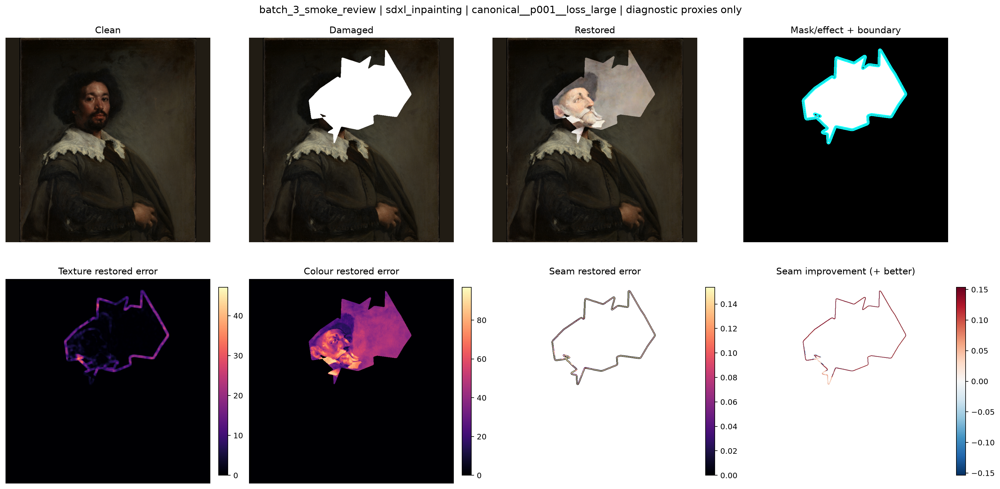

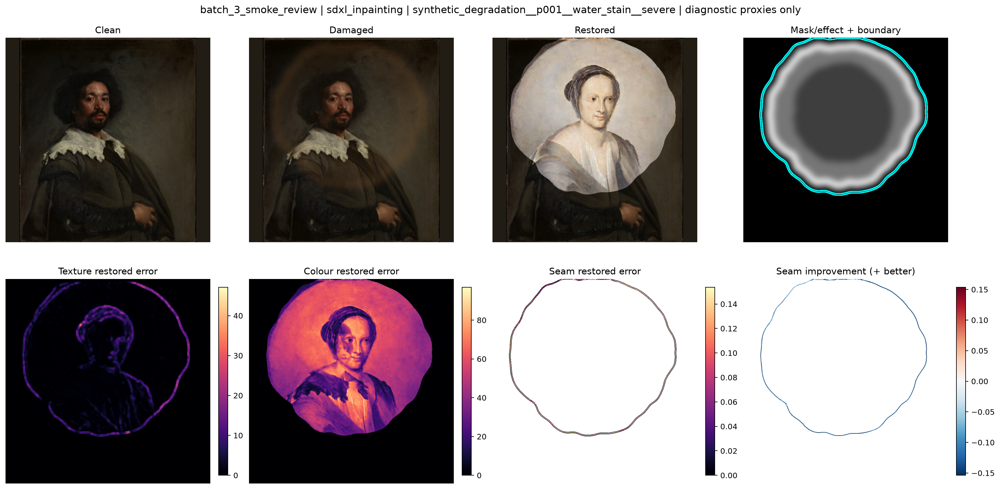

,column,matches
0,local_consistency_id,True
1,case_id,True
2,candidate_id,True
3,model_id,True
4,painting_id,True
5,dataset_id,True
6,dataset_scope,True
7,experiment_id,True
8,damage_or_degradation_type,True
9,target_damage_fraction,True


,path,removed


,map_type,vmin,vmax,center,error_cmap,improvement_cmap,scale_scope
0,texture,0.0,47.125735,0.0,magma,RdBu_r,global candidate metric 99th percentile; sourc...
1,colour,0.0,96.963821,0.0,magma,RdBu_r,global candidate metric 99th percentile; sourc...
2,seam,0.0,0.153740,0.0,magma,RdBu_r,global candidate metric 99th percentile; sourc...


,map_image_id,asset_kind,map_id,candidate_id,case_id,model_id,painting_id,map_type,selection_role,relative_path,...,cmap,vmin,vmax,center,scale_scope,quantization_policy,no_data_policy,renderer_version,status,issue
0,lcmi_94413acf7b9ab68c6c1a,candidate_map,lcm_67e23f830ee5ce83,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,sdxl_inpainting,p001,colour,primary_nonzero_candidate,outputs/17_local_consistency_metrics/work/map_...,...,magma|RdBu_r,-96.963821,96.963821,0.0,global candidate metric 99th percentile; sourc...,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
1,lcmi_7510a92be5f69b29e303,candidate_map,lcm_67e23f830ee5ce83,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,sdxl_inpainting,p001,seam,primary_nonzero_candidate,outputs/17_local_consistency_metrics/work/map_...,...,magma|RdBu_r,-0.153740,0.153740,0.0,global candidate metric 99th percentile; sourc...,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
2,lcmi_bf0766cd849b88f2e688,candidate_map,lcm_67e23f830ee5ce83,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,sdxl_inpainting,p001,texture,primary_nonzero_candidate,outputs/17_local_consistency_metrics/work/map_...,...,magma|RdBu_r,-47.125735,47.125735,0.0,global candidate metric 99th percentile; sourc...,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
3,lcmi_93600b090fb6c0fcb158,candidate_map,lcm_745ad5f07f40ddb0,sdxl__ab9ddf049dd2__p00_generic__seed2026,synthetic_degradation__p001__water_stain__severe,sdxl_inpainting,p001,colour,primary_nonzero_candidate,outputs/17_local_consistency_metrics/work/map_...,...,magma|RdBu_r,-96.963821,96.963821,0.0,global candidate metric 99th percentile; sourc...,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
4,lcmi_e78af3a9354b631a56f6,candidate_map,lcm_745ad5f07f40ddb0,sdxl__ab9ddf049dd2__p00_generic__seed2026,synthetic_degradation__p001__water_stain__severe,sdxl_inpainting,p001,seam,primary_nonzero_candidate,outputs/17_local_consistency_metrics/work/map_...,...,magma|RdBu_r,-0.153740,0.153740,0.0,global candidate metric 99th percentile; sourc...,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
5,lcmi_d49f6f27b7b612acdabb,candidate_map,lcm_745ad5f07f40ddb0,sdxl__ab9ddf049dd2__p00_generic__seed2026,synthetic_degradation__p001__water_stain__severe,sdxl_inpainting,p001,texture,primary_nonzero_candidate,outputs/17_local_consistency_metrics/work/map_...,...,magma|RdBu_r,-47.125735,47.125735,0.0,global candidate metric 99th percentile; sourc...,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,


,candidate_id,map_type,format,mode,width,height,size_bytes
0,sdxl__a502c0783c0a__p00_generic__seed2026,colour,PNG,RGBA,2304,792,402244
1,sdxl__a502c0783c0a__p00_generic__seed2026,seam,PNG,RGBA,2304,792,66950
2,sdxl__a502c0783c0a__p00_generic__seed2026,texture,PNG,RGBA,2304,792,202047
3,sdxl__ab9ddf049dd2__p00_generic__seed2026,colour,PNG,RGBA,2304,792,1187548
4,sdxl__ab9ddf049dd2__p00_generic__seed2026,seam,PNG,RGBA,2304,792,82346
5,sdxl__ab9ddf049dd2__p00_generic__seed2026,texture,PNG,RGBA,2304,792,391178


,candidate_id,case_id,format,mode,width,height,size_bytes
0,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,PNG,RGBA,3257,1595,1849393
1,sdxl__ab9ddf049dd2__p00_generic__seed2026,synthetic_degradation__p001__water_stain__severe,PNG,RGBA,3257,1595,2583601


Map and review-panel smoke test complete.
Metric checkpoint semantically matches: True
Metric columns with mismatches: 0
Stale smoke directories found: 0
Stale smoke directories removed: 0
Smoke map candidates: 2
Generated map images: 6
Map candidates reused on second run: 2
Map-manifest validation passed: True
Embedded review panels: 2
Temporary map directory removed: True


In [13]:
import gc
import io
import shutil

from IPython.display import Image as IPythonImage


# ---------------------------------------------------------------------------
# Semantically compare the original and CSV-reloaded metric tables
#
# DataFrame.equals() is unsuitable here because CSV round-tripping can change
# dtypes and insignificant floating-point representations without changing
# the actual evidence.
# ---------------------------------------------------------------------------

def compare_checkpoint_tables(
    original_df,
    resumed_df,
):
    primary_key = "local_consistency_id"

    original = (
        original_df
        .sort_values(
            primary_key,
            kind="stable",
        )
        .reset_index(drop=True)
    )

    resumed = (
        resumed_df
        .sort_values(
            primary_key,
            kind="stable",
        )
        .reset_index(drop=True)
    )

    same_columns = (
        list(original.columns)
        == list(resumed.columns)
    )

    same_rows = (
        len(original) == len(resumed)
    )

    numeric_columns = {
        "target_damage_fraction",
        "realized_damage_fraction",
        "candidate_index",
        "seed",
        "region_pixel_count",
        "damaged_value",
        "restored_value",
        "improvement_value",
    }

    comparison_records = []

    if same_columns and same_rows:
        for column in original.columns:
            if column in numeric_columns:
                original_values = pd.to_numeric(
                    original[column],
                    errors="coerce",
                ).to_numpy(dtype=float)

                resumed_values = pd.to_numeric(
                    resumed[column],
                    errors="coerce",
                ).to_numpy(dtype=float)

                column_matches = bool(
                    np.allclose(
                        original_values,
                        resumed_values,
                        rtol=1e-10,
                        atol=1e-12,
                        equal_nan=True,
                    )
                )
            else:
                original_values = (
                    original[column]
                    .fillna("")
                    .astype(str)
                )

                resumed_values = (
                    resumed[column]
                    .fillna("")
                    .astype(str)
                )

                column_matches = bool(
                    original_values.eq(
                        resumed_values
                    ).all()
                )

            comparison_records.append(
                {
                    "column": column,
                    "matches": column_matches,
                }
            )

    comparison_df = pd.DataFrame(
        comparison_records
    )

    passed = bool(
        same_columns
        and same_rows
        and not comparison_df.empty
        and comparison_df["matches"].all()
    )

    return passed, comparison_df


(
    smoke_resume_metrics_equal,
    smoke_resume_comparison_df,
) = compare_checkpoint_tables(
    smoke_metrics_df,
    smoke_metric_resume_result.metrics,
)


# ---------------------------------------------------------------------------
# Bounded Windows-safe cleanup for temporary smoke directories
# ---------------------------------------------------------------------------

def remove_smoke_directory(
    directory,
    attempts=10,
):
    directory = Path(directory)

    for attempt in range(attempts):
        if not directory.exists():
            return True

        try:
            shutil.rmtree(directory)

            if not directory.exists():
                return True

        except (PermissionError, OSError):
            pass

        plt.close("all")
        gc.collect()

        time.sleep(
            min(
                0.25 * (2 ** attempt),
                2.0,
            )
        )

    return not directory.exists()


# Remove any directory left by the failed cleanup attempt.
stale_smoke_cleanup_records = []

for stale_path in sorted(
    smoke_work_parent.glob(
        "map_smoke_*"
    )
):
    stale_smoke_cleanup_records.append(
        {
            "path": stale_path.name,
            "removed": remove_smoke_directory(
                stale_path
            ),
        }
    )

stale_smoke_cleanup_df = pd.DataFrame(
    stale_smoke_cleanup_records,
    columns=[
        "path",
        "removed",
    ],
)


# ---------------------------------------------------------------------------
# Use one binary and one synthetic SDXL candidate
# ---------------------------------------------------------------------------

smoke_visual_case_ids = {
    SMOKE_CASE_IDS["binary_nonzero"],
    SMOKE_CASE_IDS["synthetic_nonzero"],
}

smoke_map_candidates_df = (
    map_worklist_df.loc[
        map_worklist_df[
            "case_id"
        ].isin(smoke_visual_case_ids)
        & map_worklist_df[
            "model_id"
        ].astype(str).eq(
            "sdxl_inpainting"
        )
    ]
    .sort_values(
        "case_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

smoke_display_scales = (
    compute_display_scales(
        smoke_metrics_df,
        config=LOCAL_CONFIG_DOCUMENT,
    )
)

smoke_display_scales_df = pd.DataFrame(
    [
        {
            "map_type": map_type,
            **scale,
        }
        for map_type, scale in (
            smoke_display_scales.items()
        )
    ]
)


# ---------------------------------------------------------------------------
# Render and validate temporary map assets
# ---------------------------------------------------------------------------

smoke_map_temp_root = Path(
    tempfile.mkdtemp(
        prefix="map_smoke_",
        dir=smoke_work_parent,
    )
)

try:
    smoke_maps_root = (
        smoke_map_temp_root / "maps"
    )

    smoke_map_checkpoint_path = (
        smoke_map_temp_root
        / "map_images_checkpoint.csv"
    )

    smoke_map_result = (
        run_local_consistency_maps(
            smoke_map_candidates_df,
            project_root=PROJECT_ROOT,
            maps_root=smoke_maps_root,
            config=LOCAL_CONFIG_DOCUMENT,
            scales=smoke_display_scales,
            checkpoint_path=(
                smoke_map_checkpoint_path
            ),
            progress_callback=print,
        )
    )

    smoke_map_manifest_df = (
        smoke_map_result.map_images.copy()
    )

    smoke_map_validation = (
        validate_map_manifest(
            smoke_map_manifest_df,
            project_root=PROJECT_ROOT,
            verify_checksums=True,
        )
    )

    # A second execution must reuse both complete candidates.
    smoke_map_resume_result = (
        run_local_consistency_maps(
            smoke_map_candidates_df,
            project_root=PROJECT_ROOT,
            maps_root=smoke_maps_root,
            config=LOCAL_CONFIG_DOCUMENT,
            scales=smoke_display_scales,
            checkpoint_path=(
                smoke_map_checkpoint_path
            ),
            progress_callback=print,
        )
    )

    smoke_map_image_audit_records = []

    for map_record in (
        smoke_map_manifest_df.itertuples(
            index=False
        )
    ):
        map_path = (
            PROJECT_ROOT
            / map_record.relative_path
        )

        with Image.open(map_path) as image:
            image.load()

            smoke_map_image_audit_records.append(
                {
                    "candidate_id": (
                        map_record.candidate_id
                    ),
                    "map_type": map_record.map_type,
                    "format": image.format,
                    "mode": image.mode,
                    "width": image.width,
                    "height": image.height,
                    "size_bytes": (
                        map_path.stat().st_size
                    ),
                }
            )

    smoke_map_image_audit_df = pd.DataFrame(
        smoke_map_image_audit_records
    )


    # -----------------------------------------------------------------------
    # Render panels, detach them from disk as bytes, and then display them
    # -----------------------------------------------------------------------

    smoke_review_panel_audit_records = []

    for row_number, (
        _,
        candidate_row,
    ) in enumerate(
        smoke_map_candidates_df.iterrows(),
        start=1,
    ):
        panel_path = (
            smoke_map_temp_root
            / "review_panels"
            / f"smoke_review_{row_number:02d}.png"
        )

        smoke_review_figure = (
            render_candidate_review_panel(
                candidate_row,
                project_root=PROJECT_ROOT,
                config=LOCAL_CONFIG_DOCUMENT,
                scales=smoke_display_scales,
                output_path=panel_path,
                selection_role=(
                    "batch_3_smoke_review"
                ),
            )
        )

        plt.close(smoke_review_figure)
        gc.collect()

        # Load the complete file into memory so the displayed notebook output
        # does not retain a Windows handle to the temporary PNG.
        panel_bytes = panel_path.read_bytes()

        with Image.open(
            io.BytesIO(panel_bytes)
        ) as image:
            image.load()

            panel_audit_record = {
                "candidate_id": candidate_row[
                    "candidate_id"
                ],
                "case_id": candidate_row[
                    "case_id"
                ],
                "format": image.format,
                "mode": image.mode,
                "width": image.width,
                "height": image.height,
                "size_bytes": len(panel_bytes),
            }

        smoke_review_panel_audit_records.append(
            panel_audit_record
        )

        display(
            IPythonImage(
                data=panel_bytes,
                format="png",
            )
        )

        del panel_bytes

    smoke_review_panel_audit_df = (
        pd.DataFrame(
            smoke_review_panel_audit_records
        )
    )

finally:
    plt.close("all")
    gc.collect()

    smoke_map_temp_removed = (
        remove_smoke_directory(
            smoke_map_temp_root
        )
    )


# ---------------------------------------------------------------------------
# Human-readable review
# ---------------------------------------------------------------------------

display(smoke_resume_comparison_df)
display(stale_smoke_cleanup_df)
display(smoke_display_scales_df)
display(smoke_map_manifest_df)
display(smoke_map_image_audit_df)
display(smoke_review_panel_audit_df)

print("Map and review-panel smoke test complete.")
print(
    "Metric checkpoint semantically matches:",
    smoke_resume_metrics_equal,
)
print(
    "Metric columns with mismatches:",
    int(
        (
            ~smoke_resume_comparison_df[
                "matches"
            ]
        ).sum()
    ),
)
print(
    "Stale smoke directories found:",
    len(stale_smoke_cleanup_df),
)
print(
    "Stale smoke directories removed:",
    int(
        stale_smoke_cleanup_df[
            "removed"
        ].sum()
    )
    if not stale_smoke_cleanup_df.empty
    else 0,
)
print(
    "Smoke map candidates:",
    len(smoke_map_candidates_df),
)
print(
    "Generated map images:",
    len(smoke_map_manifest_df),
)
print(
    "Map candidates reused on second run:",
    smoke_map_resume_result.reused_candidates,
)
print(
    "Map-manifest validation passed:",
    smoke_map_validation["passed"],
)
print(
    "Embedded review panels:",
    len(smoke_review_panel_audit_df),
)
print(
    "Temporary map directory removed:",
    smoke_map_temp_removed,
)

In [14]:
# ---------------------------------------------------------------------------
# Batch 3 validation
# ---------------------------------------------------------------------------

def add_batch_3_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_3_smoke_test",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_3_check(
    "smoke_candidate_count",
    "The smoke sample contains the predeclared candidate population.",
    EXPECTED_SMOKE_CANDIDATES,
    len(smoke_worklist_df),
    (
        len(smoke_worklist_df)
        == EXPECTED_SMOKE_CANDIDATES
    ),
)

add_batch_3_check(
    "smoke_case_model_coverage",
    "Each smoke case contains its expected model population.",
    {
        case_id: sorted(model_ids)
        for case_id, model_ids in (
            EXPECTED_SMOKE_MODELS_BY_CASE.items()
        )
    },
    {
        case_id: sorted(model_ids)
        for case_id, model_ids in (
            observed_smoke_models_by_case.items()
        )
    },
    (
        observed_smoke_models_by_case
        == EXPECTED_SMOKE_MODELS_BY_CASE
    ),
)

add_batch_3_check(
    "smoke_metric_row_plan",
    "The selected smoke candidates produce the exact analytical row count.",
    EXPECTED_SMOKE_METRIC_ROWS,
    observed_smoke_metric_rows,
    (
        observed_smoke_metric_rows
        == EXPECTED_SMOKE_METRIC_ROWS
    ),
)

add_batch_3_check(
    "smoke_metric_validation",
    "The computed smoke metrics pass schema, coverage, and policy validation.",
    True,
    smoke_metric_validation,
    smoke_metric_validation["passed"],
)

add_batch_3_check(
    "smoke_candidate_row_counts",
    "Every smoke candidate has its exact expected number of metric rows.",
    {
        "mismatched_candidates": 0,
        "error_rows": 0,
    },
    {
        "mismatched_candidates": int(
            (
                ~smoke_candidate_row_audit_df[
                    "matches"
                ]
            ).sum()
        ),
        "error_rows": int(
            smoke_candidate_row_audit_df[
                "error_rows"
            ].sum()
        ),
    },
    (
        smoke_candidate_row_audit_df[
            "matches"
        ].all()
        and smoke_candidate_row_audit_df[
            "error_rows"
        ].sum() == 0
    ),
)

observed_smoke_metric_families = sorted(
    smoke_metrics_df[
        "metric_family"
    ].astype(str).unique()
)

expected_smoke_metric_families = [
    "colour",
    "seam",
    "texture_descriptor",
    "texture_map",
]

add_batch_3_check(
    "smoke_metric_family_coverage",
    (
        "The smoke run exercises descriptor texture, "
        "local texture, colour, and seam evidence."
    ),
    expected_smoke_metric_families,
    observed_smoke_metric_families,
    (
        observed_smoke_metric_families
        == expected_smoke_metric_families
    ),
)

add_batch_3_check(
    "smoke_metric_version",
    "Every smoke metric row uses the canonical metric version.",
    [LOCAL_CONSISTENCY_METRIC_VERSION],
    sorted(
        smoke_metrics_df[
            "metric_version"
        ].astype(str).unique()
    ),
    (
        smoke_metrics_df[
            "metric_version"
        ].astype(str).eq(
            LOCAL_CONSISTENCY_METRIC_VERSION
        ).all()
    ),
)

add_batch_3_check(
    "smoke_evidence_boundaries",
    "Smoke rows remain diagnostic and never become final flags.",
    {
        "evidence_role": "diagnostic_only",
        "final_flags": 0,
    },
    {
        "evidence_roles": sorted(
            smoke_metrics_df[
                "evidence_role"
            ].astype(str).unique()
        ),
        "final_flags": int(
            smoke_metrics_df[
                "is_final_trustworthiness_flag"
            ].astype(bool).sum()
        ),
    },
    (
        smoke_metrics_df[
            "evidence_role"
        ].astype(str).eq(
            "diagnostic_only"
        ).all()
        and not smoke_metrics_df[
            "is_final_trustworthiness_flag"
        ].astype(bool).any()
    ),
)

add_batch_3_check(
    "smoke_metric_resume",
    "The second metric run strictly reuses every complete candidate.",
    {
        "reused_candidates": EXPECTED_SMOKE_CANDIDATES,
        "tables_equal": True,
    },
    {
        "reused_candidates": (
            smoke_metric_resume_result.reused_candidates
        ),
        "tables_equal": smoke_resume_metrics_equal,
    },
    (
        smoke_metric_resume_result.reused_candidates
        == EXPECTED_SMOKE_CANDIDATES
        and smoke_resume_metrics_equal
    ),
)

add_batch_3_check(
    "smoke_map_population",
    "The map smoke test contains one binary and one synthetic candidate.",
    2,
    len(smoke_map_candidates_df),
    len(smoke_map_candidates_df) == 2,
)

add_batch_3_check(
    "smoke_map_manifest",
    "The six temporary maps pass schema, decoding, path, and checksum validation.",
    {
        "rows": 2 * len(MAP_TYPES),
        "passed": True,
    },
    {
        "rows": len(smoke_map_manifest_df),
        "passed": smoke_map_validation["passed"],
        "missing_paths": smoke_map_validation[
            "missing_paths"
        ],
        "checksum_mismatches": (
            smoke_map_validation[
                "checksum_mismatches"
            ]
        ),
        "invalid_images": smoke_map_validation[
            "invalid_images"
        ],
    },
    (
        len(smoke_map_manifest_df)
        == 2 * len(MAP_TYPES)
        and smoke_map_validation["passed"]
    ),
)

add_batch_3_check(
    "smoke_map_image_properties",
    "Every temporary map is a non-empty RGBA PNG.",
    {
        "format": "PNG",
        "mode": "RGBA",
        "positive_dimensions": True,
        "positive_size": True,
    },
    {
        "formats": sorted(
            smoke_map_image_audit_df[
                "format"
            ].astype(str).unique()
        ),
        "modes": sorted(
            smoke_map_image_audit_df[
                "mode"
            ].astype(str).unique()
        ),
        "minimum_width": int(
            smoke_map_image_audit_df[
                "width"
            ].min()
        ),
        "minimum_height": int(
            smoke_map_image_audit_df[
                "height"
            ].min()
        ),
        "minimum_size_bytes": int(
            smoke_map_image_audit_df[
                "size_bytes"
            ].min()
        ),
    },
    (
        smoke_map_image_audit_df[
            "format"
        ].astype(str).eq("PNG").all()
        and smoke_map_image_audit_df[
            "mode"
        ].astype(str).eq("RGBA").all()
        and smoke_map_image_audit_df[
            "width"
        ].gt(0).all()
        and smoke_map_image_audit_df[
            "height"
        ].gt(0).all()
        and smoke_map_image_audit_df[
            "size_bytes"
        ].gt(0).all()
    ),
)

add_batch_3_check(
    "smoke_map_resume",
    "The second map run strictly reuses both completed candidates.",
    len(smoke_map_candidates_df),
    smoke_map_resume_result.reused_candidates,
    (
        smoke_map_resume_result.reused_candidates
        == len(smoke_map_candidates_df)
    ),
)

add_batch_3_check(
    "smoke_review_panels",
    "Both review panels rendered and decoded successfully.",
    2,
    len(smoke_review_panel_audit_df),
    (
        len(smoke_review_panel_audit_df) == 2
        and smoke_review_panel_audit_df[
            "format"
        ].astype(str).eq("PNG").all()
        and smoke_review_panel_audit_df[
            "size_bytes"
        ].gt(0).all()
    ),
)

add_batch_3_check(
    "smoke_temporary_cleanup",
    "All smoke-test files were removed after validation.",
    {
        "metric_temp_removed": True,
        "map_temp_removed": True,
    },
    {
        "metric_temp_removed": (
            smoke_metric_temp_removed
        ),
        "map_temp_removed": (
            smoke_map_temp_removed
        ),
    },
    (
        smoke_metric_temp_removed
        and smoke_map_temp_removed
    ),
)


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_3_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq("batch_3_smoke_test")
    ]
    .reset_index(drop=True)
)

display(batch_3_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 17 Batch 3 summary")
print("---------------------------")
print(
    "Smoke candidates:",
    len(smoke_worklist_df),
)
print(
    "Smoke metric rows:",
    len(smoke_metrics_df),
)
print(
    "Smoke metric families:",
    observed_smoke_metric_families,
)
print(
    "Smoke map images:",
    len(smoke_map_manifest_df),
)
print(
    "Embedded review panels:",
    len(smoke_review_panel_audit_df),
)
print(
    "Metric execution seconds:",
    round(
        smoke_metric_elapsed_seconds,
        3,
    ),
)
print(
    "Batch 3 validation checks:",
    len(batch_3_validation_df),
)
print(
    "Blocking failures across Batches 1–3:",
    len(VALIDATION.blocking_failures),
)
print(
    "No canonical Notebook 17 files were persisted in Batch 3."
)
print(
    "Batch 3 passed: binary, synthetic, and zero-control "
    "metrics; checkpoint resumption; diagnostic maps; and "
    "human-review rendering are ready for full execution."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_smoke_test,smoke_candidate_count,The smoke sample contains the predeclared cand...,blocking,11,11,True,
1,batch_3_smoke_test,smoke_case_model_coverage,Each smoke case contains its expected model po...,blocking,"{""canonical__p001__loss_large"": [""lama"", ""open...","{""canonical__p001__loss_large"": [""lama"", ""open...",True,
2,batch_3_smoke_test,smoke_metric_row_plan,The selected smoke candidates produce the exac...,blocking,1181,1181,True,
3,batch_3_smoke_test,smoke_metric_validation,"The computed smoke metrics pass schema, covera...",blocking,True,"{""candidate_count_mismatches"": {}, ""duplicate_...",True,
4,batch_3_smoke_test,smoke_candidate_row_counts,Every smoke candidate has its exact expected n...,blocking,"{""error_rows"": 0, ""mismatched_candidates"": 0}","{""error_rows"": 0, ""mismatched_candidates"": 0}",True,
5,batch_3_smoke_test,smoke_metric_family_coverage,"The smoke run exercises descriptor texture, lo...",blocking,"[""colour"", ""seam"", ""texture_descriptor"", ""text...","[""colour"", ""seam"", ""texture_descriptor"", ""text...",True,
6,batch_3_smoke_test,smoke_metric_version,Every smoke metric row uses the canonical metr...,blocking,"[""local_consistency_metrics.v1""]","[""local_consistency_metrics.v1""]",True,
7,batch_3_smoke_test,smoke_evidence_boundaries,Smoke rows remain diagnostic and never become ...,blocking,"{""evidence_role"": ""diagnostic_only"", ""final_fl...","{""evidence_roles"": [""diagnostic_only""], ""final...",True,
8,batch_3_smoke_test,smoke_metric_resume,The second metric run strictly reuses every co...,blocking,"{""reused_candidates"": 11, ""tables_equal"": true}","{""reused_candidates"": 11, ""tables_equal"": true}",True,
9,batch_3_smoke_test,smoke_map_population,The map smoke test contains one binary and one...,blocking,2,2,True,


Notebook 17 Batch 3 summary
---------------------------
Smoke candidates: 11
Smoke metric rows: 1181
Smoke metric families: ['colour', 'seam', 'texture_descriptor', 'texture_map']
Smoke map images: 6
Embedded review panels: 2
Metric execution seconds: 40.673
Batch 3 validation checks: 15
Blocking failures across Batches 1–3: 0
No canonical Notebook 17 files were persisted in Batch 3.
Batch 3 passed: binary, synthetic, and zero-control metrics; checkpoint resumption; diagnostic maps; and human-review rendering are ready for full execution.


## Batch 4 — Full local-consistency metric execution

This batch computes canonical numeric evidence for all 2,160 approved restoration candidates.

The execution:

- processes candidates case-by-case so clean and damaged image contexts are reused;
- computes texture-descriptor, local-texture, colour, and seam evidence;
- applies synthetic `degradation_support` only where scientifically applicable;
- retains the 150 zero controls with their exact reduced metric plan;
- prints progress every 10 candidates;
- checkpoints inside `outputs/17_local_consistency_metrics/work/`;
- strictly resumes only candidates with complete metric-key coverage;
- validates all 271,988 expected metric rows;
- persists and reloads `metrics/local_consistency.csv`;
- retains the checkpoint until Notebook 17’s final completion batch.

If execution is interrupted, rerun the execution cell without deleting the checkpoint.

In [15]:
from restoration_eval.local_consistency import (
    write_dataframe_atomic,
)


# ---------------------------------------------------------------------------
# Inspect any existing resumable checkpoint
# ---------------------------------------------------------------------------

metrics_checkpoint_path = (
    WORK_PATHS["metrics_checkpoint"]
)

if metrics_checkpoint_path.is_file():
    existing_checkpoint_df = pd.read_csv(
        metrics_checkpoint_path,
        low_memory=False,
    )

    existing_checkpoint_rows = len(
        existing_checkpoint_df
    )

    existing_checkpoint_candidates = int(
        existing_checkpoint_df[
            "candidate_id"
        ].nunique()
    )

    unknown_checkpoint_candidates = sorted(
        set(
            existing_checkpoint_df[
                "candidate_id"
            ].astype(str)
        )
        - set(
            evaluation_worklist_df[
                "candidate_id"
            ].astype(str)
        )
    )
else:
    existing_checkpoint_rows = 0
    existing_checkpoint_candidates = 0
    unknown_checkpoint_candidates = []

if unknown_checkpoint_candidates:
    raise ValueError(
        "The metric checkpoint contains candidates outside "
        "the approved worklist: "
        f"{unknown_checkpoint_candidates[:10]}"
    )

print("Full metric execution preparation complete.")
print(
    "Approved candidates:",
    len(evaluation_worklist_df),
)
print(
    "Expected metric rows:",
    EXPECTED_COUNTS["total_metric_rows"],
)
print(
    "Existing checkpoint rows:",
    existing_checkpoint_rows,
)
print(
    "Existing checkpoint candidates:",
    existing_checkpoint_candidates,
)
print(
    "Progress interval:",
    LOCAL_CONFIG[
        "execution"
    ][
        "progress_interval_candidates"
    ],
    "candidates",
)
print(
    "Checkpoint interval:",
    LOCAL_CONFIG[
        "execution"
    ][
        "checkpoint_interval_candidates"
    ],
    "candidates",
)


# ---------------------------------------------------------------------------
# Full execution with checkpoint-aware failure evidence
# ---------------------------------------------------------------------------

full_metric_started = time.perf_counter()

try:
    full_metric_result = (
        run_local_consistency_metrics(
            evaluation_worklist_df,
            project_root=PROJECT_ROOT,
            config=LOCAL_CONFIG_DOCUMENT,
            checkpoint_path=(
                metrics_checkpoint_path
            ),
            progress_callback=print,
        )
    )

except BaseException as execution_error:
    full_metric_elapsed_seconds = (
        time.perf_counter()
        - full_metric_started
    )

    if metrics_checkpoint_path.is_file():
        failed_run_checkpoint_df = pd.read_csv(
            metrics_checkpoint_path,
            low_memory=False,
        )

        failed_run_checkpoint_rows = len(
            failed_run_checkpoint_df
        )

        failed_run_checkpoint_candidates = int(
            failed_run_checkpoint_df[
                "candidate_id"
            ].nunique()
        )
    else:
        failed_run_checkpoint_rows = 0
        failed_run_checkpoint_candidates = 0

    print("Full metric execution stopped safely.")
    print(
        "Exception:",
        (
            f"{type(execution_error).__name__}: "
            f"{execution_error}"
        ),
    )
    print(
        "Elapsed seconds:",
        round(
            full_metric_elapsed_seconds,
            3,
        ),
    )
    print(
        "Checkpoint rows retained:",
        failed_run_checkpoint_rows,
    )
    print(
        "Checkpoint candidates retained:",
        failed_run_checkpoint_candidates,
    )
    print(
        "Rerun this cell to strictly validate and resume."
    )

    raise

full_metric_elapsed_seconds = (
    time.perf_counter()
    - full_metric_started
)

FULL_METRIC_COMPLETED_AT_UTC = (
    utc_now_iso()
)

full_metrics_df = (
    full_metric_result.metrics.copy()
)

full_metric_validation = (
    validate_local_consistency_metrics(
        full_metrics_df,
        evaluation_worklist_df,
        expected_rows=(
            EXPECTED_COUNTS[
                "total_metric_rows"
            ]
        ),
    )
)

print("Full metric execution complete.")
print(
    "Metric rows:",
    len(full_metrics_df),
)
print(
    "Completed candidates:",
    full_metric_result.completed_candidates,
)
print(
    "Candidates reused from checkpoint:",
    full_metric_result.reused_candidates,
)
print(
    "Candidates computed in this run:",
    (
        full_metric_result.completed_candidates
        - full_metric_result.reused_candidates
    ),
)
print(
    "Elapsed seconds:",
    round(
        full_metric_elapsed_seconds,
        3,
    ),
)
print(
    "Completed at UTC:",
    FULL_METRIC_COMPLETED_AT_UTC,
)
print(
    "Initial full-table validation passed:",
    full_metric_validation["passed"],
)

Full metric execution preparation complete.
Approved candidates: 2160
Expected metric rows: 271988
Existing checkpoint rows: 0
Existing checkpoint candidates: 0
Progress interval: 10 candidates
Checkpoint interval: 10 candidates
Local consistency: 14/2160 (0.6%) | elapsed=61.7s | throughput=0.227 candidates/s | latest_case=canonical__p001__mixed_damage
Local consistency: 24/2160 (1.1%) | elapsed=101.6s | throughput=0.236 candidates/s | latest_case=canonical__p001__scratch_thin
Local consistency: 33/2160 (1.5%) | elapsed=128.0s | throughput=0.258 candidates/s | latest_case=canonical__p002__loss_large
Local consistency: 45/2160 (2.1%) | elapsed=163.5s | throughput=0.275 candidates/s | latest_case=canonical__p002__mixed_damage
Local consistency: 55/2160 (2.5%) | elapsed=191.9s | throughput=0.287 candidates/s | latest_case=canonical__p002__scratch_thin
Local consistency: 61/2160 (2.8%) | elapsed=211.6s | throughput=0.288 candidates/s | latest_case=canonical__p003__loss_large
Local consiste

In [16]:
# ---------------------------------------------------------------------------
# Exact family-level row accounting
# ---------------------------------------------------------------------------

expected_metric_rows_by_family = {
    "texture_descriptor": (
        EXPECTED_COUNTS[
            "texture_descriptor_rows"
        ]
    ),
    "texture_map": (
        EXPECTED_COUNTS[
            "texture_map_rows"
        ]
    ),
    "colour": (
        EXPECTED_COUNTS[
            "colour_rows"
        ]
    ),
    "seam": (
        EXPECTED_COUNTS[
            "seam_rows"
        ]
    ),
}

observed_metric_rows_by_family = {
    str(metric_family): int(count)
    for metric_family, count in (
        full_metrics_df[
            "metric_family"
        ].value_counts().items()
    )
}

metric_family_summary_df = (
    full_metrics_df
    .groupby(
        [
            "metric_family",
            "status",
        ],
        as_index=False,
    )
    .agg(
        rows=("local_consistency_id", "size"),
        candidates=("candidate_id", "nunique"),
        metric_names=("metric_name", "nunique"),
        regions=("region_id", "nunique"),
    )
    .sort_values(
        [
            "metric_family",
            "status",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Candidate-level row accounting
# ---------------------------------------------------------------------------

full_candidate_row_audit_df = (
    full_metrics_df
    .groupby(
        [
            "candidate_id",
            "case_id",
            "model_id",
        ],
        as_index=False,
    )
    .agg(
        observed_metric_rows=(
            "local_consistency_id",
            "size",
        ),
        error_rows=(
            "status",
            lambda values: int(
                values.astype(str).eq("error").sum()
            ),
        ),
    )
    .merge(
        candidate_metric_plan_df[
            [
                "candidate_id",
                "expected_metric_rows",
            ]
        ],
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
)

full_candidate_row_audit_df[
    "matches"
] = (
    full_candidate_row_audit_df[
        "observed_metric_rows"
    ].eq(
        full_candidate_row_audit_df[
            "expected_metric_rows"
        ]
    )
)

candidate_row_count_summary_df = (
    full_candidate_row_audit_df
    .groupby(
        [
            "expected_metric_rows",
            "observed_metric_rows",
            "matches",
        ],
        as_index=False,
    )
    .agg(
        candidates=("candidate_id", "size"),
    )
    .sort_values(
        "expected_metric_rows",
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Metric-name coverage
# ---------------------------------------------------------------------------

expected_metric_names_by_family = {
    "texture_descriptor": sorted(
        METRIC_PLAN[
            "texture_descriptor"
        ][
            "metric_names"
        ]
    ),
    "texture_map": sorted(
        METRIC_PLAN[
            "texture_map"
        ][
            "metric_names"
        ]
    ),
    "colour": sorted(
        METRIC_PLAN[
            "colour"
        ][
            "metric_names"
        ]
    ),
    "seam": sorted(
        set(
            METRIC_PLAN[
                "seam_inner_outer"
            ][
                "metric_names"
            ]
        )
        | set(
            METRIC_PLAN[
                "seam_boundary"
            ][
                "metric_names"
            ]
        )
        | set(
            METRIC_PLAN[
                "seam_spillover"
            ][
                "metric_names"
            ]
        )
    ),
}

observed_metric_names_by_family = {
    str(metric_family): sorted(
        family_df[
            "metric_name"
        ].astype(str).unique()
    )
    for metric_family, family_df in (
        full_metrics_df.groupby(
            "metric_family",
            sort=True,
        )
    )
}

metric_name_audit_df = pd.DataFrame(
    [
        {
            "metric_family": metric_family,
            "expected_metric_names": (
                expected_metric_names
            ),
            "observed_metric_names": (
                observed_metric_names_by_family.get(
                    metric_family,
                    [],
                )
            ),
            "matches": (
                observed_metric_names_by_family.get(
                    metric_family,
                    [],
                )
                == expected_metric_names
            ),
        }
        for metric_family, expected_metric_names
        in expected_metric_names_by_family.items()
    ]
)


# ---------------------------------------------------------------------------
# Scientific-policy audits
# ---------------------------------------------------------------------------

ok_metric_rows_df = (
    full_metrics_df.loc[
        full_metrics_df[
            "status"
        ].astype(str).eq("ok")
    ]
)

improvement_identity_error = (
    pd.to_numeric(
        ok_metric_rows_df[
            "improvement_value"
        ],
        errors="coerce",
    )
    - (
        pd.to_numeric(
            ok_metric_rows_df[
                "damaged_value"
            ],
            errors="coerce",
        )
        - pd.to_numeric(
            ok_metric_rows_df[
                "restored_value"
            ],
            errors="coerce",
        )
    )
).abs()

maximum_improvement_identity_error = float(
    improvement_identity_error.max()
)

invalid_not_applicable_rows = int(
    (
        full_metrics_df[
            "status"
        ].astype(str).eq(
            "not_applicable"
        )
        & ~full_metrics_df[
            "metric_name"
        ].astype(str).str.contains(
            "hue|orientation",
            case=False,
            regex=True,
        )
    ).sum()
)

sparse_ssim_rows = int(
    (
        full_metrics_df[
            "metric_name"
        ].astype(str).str.contains(
            "ssim",
            case=False,
        )
        & full_metrics_df[
            "region_id"
        ].isin(
            {
                "masked_region",
                "degradation_support",
            }
        )
    ).sum()
)

invalid_degradation_support_rows = int(
    (
        full_metrics_df[
            "region_id"
        ].astype(str).eq(
            "degradation_support"
        )
        & ~full_metrics_df[
            "experiment_id"
        ].astype(str).eq(
            "synthetic_degradation"
        )
    ).sum()
)

invalid_zero_control_family_rows = int(
    (
        full_metrics_df[
            "is_zero_control"
        ].astype(bool)
        & ~full_metrics_df[
            "metric_family"
        ].astype(str).eq("colour")
    ).sum()
)

literal_nan_prompt_values = int(
    sum(
        full_metrics_df[column]
        .fillna("")
        .astype(str)
        .str.strip()
        .str.lower()
        .eq("nan")
        .sum()
        for column in (
            "prompt_policy_id",
            "prompt_variant_id",
        )
    )
)

full_status_summary_df = (
    full_metrics_df[
        "status"
    ]
    .astype(str)
    .value_counts()
    .rename_axis("status")
    .reset_index(name="rows")
)

display(metric_family_summary_df)
display(candidate_row_count_summary_df)
display(metric_name_audit_df)
display(full_status_summary_df)
display(
    full_candidate_row_audit_df.loc[
        ~full_candidate_row_audit_df[
            "matches"
        ]
        | full_candidate_row_audit_df[
            "error_rows"
        ].gt(0)
    ]
)

print("Full metric scientific audit complete.")
print(
    "Observed rows by family:",
    observed_metric_rows_by_family,
)
print(
    "Candidate row-count mismatches:",
    int(
        (
            ~full_candidate_row_audit_df[
                "matches"
            ]
        ).sum()
    ),
)
print(
    "Error rows:",
    int(
        full_metrics_df[
            "status"
        ].astype(str).eq("error").sum()
    ),
)
print(
    "Invalid not-applicable rows:",
    invalid_not_applicable_rows,
)
print(
    "Sparse masked-pixel SSIM rows:",
    sparse_ssim_rows,
)
print(
    "Invalid degradation-support rows:",
    invalid_degradation_support_rows,
)
print(
    "Invalid zero-control family rows:",
    invalid_zero_control_family_rows,
)
print(
    "Literal 'nan' prompt values:",
    literal_nan_prompt_values,
)
print(
    "Maximum improvement identity error:",
    maximum_improvement_identity_error,
)

,metric_family,status,rows,candidates,metric_names,regions
0,colour,not_applicable,3308,1654,1,2
1,colour,ok,166756,2160,9,10
2,seam,ok,36180,2010,13,4
3,texture_descriptor,ok,16080,2010,8,1
4,texture_map,ok,49664,2010,4,7


,expected_metric_rows,observed_metric_rows,matches,candidates
0,27,27,True,150
1,131,131,True,1654
2,144,144,True,356


,metric_family,expected_metric_names,observed_metric_names,matches
0,texture_descriptor,"[edge_density_error, gabor_response_distance, ...","[edge_density_error, gabor_response_distance, ...",True
1,texture_map,"[hallucinated_detail_proxy_fraction, local_tex...","[hallucinated_detail_proxy_fraction, local_tex...",True
2,colour,"[chroma_shift_mean, delta_e_ciede2000_mean, de...","[chroma_shift_mean, delta_e_ciede2000_mean, de...",True
3,seam,"[boundary_gradient_mismatch, boundary_local_ss...","[boundary_gradient_mismatch, boundary_local_ss...",True


,status,rows
0,ok,268680
1,not_applicable,3308


,candidate_id,case_id,model_id,observed_metric_rows,error_rows,expected_metric_rows,matches


Full metric scientific audit complete.
Observed rows by family: {'colour': 170064, 'texture_map': 49664, 'seam': 36180, 'texture_descriptor': 16080}
Candidate row-count mismatches: 0
Error rows: 0
Invalid not-applicable rows: 0
Sparse masked-pixel SSIM rows: 0
Invalid degradation-support rows: 0
Invalid zero-control family rows: 0
Literal 'nan' prompt values: 0
Maximum improvement identity error: 0.0


In [17]:
# ---------------------------------------------------------------------------
# Persist the one canonical Notebook 17 metric table
# ---------------------------------------------------------------------------

write_dataframe_atomic(
    full_metrics_df,
    OUTPUTS["local_consistency"],
    attempts=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_retry_seconds"
    ],
)

canonical_metrics_df = pd.read_csv(
    OUTPUTS["local_consistency"],
    low_memory=False,
)

canonical_schema_validation = (
    validate_dataframe(
        canonical_metrics_df,
        LOCAL_CONSISTENCY_SCHEMA,
        allow_extra_columns=False,
    )
)

canonical_metric_validation = (
    validate_local_consistency_metrics(
        canonical_metrics_df,
        evaluation_worklist_df,
        expected_rows=(
            EXPECTED_COUNTS[
                "total_metric_rows"
            ]
        ),
    )
)

(
    canonical_metrics_reload_equivalent,
    canonical_metrics_reload_comparison_df,
) = compare_checkpoint_tables(
    full_metrics_df,
    canonical_metrics_df,
)

canonical_metric_file_audit = {
    "relative_path": to_repo_relative(
        OUTPUTS["local_consistency"],
        PROJECT_ROOT,
    ),
    "rows": len(canonical_metrics_df),
    "columns": len(canonical_metrics_df.columns),
    "size_bytes": int(
        OUTPUTS[
            "local_consistency"
        ].stat().st_size
    ),
    "sha256": sha256_file(
        OUTPUTS["local_consistency"]
    ),
    "schema_version": (
        LOCAL_CONSISTENCY_SCHEMA.version
    ),
}

display(
    canonical_metrics_df.head(10)
)
display(
    canonical_metrics_reload_comparison_df
)
display(
    pd.DataFrame(
        [canonical_metric_file_audit]
    )
)

print("Canonical metric table persisted and reloaded.")
print(
    "Path:",
    canonical_metric_file_audit[
        "relative_path"
    ],
)
print(
    "Rows:",
    canonical_metric_file_audit["rows"],
)
print(
    "Columns:",
    canonical_metric_file_audit["columns"],
)
print(
    "Size bytes:",
    canonical_metric_file_audit[
        "size_bytes"
    ],
)
print(
    "SHA-256:",
    canonical_metric_file_audit["sha256"],
)
print(
    "Schema validation passed:",
    canonical_schema_validation.passed,
)
print(
    "Scientific validation passed:",
    canonical_metric_validation["passed"],
)
print(
    "Semantic reload equivalence:",
    canonical_metrics_reload_equivalent,
)
print(
    "Checkpoint retained for later batches:",
    metrics_checkpoint_path.is_file(),
)

,local_consistency_id,case_id,candidate_id,model_id,painting_id,dataset_id,dataset_scope,experiment_id,damage_or_degradation_type,target_damage_fraction,...,restored_value,improvement_value,improvement_direction,value_unit,metric_version,region_policy_version,evidence_role,is_final_trustworthiness_flag,status,issue
0,lcmr_a792b33affce78b83faf,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,0.414097,2.384723,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN
1,lcmr_078977a16beb54785924,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,0.582776,0.497442,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN
2,lcmr_211e7c1c42572271fe67,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,0.503099,0.429432,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN
3,lcmr_7e09487fd10fe821da69,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,0.828501,4.771210,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN
4,lcmr_dc0fe3199f80c0f6b8f6,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,2.021858,1.725805,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN
5,lcmr_4d4652cce06d7402f0b5,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,4.191717,3.577940,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN
6,lcmr_b89d8429eac9cac4a31d,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,0.000000,0.000000,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN
7,lcmr_623c2b5c08e44b857939,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,0.000000,0.000000,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN
8,lcmr_1789602e05c8bcffbf01,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,0.000000,0.000000,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN
9,lcmr_be288509e0a7b7fdb0f5,canonical__p001__loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,p001,painting_restoration_eval,controlled_50,canonical_missing_region,binary_missing_region,0.125,...,0.844462,39.916566,damaged_minus_restored,CIELAB_difference,local_consistency_metrics.v1,evaluation_region_policy.v1,diagnostic_only,False,ok,NaN


,column,matches
0,local_consistency_id,True
1,case_id,True
2,candidate_id,True
3,model_id,True
4,painting_id,True
5,dataset_id,True
6,dataset_scope,True
7,experiment_id,True
8,damage_or_degradation_type,True
9,target_damage_fraction,True


,relative_path,rows,columns,size_bytes,sha256,schema_version
0,outputs/17_local_consistency_metrics/metrics/l...,271988,35,150969091,a0fd95fbddd0e70ac89507241cf4794217d1f27bd75d6b...,local_consistency.v1


Canonical metric table persisted and reloaded.
Path: outputs/17_local_consistency_metrics/metrics/local_consistency.csv
Rows: 271988
Columns: 35
Size bytes: 150969091
SHA-256: a0fd95fbddd0e70ac89507241cf4794217d1f27bd75d6b0e474fbc93154a9bd8
Schema validation passed: True
Scientific validation passed: True
Semantic reload equivalence: True
Checkpoint retained for later batches: True


In [18]:
# ---------------------------------------------------------------------------
# Batch 4 validation
# ---------------------------------------------------------------------------

def add_batch_4_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_4_full_execution",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_4_check(
    "full_candidate_completion",
    "Every approved candidate completed local-consistency evaluation.",
    EXPECTED_COUNTS["evaluated_candidates"],
    full_metric_result.completed_candidates,
    (
        full_metric_result.completed_candidates
        == EXPECTED_COUNTS[
            "evaluated_candidates"
        ]
    ),
)

add_batch_4_check(
    "full_metric_validation",
    "The in-memory full metric table passes canonical validation.",
    True,
    full_metric_validation,
    full_metric_validation["passed"],
)

add_batch_4_check(
    "full_metric_row_count",
    "The full execution produced the exact approved row count.",
    EXPECTED_COUNTS["total_metric_rows"],
    len(full_metrics_df),
    (
        len(full_metrics_df)
        == EXPECTED_COUNTS[
            "total_metric_rows"
        ]
    ),
)

add_batch_4_check(
    "metric_rows_by_family",
    "Every metric family has its exact approved cardinality.",
    expected_metric_rows_by_family,
    observed_metric_rows_by_family,
    (
        observed_metric_rows_by_family
        == expected_metric_rows_by_family
    ),
)

add_batch_4_check(
    "candidate_metric_row_counts",
    "Every candidate has its exact branch-specific metric count.",
    0,
    int(
        (
            ~full_candidate_row_audit_df[
                "matches"
            ]
        ).sum()
    ),
    full_candidate_row_audit_df[
        "matches"
    ].all(),
)

add_batch_4_check(
    "metric_name_plan",
    "Every metric family contains exactly its configured metrics.",
    True,
    metric_name_audit_df[
        [
            "metric_family",
            "matches",
        ]
    ].to_dict(
        orient="records"
    ),
    metric_name_audit_df[
        "matches"
    ].all(),
)

full_candidate_coverage_matches = (
    set(
        full_metrics_df[
            "candidate_id"
        ].astype(str)
    )
    == set(
        evaluation_worklist_df[
            "candidate_id"
        ].astype(str)
    )
)

add_batch_4_check(
    "candidate_identity_coverage",
    "The metric table covers exactly the approved candidate identities.",
    True,
    full_candidate_coverage_matches,
    full_candidate_coverage_matches,
)

full_error_rows = int(
    full_metrics_df[
        "status"
    ].astype(str).eq("error").sum()
)

add_batch_4_check(
    "metric_error_rows",
    "The canonical metric table contains no computation errors.",
    0,
    full_error_rows,
    full_error_rows == 0,
)

add_batch_4_check(
    "not_applicable_policy",
    "Not-applicable evidence is limited to hue or orientation cases.",
    0,
    invalid_not_applicable_rows,
    invalid_not_applicable_rows == 0,
)

add_batch_4_check(
    "improvement_identity",
    "Every successful improvement equals damaged minus restored evidence.",
    "maximum absolute error <= 1e-10",
    maximum_improvement_identity_error,
    (
        maximum_improvement_identity_error
        <= 1e-10
    ),
)

add_batch_4_check(
    "local_ssim_policy",
    "No SSIM value was computed directly on sparse masked pixels.",
    0,
    sparse_ssim_rows,
    sparse_ssim_rows == 0,
)

add_batch_4_check(
    "degradation_support_scope",
    "Degradation-support rows occur only for synthetic cases.",
    0,
    invalid_degradation_support_rows,
    invalid_degradation_support_rows == 0,
)

add_batch_4_check(
    "zero_control_scope",
    "Zero controls retain only their applicable colour evidence.",
    0,
    invalid_zero_control_family_rows,
    invalid_zero_control_family_rows == 0,
)

add_batch_4_check(
    "diagnostic_evidence_boundary",
    "No local-consistency row becomes a final trustworthiness flag.",
    {
        "evidence_role": ["diagnostic_only"],
        "final_flags": 0,
    },
    {
        "evidence_role": sorted(
            full_metrics_df[
                "evidence_role"
            ].astype(str).unique()
        ),
        "final_flags": int(
            full_metrics_df[
                "is_final_trustworthiness_flag"
            ].astype(bool).sum()
        ),
    },
    (
        full_metrics_df[
            "evidence_role"
        ].astype(str).eq(
            "diagnostic_only"
        ).all()
        and not full_metrics_df[
            "is_final_trustworthiness_flag"
        ].astype(bool).any()
    ),
)

add_batch_4_check(
    "nullable_prompt_metadata",
    "Missing classical prompt metadata is not serialized as literal 'nan'.",
    0,
    literal_nan_prompt_values,
    literal_nan_prompt_values == 0,
)

add_batch_4_check(
    "canonical_schema_validation",
    "The reloaded canonical CSV satisfies its exact schema.",
    True,
    canonical_schema_validation.to_dict(),
    canonical_schema_validation.passed,
)

add_batch_4_check(
    "canonical_scientific_validation",
    "The reloaded canonical CSV retains complete scientific coverage.",
    True,
    canonical_metric_validation,
    canonical_metric_validation["passed"],
)

add_batch_4_check(
    "canonical_reload_equivalence",
    "Persisted evidence is semantically identical after CSV reload.",
    True,
    {
        "equivalent": (
            canonical_metrics_reload_equivalent
        ),
        "mismatched_columns": int(
            (
                ~canonical_metrics_reload_comparison_df[
                    "matches"
                ]
            ).sum()
        ),
    },
    canonical_metrics_reload_equivalent,
)

add_batch_4_check(
    "canonical_metric_artifact",
    "The canonical metric artifact is non-empty and has a SHA-256.",
    {
        "exists": True,
        "positive_size": True,
        "sha256_length": 64,
    },
    {
        "exists": OUTPUTS[
            "local_consistency"
        ].is_file(),
        "size_bytes": (
            canonical_metric_file_audit[
                "size_bytes"
            ]
        ),
        "sha256_length": len(
            canonical_metric_file_audit[
                "sha256"
            ]
        ),
    },
    (
        OUTPUTS[
            "local_consistency"
        ].is_file()
        and canonical_metric_file_audit[
            "size_bytes"
        ] > 0
        and len(
            canonical_metric_file_audit[
                "sha256"
            ]
        ) == 64
    ),
)

add_batch_4_check(
    "resumable_checkpoint_retained",
    "The complete checkpoint remains available until final cleanup.",
    True,
    metrics_checkpoint_path.is_file(),
    metrics_checkpoint_path.is_file(),
)


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_4_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq("batch_4_full_execution")
    ]
    .reset_index(drop=True)
)

display(batch_4_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 17 Batch 4 summary")
print("---------------------------")
print(
    "Evaluated candidates:",
    full_metric_result.completed_candidates,
)
print(
    "Candidates reused:",
    full_metric_result.reused_candidates,
)
print(
    "Canonical metric rows:",
    len(canonical_metrics_df),
)
print(
    "Rows by family:",
    observed_metric_rows_by_family,
)
print(
    "Error rows:",
    full_error_rows,
)
print(
    "Not-applicable rows:",
    int(
        canonical_metrics_df[
            "status"
        ].astype(str).eq(
            "not_applicable"
        ).sum()
    ),
)
print(
    "Metric artifact size bytes:",
    canonical_metric_file_audit[
        "size_bytes"
    ],
)
print(
    "Metric artifact SHA-256:",
    canonical_metric_file_audit[
        "sha256"
    ],
)
print(
    "Batch 4 validation checks:",
    len(batch_4_validation_df),
)
print(
    "Blocking failures across Batches 1–4:",
    len(VALIDATION.blocking_failures),
)
print(
    "Batch 4 passed: all 2,160 candidates and 271,988 "
    "local-consistency metric rows were computed, validated, "
    "persisted, and reloaded successfully."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_full_execution,full_candidate_completion,Every approved candidate completed local-consi...,blocking,2160,2160,True,
1,batch_4_full_execution,full_metric_validation,The in-memory full metric table passes canonic...,blocking,True,"{""candidate_count_mismatches"": {}, ""duplicate_...",True,
2,batch_4_full_execution,full_metric_row_count,The full execution produced the exact approved...,blocking,271988,271988,True,
3,batch_4_full_execution,metric_rows_by_family,Every metric family has its exact approved car...,blocking,"{""colour"": 170064, ""seam"": 36180, ""texture_des...","{""colour"": 170064, ""seam"": 36180, ""texture_des...",True,
4,batch_4_full_execution,candidate_metric_row_counts,Every candidate has its exact branch-specific ...,blocking,0,0,True,
5,batch_4_full_execution,metric_name_plan,Every metric family contains exactly its confi...,blocking,True,"[{""matches"": true, ""metric_family"": ""texture_d...",True,
6,batch_4_full_execution,candidate_identity_coverage,The metric table covers exactly the approved c...,blocking,True,True,True,
7,batch_4_full_execution,metric_error_rows,The canonical metric table contains no computa...,blocking,0,0,True,
8,batch_4_full_execution,not_applicable_policy,Not-applicable evidence is limited to hue or o...,blocking,0,0,True,
9,batch_4_full_execution,improvement_identity,Every successful improvement equals damaged mi...,blocking,maximum absolute error <= 1e-10,0.0,True,


Notebook 17 Batch 4 summary
---------------------------
Evaluated candidates: 2160
Candidates reused: 0
Canonical metric rows: 271988
Rows by family: {'colour': 170064, 'texture_map': 49664, 'seam': 36180, 'texture_descriptor': 16080}
Error rows: 0
Not-applicable rows: 3308
Metric artifact size bytes: 150969091
Metric artifact SHA-256: a0fd95fbddd0e70ac89507241cf4794217d1f27bd75d6b0e474fbc93154a9bd8
Batch 4 validation checks: 20
Blocking failures across Batches 1–4: 0
Batch 4 passed: all 2,160 candidates and 271,988 local-consistency metric rows were computed, validated, persisted, and reloaded successfully.


## Batch 5 — Global display scales and canonical map generation

This batch generates presentation-layer local-consistency maps for the approved non-zero primary population.

The batch:

- derives one global 99th-percentile display scale per map family from all 271,988 canonical metric rows;
- restricts map generation to the 1,090 non-zero primary candidates;
- generates texture, colour, and seam panels for every mapped candidate;
- produces 3,270 candidate-map PNGs;
- uses deterministic short `map_id` directories;
- checkpoints the map manifest every 10 candidates;
- supports strict resumption using file existence and SHA-256 verification;
- validates image decoding, checksums, paths, dimensions, colour mode, renderer version, and scale metadata;
- persists an interim 3,270-row candidate-map manifest.

The final 12 selected review panels will be added to this manifest in a later batch, producing the final 3,282-row manifest.

In [19]:
from restoration_eval.local_consistency import (
    make_map_image_id,
)


# ---------------------------------------------------------------------------
# Global display scales from the complete canonical metric population
# ---------------------------------------------------------------------------

canonical_display_scales = (
    compute_display_scales(
        canonical_metrics_df,
        config=LOCAL_CONFIG_DOCUMENT,
    )
)

canonical_display_scales_df = pd.DataFrame(
    [
        {
            "map_type": map_type,
            **scale,
        }
        for map_type, scale in (
            canonical_display_scales.items()
        )
    ]
)

display_scale_audit_df = (
    canonical_display_scales_df.copy()
)

display_scale_audit_df[
    "finite_positive_vmax"
] = (
    pd.to_numeric(
        display_scale_audit_df["vmax"],
        errors="coerce",
    )
    .gt(0)
    & np.isfinite(
        pd.to_numeric(
            display_scale_audit_df["vmax"],
            errors="coerce",
        )
    )
)


# ---------------------------------------------------------------------------
# Exact map population
# ---------------------------------------------------------------------------

canonical_map_worklist_df = (
    select_map_candidates(
        evaluation_worklist_df
    )
)

canonical_map_worklist_df = (
    canonical_map_worklist_df
    .assign(
        map_id=lambda frame: (
            frame[
                "candidate_id"
            ].map(make_map_id)
        )
    )
    .sort_values(
        [
            "model_id",
            "case_id",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

map_population_by_model_df = (
    canonical_map_worklist_df
    .groupby(
        "model_id",
        as_index=False,
    )
    .agg(
        candidates=("candidate_id", "size"),
        cases=("case_id", "nunique"),
    )
    .sort_values(
        "model_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

map_population_by_model_df[
    "expected_map_images"
] = (
    map_population_by_model_df[
        "candidates"
    ]
    * len(MAP_TYPES)
)

expected_map_rows_by_model = {
    str(row.model_id): int(
        row.expected_map_images
    )
    for row in (
        map_population_by_model_df.itertuples(
            index=False
        )
    )
}


# ---------------------------------------------------------------------------
# Estimate storage from the two-candidate smoke sample
# ---------------------------------------------------------------------------

mean_smoke_map_size_bytes = float(
    smoke_map_image_audit_df[
        "size_bytes"
    ].mean()
)

estimated_map_collection_bytes = int(
    mean_smoke_map_size_bytes
    * EXPECTED_COUNTS[
        "candidate_map_images"
    ]
)

disk_usage = shutil.disk_usage(
    NOTEBOOK_OUTPUT_ROOT
)

available_disk_bytes = int(
    disk_usage.free
)

storage_headroom_ratio = (
    available_disk_bytes
    / max(
        estimated_map_collection_bytes,
        1,
    )
)


# ---------------------------------------------------------------------------
# Inspect resumable map checkpoint
# ---------------------------------------------------------------------------

map_checkpoint_path = (
    WORK_PATHS[
        "map_manifest_checkpoint"
    ]
)

if map_checkpoint_path.is_file():
    existing_map_checkpoint_df = pd.read_csv(
        map_checkpoint_path,
        low_memory=False,
    )

    existing_map_checkpoint_rows = len(
        existing_map_checkpoint_df
    )

    existing_map_checkpoint_candidates = int(
        existing_map_checkpoint_df[
            "candidate_id"
        ].nunique()
    )

    unknown_map_checkpoint_candidates = sorted(
        set(
            existing_map_checkpoint_df[
                "candidate_id"
            ].astype(str)
        )
        - set(
            canonical_map_worklist_df[
                "candidate_id"
            ].astype(str)
        )
    )
else:
    existing_map_checkpoint_rows = 0
    existing_map_checkpoint_candidates = 0
    unknown_map_checkpoint_candidates = []

if unknown_map_checkpoint_candidates:
    raise ValueError(
        "The map checkpoint contains candidates outside "
        "the approved map population: "
        f"{unknown_map_checkpoint_candidates[:10]}"
    )

existing_map_png_count = sum(
    1
    for _ in OUTPUTS[
        "maps_root"
    ].rglob("*.png")
)

display(canonical_display_scales_df)
display(map_population_by_model_df)

print("Canonical map execution scope established.")
print(
    "Map candidates:",
    len(canonical_map_worklist_df),
)
print(
    "Expected map images:",
    (
        len(canonical_map_worklist_df)
        * len(MAP_TYPES)
    ),
)
print(
    "Map types:",
    list(MAP_TYPES),
)
print(
    "Existing checkpoint rows:",
    existing_map_checkpoint_rows,
)
print(
    "Existing checkpoint candidates:",
    existing_map_checkpoint_candidates,
)
print(
    "Existing map PNGs:",
    existing_map_png_count,
)
print(
    "Estimated collection size GiB:",
    round(
        estimated_map_collection_bytes
        / (1024 ** 3),
        3,
    ),
)
print(
    "Available disk GiB:",
    round(
        available_disk_bytes
        / (1024 ** 3),
        3,
    ),
)
print(
    "Estimated storage headroom ratio:",
    round(
        storage_headroom_ratio,
        1,
    ),
)

,map_type,vmin,vmax,center,error_cmap,improvement_cmap,scale_scope
0,texture,0.0,274.980882,0.0,magma,RdBu_r,global candidate metric 99th percentile; sourc...
1,colour,0.0,100.000000,0.0,magma,RdBu_r,global candidate metric 99th percentile; sourc...
2,seam,0.0,0.174858,0.0,magma,RdBu_r,global candidate metric 99th percentile; sourc...


,model_id,candidates,cases,expected_map_images
0,lama,360,360,1080
1,opencv_telea,360,360,1080
2,sdxl_inpainting,10,10,30
3,stable_diffusion_inpainting,360,360,1080


Canonical map execution scope established.
Map candidates: 1090
Expected map images: 3270
Map types: ['texture', 'colour', 'seam']
Existing checkpoint rows: 0
Existing checkpoint candidates: 0
Existing map PNGs: 0
Estimated collection size GiB: 1.184
Available disk GiB: 875.596
Estimated storage headroom ratio: 739.6


In [20]:
# ---------------------------------------------------------------------------
# Full resumable map generation
# ---------------------------------------------------------------------------

full_map_started = time.perf_counter()

try:
    full_map_result = (
        run_local_consistency_maps(
            canonical_map_worklist_df,
            project_root=PROJECT_ROOT,
            maps_root=OUTPUTS["maps_root"],
            config=LOCAL_CONFIG_DOCUMENT,
            scales=canonical_display_scales,
            checkpoint_path=map_checkpoint_path,
            progress_callback=print,
        )
    )

except BaseException as execution_error:
    full_map_elapsed_seconds = (
        time.perf_counter()
        - full_map_started
    )

    if map_checkpoint_path.is_file():
        failed_map_checkpoint_df = (
            pd.read_csv(
                map_checkpoint_path,
                low_memory=False,
            )
        )

        failed_map_checkpoint_rows = len(
            failed_map_checkpoint_df
        )

        failed_map_checkpoint_candidates = int(
            failed_map_checkpoint_df[
                "candidate_id"
            ].nunique()
        )
    else:
        failed_map_checkpoint_rows = 0
        failed_map_checkpoint_candidates = 0

    failed_map_png_count = sum(
        1
        for _ in OUTPUTS[
            "maps_root"
        ].rglob("*.png")
    )

    print("Full map generation stopped safely.")
    print(
        "Exception:",
        (
            f"{type(execution_error).__name__}: "
            f"{execution_error}"
        ),
    )
    print(
        "Elapsed seconds:",
        round(
            full_map_elapsed_seconds,
            3,
        ),
    )
    print(
        "Checkpoint rows retained:",
        failed_map_checkpoint_rows,
    )
    print(
        "Checkpoint candidates retained:",
        failed_map_checkpoint_candidates,
    )
    print(
        "Map PNGs currently present:",
        failed_map_png_count,
    )
    print(
        "Rerun this cell to verify and resume."
    )

    raise

full_map_elapsed_seconds = (
    time.perf_counter()
    - full_map_started
)

FULL_MAP_COMPLETED_AT_UTC = (
    utc_now_iso()
)

candidate_map_manifest_df = (
    full_map_result.map_images.copy()
)

initial_candidate_map_validation = (
    validate_map_manifest(
        candidate_map_manifest_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)

print("Full candidate-map generation complete.")
print(
    "Completed map candidates:",
    full_map_result.completed_candidates,
)
print(
    "Candidates reused from checkpoint:",
    full_map_result.reused_candidates,
)
print(
    "Candidates generated in this run:",
    (
        full_map_result.completed_candidates
        - full_map_result.reused_candidates
    ),
)
print(
    "Candidate-map rows:",
    len(candidate_map_manifest_df),
)
print(
    "Elapsed seconds:",
    round(
        full_map_elapsed_seconds,
        3,
    ),
)
print(
    "Completed at UTC:",
    FULL_MAP_COMPLETED_AT_UTC,
)
print(
    "Initial manifest validation passed:",
    initial_candidate_map_validation[
        "passed"
    ],
)

Local-consistency maps: 10/1090 (0.9%) | elapsed=59.5s | throughput=0.168 candidates/s | latest_candidate=candidate__lama__canonical__p003__loss_small__c00
Local-consistency maps: 20/1090 (1.8%) | elapsed=108.8s | throughput=0.184 candidates/s | latest_candidate=candidate__lama__canonical__p005__scratch_thin__c00
Local-consistency maps: 30/1090 (2.8%) | elapsed=157.2s | throughput=0.191 candidates/s | latest_candidate=candidate__lama__canonical__p008__loss_small__c00
Local-consistency maps: 40/1090 (3.7%) | elapsed=207.5s | throughput=0.193 candidates/s | latest_candidate=candidate__lama__canonical__p010__scratch_thin__c00
Local-consistency maps: 50/1090 (4.6%) | elapsed=256.6s | throughput=0.195 candidates/s | latest_candidate=candidate__lama__canonical__p013__loss_small__c00
Local-consistency maps: 60/1090 (5.5%) | elapsed=306.9s | throughput=0.196 candidates/s | latest_candidate=candidate__lama__canonical__p015__scratch_thin__c00
Local-consistency maps: 70/1090 (6.4%) | elapsed=351.

In [22]:
# ---------------------------------------------------------------------------
# Full schema, image-decoding, and checksum validation
# ---------------------------------------------------------------------------

reuse_candidate_map_validation = bool(
    "candidate_map_validation" in globals()
    and isinstance(
        candidate_map_validation,
        dict,
    )
    and candidate_map_validation.get(
        "passed"
    ) is True
    and int(
        candidate_map_validation.get(
            "rows",
            -1,
        )
    )
    == len(candidate_map_manifest_df)
)

if reuse_candidate_map_validation:
    print(
        "Reusing the successful full map checksum "
        "validation from the previous Cell 26 attempt."
    )
else:
    print(
        "Validating all generated map images and SHA-256 values. "
        "This may take several minutes."
    )

    candidate_map_validation = (
        validate_map_manifest(
            candidate_map_manifest_df,
            project_root=PROJECT_ROOT,
            verify_checksums=True,
        )
    )


# ---------------------------------------------------------------------------
# Exact population and map-type accounting
# ---------------------------------------------------------------------------

observed_map_rows_by_type = {
    str(map_type): int(count)
    for map_type, count in (
        candidate_map_manifest_df[
            "map_type"
        ].value_counts().items()
    )
}

expected_map_rows_by_type = {
    map_type: EXPECTED_COUNTS[
        "mapped_primary_candidates"
    ]
    for map_type in MAP_TYPES
}

observed_map_rows_by_model = {
    str(model_id): int(count)
    for model_id, count in (
        candidate_map_manifest_df[
            "model_id"
        ].value_counts().items()
    )
}

map_rows_per_candidate_df = (
    candidate_map_manifest_df
    .groupby(
        [
            "candidate_id",
            "case_id",
            "model_id",
        ],
        as_index=False,
    )
    .agg(
        map_rows=("map_image_id", "size"),
        map_types=(
            "map_type",
            lambda values: tuple(
                sorted(
                    values.astype(str)
                )
            ),
        ),
    )
)

expected_map_type_tuple = tuple(
    sorted(MAP_TYPES)
)

map_rows_per_candidate_df[
    "complete_triplet"
] = (
    map_rows_per_candidate_df[
        "map_rows"
    ].eq(len(MAP_TYPES))
    & map_rows_per_candidate_df[
        "map_types"
    ].map(
        lambda value: (
            tuple(value)
            == expected_map_type_tuple
        )
    )
)


# ---------------------------------------------------------------------------
# Deterministic identifiers and paths
# ---------------------------------------------------------------------------

map_identity_audit_records = []

for row in candidate_map_manifest_df.itertuples(
    index=False
):
    expected_map_id = make_map_id(
        row.candidate_id
    )

    expected_map_image_id = (
        make_map_image_id(
            expected_map_id,
            row.map_type,
        )
    )

    expected_path = to_repo_relative(
        (
            OUTPUTS["maps_root"]
            / row.model_id
            / expected_map_id
            / f"{row.map_type}.png"
        ),
        PROJECT_ROOT,
    )

    map_identity_audit_records.append(
        {
            "map_image_id": row.map_image_id,
            "map_id_matches": (
                row.map_id == expected_map_id
            ),
            "map_image_id_matches": (
                row.map_image_id
                == expected_map_image_id
            ),
            "relative_path_matches": (
                row.relative_path
                == expected_path
            ),
        }
    )

map_identity_audit_df = pd.DataFrame(
    map_identity_audit_records
)


# ---------------------------------------------------------------------------
# Metadata, file-size, and display-scale audit
# ---------------------------------------------------------------------------

map_file_audit_records = []

for number, row in enumerate(
    candidate_map_manifest_df.itertuples(
        index=False
    ),
    start=1,
):
    map_path = (
        PROJECT_ROOT / row.relative_path
    )

    expected_scale = (
        canonical_display_scales[
            row.map_type
        ]
    )

    map_exists = map_path.is_file()

    actual_size_bytes = (
        map_path.stat().st_size
        if map_exists
        else 0
    )

    map_file_audit_records.append(
        {
            "map_image_id": row.map_image_id,
            "exists": map_exists,
            "actual_size_bytes": (
                actual_size_bytes
            ),
            "declared_size_bytes": int(
                row.size_bytes
            ),
            "size_matches": (
                map_exists
                and actual_size_bytes
                == int(row.size_bytes)
            ),
            "format_matches": (
                row.format == "PNG"
            ),
            "mode_matches": (
                row.image_mode == "RGBA"
            ),
            "positive_dimensions": (
                int(row.width) > 0
                and int(row.height) > 0
            ),
            "renderer_matches": (
                row.renderer_version
                == LOCAL_CONSISTENCY_RENDERER_VERSION
            ),
            "scale_matches": bool(
                np.isclose(
                    float(row.vmin),
                    -float(
                        expected_scale["vmax"]
                    ),
                )
                and np.isclose(
                    float(row.vmax),
                    float(
                        expected_scale["vmax"]
                    ),
                )
                and np.isclose(
                    float(row.center),
                    0.0,
                )
                and row.scale_scope
                == expected_scale[
                    "scale_scope"
                ]
            ),
        }
    )

    if (
        number % 250 == 0
        or number
        == len(candidate_map_manifest_df)
    ):
        print(
            "Map metadata audit:",
            f"{number}/"
            f"{len(candidate_map_manifest_df)}",
        )

map_file_audit_df = pd.DataFrame(
    map_file_audit_records
)


# ---------------------------------------------------------------------------
# Reconcile manifest paths with actual map files
# ---------------------------------------------------------------------------

manifest_map_paths = set(
    candidate_map_manifest_df[
        "relative_path"
    ].astype(str)
)

filesystem_map_paths = {
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in OUTPUTS[
        "maps_root"
    ].rglob("*.png")
}

missing_manifest_files = sorted(
    manifest_map_paths
    - filesystem_map_paths
)

unregistered_map_files = sorted(
    filesystem_map_paths
    - manifest_map_paths
)


# ---------------------------------------------------------------------------
# Compact review tables
# ---------------------------------------------------------------------------

map_type_accounting_df = pd.DataFrame(
    [
        {
            "map_type": map_type,
            "expected_rows": (
                expected_map_rows_by_type[
                    map_type
                ]
            ),
            "observed_rows": (
                observed_map_rows_by_type.get(
                    map_type,
                    0,
                )
            ),
            "matches": (
                observed_map_rows_by_type.get(
                    map_type,
                    0,
                )
                == expected_map_rows_by_type[
                    map_type
                ]
            ),
        }
        for map_type in MAP_TYPES
    ]
)

incomplete_map_triplets_df = (
    map_rows_per_candidate_df.loc[
        ~map_rows_per_candidate_df[
            "complete_triplet"
        ]
    ]
    .reset_index(drop=True)
)

map_identity_mismatches_df = (
    map_identity_audit_df.loc[
        ~map_identity_audit_df[
            [
                "map_id_matches",
                "map_image_id_matches",
                "relative_path_matches",
            ]
        ].all(axis=1)
    ]
    .reset_index(drop=True)
)

map_file_mismatches_df = (
    map_file_audit_df.loc[
        ~map_file_audit_df[
            [
                "exists",
                "size_matches",
                "format_matches",
                "mode_matches",
                "positive_dimensions",
                "renderer_matches",
                "scale_matches",
            ]
        ].all(axis=1)
    ]
    .reset_index(drop=True)
)

display(map_type_accounting_df)
display(map_population_by_model_df)
display(incomplete_map_triplets_df)
display(map_identity_mismatches_df)
display(map_file_mismatches_df)
display(
    pd.DataFrame(
        [candidate_map_validation]
    )
)


# ---------------------------------------------------------------------------
# Human-readable audit summary
# ---------------------------------------------------------------------------

print("Candidate-map artifact audit complete.")
print(
    "Checksum validation reused:",
    reuse_candidate_map_validation,
)
print(
    "Map-manifest rows:",
    len(candidate_map_manifest_df),
)
print(
    "Map candidates:",
    candidate_map_manifest_df[
        "candidate_id"
    ].nunique(),
)
print(
    "Rows by map type:",
    observed_map_rows_by_type,
)
print(
    "Rows by model:",
    observed_map_rows_by_model,
)
print(
    "Incomplete candidate triplets:",
    len(incomplete_map_triplets_df),
)
print(
    "Identifier/path mismatches:",
    len(map_identity_mismatches_df),
)
print(
    "Metadata/file mismatches:",
    len(map_file_mismatches_df),
)
print(
    "Missing manifest files:",
    len(missing_manifest_files),
)
print(
    "Unregistered map files:",
    len(unregistered_map_files),
)
print(
    "Checksum validation passed:",
    candidate_map_validation["passed"],
)

Reusing the successful full map checksum validation from the previous Cell 26 attempt.
Map metadata audit: 250/3270
Map metadata audit: 500/3270
Map metadata audit: 750/3270
Map metadata audit: 1000/3270
Map metadata audit: 1250/3270
Map metadata audit: 1500/3270
Map metadata audit: 1750/3270
Map metadata audit: 2000/3270
Map metadata audit: 2250/3270
Map metadata audit: 2500/3270
Map metadata audit: 2750/3270
Map metadata audit: 3000/3270
Map metadata audit: 3250/3270
Map metadata audit: 3270/3270


,map_type,expected_rows,observed_rows,matches
0,texture,1090,1090,True
1,colour,1090,1090,True
2,seam,1090,1090,True


,model_id,candidates,cases,expected_map_images
0,lama,360,360,1080
1,opencv_telea,360,360,1080
2,sdxl_inpainting,10,10,30
3,stable_diffusion_inpainting,360,360,1080


,candidate_id,case_id,model_id,map_rows,map_types,complete_triplet


,map_image_id,map_id_matches,map_image_id_matches,relative_path_matches


,map_image_id,exists,actual_size_bytes,declared_size_bytes,size_matches,format_matches,mode_matches,positive_dimensions,renderer_matches,scale_matches


,passed,schema_passed,rows,missing_paths,checksum_mismatches,invalid_images,duplicate_primary_keys
0,True,True,3270,[],[],[],0


Candidate-map artifact audit complete.
Checksum validation reused: True
Map-manifest rows: 3270
Map candidates: 1090
Rows by map type: {'colour': 1090, 'seam': 1090, 'texture': 1090}
Rows by model: {'lama': 1080, 'opencv_telea': 1080, 'stable_diffusion_inpainting': 1080, 'sdxl_inpainting': 30}
Incomplete candidate triplets: 0
Identifier/path mismatches: 0
Metadata/file mismatches: 0
Missing manifest files: 0
Unregistered map files: 0
Checksum validation passed: True


In [23]:
# ---------------------------------------------------------------------------
# Persist the candidate-map portion of the final manifest
# ---------------------------------------------------------------------------

write_dataframe_atomic(
    candidate_map_manifest_df,
    OUTPUTS["map_manifest"],
    attempts=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_retry_seconds"
    ],
)

canonical_candidate_map_manifest_df = (
    pd.read_csv(
        OUTPUTS["map_manifest"],
        low_memory=False,
    )
)

canonical_candidate_map_schema = (
    validate_dataframe(
        canonical_candidate_map_manifest_df,
        LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

canonical_candidate_map_validation = (
    validate_map_manifest(
        canonical_candidate_map_manifest_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)


# ---------------------------------------------------------------------------
# Semantic map-manifest round-trip comparison
# ---------------------------------------------------------------------------

def compare_map_manifest_roundtrip(
    original_df,
    reloaded_df,
):
    primary_key = "map_image_id"

    original = (
        original_df
        .sort_values(
            primary_key,
            kind="stable",
        )
        .reset_index(drop=True)
    )

    reloaded = (
        reloaded_df
        .sort_values(
            primary_key,
            kind="stable",
        )
        .reset_index(drop=True)
    )

    same_columns = (
        list(original.columns)
        == list(reloaded.columns)
    )

    same_rows = (
        len(original) == len(reloaded)
    )

    numeric_columns = {
        "size_bytes",
        "width",
        "height",
        "vmin",
        "vmax",
        "center",
    }

    comparison_records = []

    if same_columns and same_rows:
        for column in original.columns:
            if column in numeric_columns:
                original_values = pd.to_numeric(
                    original[column],
                    errors="coerce",
                ).to_numpy(dtype=float)

                reloaded_values = pd.to_numeric(
                    reloaded[column],
                    errors="coerce",
                ).to_numpy(dtype=float)

                matches = bool(
                    np.allclose(
                        original_values,
                        reloaded_values,
                        rtol=1e-10,
                        atol=1e-12,
                        equal_nan=True,
                    )
                )
            else:
                matches = bool(
                    original[column]
                    .fillna("")
                    .astype(str)
                    .eq(
                        reloaded[column]
                        .fillna("")
                        .astype(str)
                    )
                    .all()
                )

            comparison_records.append(
                {
                    "column": column,
                    "matches": matches,
                }
            )

    comparison_df = pd.DataFrame(
        comparison_records
    )

    passed = bool(
        same_columns
        and same_rows
        and not comparison_df.empty
        and comparison_df["matches"].all()
    )

    return passed, comparison_df


(
    candidate_map_reload_equivalent,
    candidate_map_reload_comparison_df,
) = compare_map_manifest_roundtrip(
    candidate_map_manifest_df,
    canonical_candidate_map_manifest_df,
)

candidate_map_manifest_artifact = {
    "relative_path": to_repo_relative(
        OUTPUTS["map_manifest"],
        PROJECT_ROOT,
    ),
    "rows": len(
        canonical_candidate_map_manifest_df
    ),
    "size_bytes": int(
        OUTPUTS["map_manifest"].stat().st_size
    ),
    "sha256": sha256_file(
        OUTPUTS["map_manifest"]
    ),
    "manifest_stage": (
        "candidate_maps_complete_"
        "selected_panels_pending"
    ),
}

display(candidate_map_reload_comparison_df)
display(
    pd.DataFrame(
        [candidate_map_manifest_artifact]
    )
)


# ---------------------------------------------------------------------------
# Batch 5 validation
# ---------------------------------------------------------------------------

def add_batch_5_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_5_map_generation",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_5_check(
    "global_display_scales",
    "All three global display scales are finite and positive.",
    list(MAP_TYPES),
    canonical_display_scales_df[
        "map_type"
    ].tolist(),
    (
        set(
            canonical_display_scales
        )
        == set(MAP_TYPES)
        and display_scale_audit_df[
            "finite_positive_vmax"
        ].all()
    ),
)

add_batch_5_check(
    "map_population_count",
    "The saved-map worklist contains the approved population.",
    EXPECTED_COUNTS[
        "mapped_primary_candidates"
    ],
    len(canonical_map_worklist_df),
    (
        len(canonical_map_worklist_df)
        == EXPECTED_COUNTS[
            "mapped_primary_candidates"
        ]
    ),
)

add_batch_5_check(
    "map_population_policy",
    "All mapped candidates are primary and non-zero.",
    {
        "all_primary": True,
        "zero_controls": 0,
    },
    {
        "all_primary": bool(
            canonical_map_worklist_df[
                "execution_role"
            ].astype(str).eq(
                "primary"
            ).all()
        ),
        "zero_controls": int(
            canonical_map_worklist_df[
                "is_zero_control"
            ].astype(bool).sum()
        ),
    },
    (
        canonical_map_worklist_df[
            "execution_role"
        ].astype(str).eq(
            "primary"
        ).all()
        and not canonical_map_worklist_df[
            "is_zero_control"
        ].astype(bool).any()
    ),
)

add_batch_5_check(
    "map_candidate_completion",
    "Every approved map candidate completed generation.",
    EXPECTED_COUNTS[
        "mapped_primary_candidates"
    ],
    full_map_result.completed_candidates,
    (
        full_map_result.completed_candidates
        == EXPECTED_COUNTS[
            "mapped_primary_candidates"
        ]
    ),
)

add_batch_5_check(
    "candidate_map_row_count",
    "The manifest contains exactly three maps per candidate.",
    EXPECTED_COUNTS[
        "candidate_map_images"
    ],
    len(candidate_map_manifest_df),
    (
        len(candidate_map_manifest_df)
        == EXPECTED_COUNTS[
            "candidate_map_images"
        ]
    ),
)

add_batch_5_check(
    "map_rows_by_type",
    "Each map family covers every mapped candidate.",
    expected_map_rows_by_type,
    observed_map_rows_by_type,
    (
        observed_map_rows_by_type
        == expected_map_rows_by_type
    ),
)

add_batch_5_check(
    "map_rows_by_model",
    "Map rows match the approved per-model map population.",
    expected_map_rows_by_model,
    observed_map_rows_by_model,
    (
        observed_map_rows_by_model
        == expected_map_rows_by_model
    ),
)

add_batch_5_check(
    "candidate_map_triplets",
    "Every mapped candidate has texture, colour, and seam maps.",
    0,
    int(
        (
            ~map_rows_per_candidate_df[
                "complete_triplet"
            ]
        ).sum()
    ),
    map_rows_per_candidate_df[
        "complete_triplet"
    ].all(),
)

map_candidate_coverage_matches = (
    set(
        candidate_map_manifest_df[
            "candidate_id"
        ].astype(str)
    )
    == set(
        canonical_map_worklist_df[
            "candidate_id"
        ].astype(str)
    )
)

add_batch_5_check(
    "map_candidate_identity_coverage",
    "The manifest covers exactly the approved map candidates.",
    True,
    map_candidate_coverage_matches,
    map_candidate_coverage_matches,
)

add_batch_5_check(
    "map_schema_path_checksum_validation",
    "All map rows, files, images, and checksums validate.",
    True,
    candidate_map_validation,
    candidate_map_validation["passed"],
)

identifier_path_mismatches = int(
    (
        ~map_identity_audit_df[
            [
                "map_id_matches",
                "map_image_id_matches",
                "relative_path_matches",
            ]
        ].all(axis=1)
    ).sum()
)

add_batch_5_check(
    "deterministic_map_identifiers_and_paths",
    "All map identifiers and paths follow the compact policy.",
    0,
    identifier_path_mismatches,
    identifier_path_mismatches == 0,
)

metadata_file_mismatches = int(
    (
        ~map_file_audit_df[
            [
                "exists",
                "size_matches",
                "format_matches",
                "mode_matches",
                "positive_dimensions",
                "renderer_matches",
                "scale_matches",
            ]
        ].all(axis=1)
    ).sum()
)

add_batch_5_check(
    "map_file_metadata",
    "Every map is a valid scaled RGBA PNG with matching metadata.",
    0,
    metadata_file_mismatches,
    metadata_file_mismatches == 0,
)

add_batch_5_check(
    "filesystem_manifest_reconciliation",
    "No map file is missing or unregistered.",
    {
        "missing_manifest_files": 0,
        "unregistered_map_files": 0,
    },
    {
        "missing_manifest_files": len(
            missing_manifest_files
        ),
        "unregistered_map_files": len(
            unregistered_map_files
        ),
    },
    (
        not missing_manifest_files
        and not unregistered_map_files
    ),
)

add_batch_5_check(
    "interim_manifest_schema",
    "The reloaded candidate-map manifest satisfies its schema.",
    True,
    canonical_candidate_map_schema.to_dict(),
    canonical_candidate_map_schema.passed,
)

add_batch_5_check(
    "interim_manifest_reload",
    "The candidate-map manifest is unchanged after CSV reload.",
    True,
    {
        "equivalent": (
            candidate_map_reload_equivalent
        ),
        "mismatched_columns": int(
            (
                ~candidate_map_reload_comparison_df[
                    "matches"
                ]
            ).sum()
        ),
    },
    candidate_map_reload_equivalent,
)

add_batch_5_check(
    "interim_manifest_artifact",
    "The interim manifest exists with a complete SHA-256.",
    {
        "exists": True,
        "rows": EXPECTED_COUNTS[
            "candidate_map_images"
        ],
        "sha256_length": 64,
    },
    {
        "exists": OUTPUTS[
            "map_manifest"
        ].is_file(),
        "rows": (
            candidate_map_manifest_artifact[
                "rows"
            ]
        ),
        "sha256_length": len(
            candidate_map_manifest_artifact[
                "sha256"
            ]
        ),
    },
    (
        OUTPUTS["map_manifest"].is_file()
        and candidate_map_manifest_artifact[
            "rows"
        ]
        == EXPECTED_COUNTS[
            "candidate_map_images"
        ]
        and len(
            candidate_map_manifest_artifact[
                "sha256"
            ]
        ) == 64
    ),
)

add_batch_5_check(
    "map_checkpoint_retained",
    "The complete map checkpoint remains until final cleanup.",
    True,
    map_checkpoint_path.is_file(),
    map_checkpoint_path.is_file(),
)


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_5_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq("batch_5_map_generation")
    ]
    .reset_index(drop=True)
)

display(batch_5_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 17 Batch 5 summary")
print("---------------------------")
print(
    "Mapped candidates:",
    full_map_result.completed_candidates,
)
print(
    "Candidates reused:",
    full_map_result.reused_candidates,
)
print(
    "Candidate-map images:",
    len(candidate_map_manifest_df),
)
print(
    "Rows by map type:",
    observed_map_rows_by_type,
)
print(
    "Candidate-map manifest rows:",
    len(
        canonical_candidate_map_manifest_df
    ),
)
print(
    "Manifest SHA-256:",
    candidate_map_manifest_artifact[
        "sha256"
    ],
)
print(
    "Full map elapsed seconds:",
    round(
        full_map_elapsed_seconds,
        3,
    ),
)
print(
    "Batch 5 validation checks:",
    len(batch_5_validation_df),
)
print(
    "Blocking failures across Batches 1–5:",
    len(VALIDATION.blocking_failures),
)
print(
    "Batch 5 passed: all 3,270 candidate maps were "
    "generated, checksum-validated, reconciled with the "
    "filesystem, and registered in the interim manifest."
)

,column,matches
0,map_image_id,True
1,asset_kind,True
2,map_id,True
3,candidate_id,True
4,case_id,True
5,model_id,True
6,painting_id,True
7,map_type,True
8,selection_role,True
9,relative_path,True


,relative_path,rows,size_bytes,sha256,manifest_stage
0,outputs/17_local_consistency_metrics/manifests...,3270,2157048,db9951e91f74fa04f85d228eb323678a6710429bc321e1...,candidate_maps_complete_selected_panels_pending


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_5_map_generation,global_display_scales,All three global display scales are finite and...,blocking,"[""texture"", ""colour"", ""seam""]","[""texture"", ""colour"", ""seam""]",True,
1,batch_5_map_generation,map_population_count,The saved-map worklist contains the approved p...,blocking,1090,1090,True,
2,batch_5_map_generation,map_population_policy,All mapped candidates are primary and non-zero.,blocking,"{""all_primary"": true, ""zero_controls"": 0}","{""all_primary"": true, ""zero_controls"": 0}",True,
3,batch_5_map_generation,map_candidate_completion,Every approved map candidate completed generat...,blocking,1090,1090,True,
4,batch_5_map_generation,candidate_map_row_count,The manifest contains exactly three maps per c...,blocking,3270,3270,True,
5,batch_5_map_generation,map_rows_by_type,Each map family covers every mapped candidate.,blocking,"{""colour"": 1090, ""seam"": 1090, ""texture"": 1090}","{""colour"": 1090, ""seam"": 1090, ""texture"": 1090}",True,
6,batch_5_map_generation,map_rows_by_model,Map rows match the approved per-model map popu...,blocking,"{""lama"": 1080, ""opencv_telea"": 1080, ""sdxl_inp...","{""lama"": 1080, ""opencv_telea"": 1080, ""sdxl_inp...",True,
7,batch_5_map_generation,candidate_map_triplets,"Every mapped candidate has texture, colour, an...",blocking,0,0,True,
8,batch_5_map_generation,map_candidate_identity_coverage,The manifest covers exactly the approved map c...,blocking,True,True,True,
9,batch_5_map_generation,map_schema_path_checksum_validation,"All map rows, files, images, and checksums val...",blocking,True,"{""checksum_mismatches"": [], ""duplicate_primary...",True,


Notebook 17 Batch 5 summary
---------------------------
Mapped candidates: 1090
Candidates reused: 0
Candidate-map images: 3270
Rows by map type: {'colour': 1090, 'seam': 1090, 'texture': 1090}
Candidate-map manifest rows: 3270
Manifest SHA-256: db9951e91f74fa04f85d228eb323678a6710429bc321e16e0e72df8664e8d444
Full map elapsed seconds: 5154.46
Batch 5 validation checks: 17
Blocking failures across Batches 1–5: 0
Batch 5 passed: all 3,270 candidate maps were generated, checksum-validated, reconciled with the filesystem, and registered in the interim manifest.


## Batch 6 — Scientific invariants and evaluation-scope validation

This batch validates scientific properties that are not adequately captured by row counts alone.

The checks include:

- damaged-reference evidence must remain identical across candidates for the same case, metric, and region;
- region pixel counts must remain invariant across models and candidates;
- every successful metric must contain finite, non-negative error evidence;
- bounded fractions, histogram distances, hue differences, orientation distances, and local-SSIM errors must remain inside their mathematical ranges;
- zero controls must produce exactly zero damaged, restored, and improvement evidence;
- exact compositing must produce zero outside-boundary spillover;
- positive, zero, and negative improvement values must all remain represented without clipping;
- `not_applicable` rows must be limited to mathematically undefined hue or orientation evidence;
- repeated Stable Diffusion candidates must remain identifiable as dependent observations;
- primary paired comparisons must cover the intended three-model population, with SDXL restricted to its ten-case partial scope.

These checks validate computation and evaluation design. They do not impose universal restoration-quality, visible-seam, authenticity, or conservation-acceptability thresholds.

In [24]:
# ---------------------------------------------------------------------------
# Reload-independent canonical artifact validation
# ---------------------------------------------------------------------------

batch_6_metric_validation = (
    validate_local_consistency_metrics(
        canonical_metrics_df,
        evaluation_worklist_df,
        expected_rows=(
            EXPECTED_COUNTS[
                "total_metric_rows"
            ]
        ),
    )
)

batch_6_map_validation = (
    validate_map_manifest(
        canonical_candidate_map_manifest_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)


# ---------------------------------------------------------------------------
# Primary and dependent-candidate scopes
# ---------------------------------------------------------------------------

primary_worklist_df = (
    evaluation_worklist_df.loc[
        evaluation_worklist_df[
            "execution_role"
        ].astype(str).eq("primary")
    ]
    .copy()
)

primary_nonzero_worklist_df = (
    primary_worklist_df.loc[
        ~primary_worklist_df[
            "is_zero_control"
        ].astype(bool)
    ]
    .copy()
)

stable_diffusion_scope_df = (
    evaluation_worklist_df.loc[
        evaluation_worklist_df[
            "model_id"
        ].astype(str).eq(
            "stable_diffusion_inpainting"
        )
    ]
    .copy()
)

stable_diffusion_role_summary_df = (
    stable_diffusion_scope_df
    .groupby(
        "execution_role",
        as_index=False,
    )
    .agg(
        candidates=("candidate_id", "size"),
        unique_cases=("case_id", "nunique"),
        unique_paintings=(
            "painting_id",
            "nunique",
        ),
        unique_seeds=("seed", "nunique"),
        prompt_variants=(
            "prompt_variant_id",
            "nunique",
        ),
    )
    .sort_values(
        "execution_role",
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Paired primary-comparison coverage
# ---------------------------------------------------------------------------

paired_case_model_df = (
    primary_nonzero_worklist_df
    .groupby(
        "case_id",
        as_index=False,
    )
    .agg(
        model_count=("model_id", "nunique"),
        models=(
            "model_id",
            lambda values: tuple(
                sorted(
                    values.astype(str)
                )
            ),
        ),
    )
)

paired_case_model_distribution_df = (
    paired_case_model_df[
        "model_count"
    ]
    .value_counts()
    .sort_index()
    .rename_axis("model_count")
    .reset_index(name="cases")
)

observed_paired_model_distribution = {
    int(row.model_count): int(row.cases)
    for row in (
        paired_case_model_distribution_df.itertuples(
            index=False
        )
    )
}

expected_paired_model_distribution = {
    3: 350,
    4: 10,
}

CORE_COMPARISON_MODELS = {
    "opencv_telea",
    "lama",
    "stable_diffusion_inpainting",
}

core_model_case_sets = {
    model_id: set(
        primary_nonzero_worklist_df.loc[
            primary_nonzero_worklist_df[
                "model_id"
            ].astype(str).eq(model_id),
            "case_id",
        ].astype(str)
    )
    for model_id in CORE_COMPARISON_MODELS
}

core_model_case_sets_identical = (
    len(
        {
            frozenset(case_ids)
            for case_ids in (
                core_model_case_sets.values()
            )
        }
    )
    == 1
)

sdxl_primary_case_set = set(
    primary_nonzero_worklist_df.loc[
        primary_nonzero_worklist_df[
            "model_id"
        ].astype(str).eq(
            "sdxl_inpainting"
        ),
        "case_id",
    ].astype(str)
)

core_primary_case_set = next(
    iter(
        core_model_case_sets.values()
    )
)

sdxl_scope_is_subset = (
    sdxl_primary_case_set
    <= core_primary_case_set
)


# ---------------------------------------------------------------------------
# Candidate dependence summary
# ---------------------------------------------------------------------------

candidate_dependence_summary_df = (
    evaluation_worklist_df
    .groupby(
        [
            "model_id",
            "execution_role",
        ],
        as_index=False,
    )
    .agg(
        candidate_observations=(
            "candidate_id",
            "size",
        ),
        unique_cases=("case_id", "nunique"),
        unique_paintings=(
            "painting_id",
            "nunique",
        ),
    )
    .sort_values(
        [
            "model_id",
            "execution_role",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

candidate_dependence_summary_df[
    "candidates_per_case"
] = (
    candidate_dependence_summary_df[
        "candidate_observations"
    ]
    / candidate_dependence_summary_df[
        "unique_cases"
    ]
)

candidate_dependence_summary_df[
    "independence_interpretation"
] = np.where(
    candidate_dependence_summary_df[
        "candidates_per_case"
    ].gt(1),
    (
        "repeated candidate-level observations; "
        "not independent paintings"
    ),
    "one candidate per case in this scope",
)

display(stable_diffusion_role_summary_df)
display(paired_case_model_distribution_df)
display(candidate_dependence_summary_df)

print("Scientific comparison scopes reconstructed.")
print(
    "Primary candidates:",
    len(primary_worklist_df),
)
print(
    "Primary non-zero candidates:",
    len(primary_nonzero_worklist_df),
)
print(
    "Primary non-zero cases:",
    primary_nonzero_worklist_df[
        "case_id"
    ].nunique(),
)
print(
    "Core model case sets identical:",
    core_model_case_sets_identical,
)
print(
    "SDXL primary cases:",
    len(sdxl_primary_case_set),
)
print(
    "SDXL scope is a core-scope subset:",
    sdxl_scope_is_subset,
)
print(
    "Paired model-count distribution:",
    observed_paired_model_distribution,
)

,execution_role,candidates,unique_cases,unique_paintings,unique_seeds,prompt_variants
0,primary,410,410,50,1,1
1,prompt_context,680,165,50,4,5
2,uncertainty_extension,240,80,50,3,1


,model_count,cases
0,3,350
1,4,10


,model_id,execution_role,candidate_observations,unique_cases,unique_paintings,candidates_per_case,independence_interpretation
0,lama,primary,410,410,50,1.000000,one candidate per case in this scope
1,opencv_telea,primary,410,410,50,1.000000,one candidate per case in this scope
2,sdxl_inpainting,primary,10,10,5,1.000000,one candidate per case in this scope
3,stable_diffusion_inpainting,primary,410,410,50,1.000000,one candidate per case in this scope
4,stable_diffusion_inpainting,prompt_context,680,165,50,4.121212,repeated candidate-level observations; not ind...
5,stable_diffusion_inpainting,uncertainty_extension,240,80,50,3.000000,repeated candidate-level observations; not ind...


Scientific comparison scopes reconstructed.
Primary candidates: 1240
Primary non-zero candidates: 1090
Primary non-zero cases: 360
Core model case sets identical: True
SDXL primary cases: 10
SDXL scope is a core-scope subset: True
Paired model-count distribution: {3: 350, 4: 10}


In [25]:
# ---------------------------------------------------------------------------
# Damaged-reference invariance
#
# Every candidate for the same case sees the same clean, damaged, and
# mask/effect inputs. Therefore damaged evidence must not vary by model,
# seed, prompt, or candidate.
# ---------------------------------------------------------------------------

damaged_reference_group_columns = [
    "case_id",
    "metric_family",
    "metric_name",
    "region_id",
]

damaged_reference_consistency_df = (
    canonical_metrics_df
    .groupby(
        damaged_reference_group_columns,
        as_index=False,
        dropna=False,
    )
    .agg(
        candidate_rows=("candidate_id", "size"),
        finite_min=("damaged_value", "min"),
        finite_max=("damaged_value", "max"),
        missing_rows=(
            "damaged_value",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                ).isna().sum()
            ),
        ),
    )
)

damaged_reference_consistency_df[
    "finite_range"
] = (
    pd.to_numeric(
        damaged_reference_consistency_df[
            "finite_max"
        ],
        errors="coerce",
    )
    - pd.to_numeric(
        damaged_reference_consistency_df[
            "finite_min"
        ],
        errors="coerce",
    )
).abs().fillna(0.0)

damaged_reference_consistency_df[
    "missing_pattern_consistent"
] = (
    damaged_reference_consistency_df[
        "missing_rows"
    ].eq(0)
    | damaged_reference_consistency_df[
        "missing_rows"
    ].eq(
        damaged_reference_consistency_df[
            "candidate_rows"
        ]
    )
)

damaged_reference_consistency_df[
    "consistent"
] = (
    damaged_reference_consistency_df[
        "finite_range"
    ].le(1e-10)
    & damaged_reference_consistency_df[
        "missing_pattern_consistent"
    ]
)

damaged_reference_conflicts_df = (
    damaged_reference_consistency_df.loc[
        ~damaged_reference_consistency_df[
            "consistent"
        ]
    ]
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Region-pixel invariance
# ---------------------------------------------------------------------------

region_pixel_consistency_df = (
    canonical_metrics_df
    .groupby(
        [
            "case_id",
            "region_id",
        ],
        as_index=False,
    )
    .agg(
        unique_pixel_counts=(
            "region_pixel_count",
            "nunique",
        ),
        minimum_pixel_count=(
            "region_pixel_count",
            "min",
        ),
        maximum_pixel_count=(
            "region_pixel_count",
            "max",
        ),
    )
)

region_pixel_conflicts_df = (
    region_pixel_consistency_df.loc[
        region_pixel_consistency_df[
            "unique_pixel_counts"
        ].ne(1)
        | region_pixel_consistency_df[
            "minimum_pixel_count"
        ].le(0)
    ]
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# General finite and non-negative metric policy
# ---------------------------------------------------------------------------

successful_metric_rows_df = (
    canonical_metrics_df.loc[
        canonical_metrics_df[
            "status"
        ].astype(str).eq("ok")
    ]
    .copy()
)

successful_damaged_values = pd.to_numeric(
    successful_metric_rows_df[
        "damaged_value"
    ],
    errors="coerce",
)

successful_restored_values = pd.to_numeric(
    successful_metric_rows_df[
        "restored_value"
    ],
    errors="coerce",
)

nonfinite_successful_values = int(
    successful_damaged_values.isna().sum()
    + successful_restored_values.isna().sum()
)

negative_successful_values = int(
    successful_damaged_values.lt(
        -1e-12
    ).sum()
    + successful_restored_values.lt(
        -1e-12
    ).sum()
)


# ---------------------------------------------------------------------------
# Mathematically bounded metric families
# ---------------------------------------------------------------------------

bounded_metric_ranges = {
    "edge_density_error": (0.0, 1.0),
    "hallucinated_detail_proxy_fraction": (
        0.0,
        1.0,
    ),
    "lab_histogram_hellinger": (
        0.0,
        1.0,
    ),
    "lbp_histogram_distance": (
        0.0,
        1.0,
    ),
    "local_orientation_mismatch": (
        0.0,
        1.0,
    ),
    "boundary_orientation_mismatch": (
        0.0,
        1.0,
    ),
    "orientation_coherence_error": (
        0.0,
        1.0,
    ),
    "orientation_histogram_distance": (
        0.0,
        1.0,
    ),
    "periodicity_excess_proxy": (
        0.0,
        1.0,
    ),
    "smoothing_proxy_fraction": (
        0.0,
        1.0,
    ),
    "hue_shift_mean_degrees": (
        0.0,
        180.0,
    ),
    "local_ssim_map_error": (
        0.0,
        2.0,
    ),
    "boundary_local_ssim_map_error": (
        0.0,
        2.0,
    ),
}

range_audit_records = []

for metric_name, (
    lower_bound,
    upper_bound,
) in bounded_metric_ranges.items():
    metric_rows = (
        successful_metric_rows_df.loc[
            successful_metric_rows_df[
                "metric_name"
            ].astype(str).eq(metric_name)
        ]
    )

    damaged_values = pd.to_numeric(
        metric_rows["damaged_value"],
        errors="coerce",
    )

    restored_values = pd.to_numeric(
        metric_rows["restored_value"],
        errors="coerce",
    )

    combined_values = pd.concat(
        [
            damaged_values,
            restored_values,
        ],
        ignore_index=True,
    )

    violation_count = int(
        (
            combined_values.lt(
                lower_bound - 1e-12
            )
            | combined_values.gt(
                upper_bound + 1e-12
            )
        ).sum()
    )

    range_audit_records.append(
        {
            "metric_name": metric_name,
            "lower_bound": lower_bound,
            "upper_bound": upper_bound,
            "observed_minimum": float(
                combined_values.min()
            ),
            "observed_maximum": float(
                combined_values.max()
            ),
            "violation_count": violation_count,
            "passed": violation_count == 0,
        }
    )

bounded_metric_range_audit_df = (
    pd.DataFrame(
        range_audit_records
    )
)


# ---------------------------------------------------------------------------
# Zero-control identity validation
# ---------------------------------------------------------------------------

zero_control_metrics_df = (
    canonical_metrics_df.loc[
        canonical_metrics_df[
            "is_zero_control"
        ].astype(bool)
    ]
    .copy()
)

zero_control_numeric_values = pd.concat(
    [
        pd.to_numeric(
            zero_control_metrics_df[
                "damaged_value"
            ],
            errors="coerce",
        ),
        pd.to_numeric(
            zero_control_metrics_df[
                "restored_value"
            ],
            errors="coerce",
        ),
        pd.to_numeric(
            zero_control_metrics_df[
                "improvement_value"
            ],
            errors="coerce",
        ),
    ],
    ignore_index=True,
)

maximum_zero_control_absolute_value = float(
    zero_control_numeric_values.abs().max()
)

zero_control_error_rows = int(
    zero_control_metrics_df[
        "status"
    ].astype(str).ne("ok").sum()
)


# ---------------------------------------------------------------------------
# Exact-compositing spillover validation
# ---------------------------------------------------------------------------

spillover_metrics_df = (
    canonical_metrics_df.loc[
        canonical_metrics_df[
            "metric_name"
        ].isin(
            {
                "boundary_spillover_change_mean",
                "boundary_spillover_change_p95",
            }
        )
    ]
    .copy()
)

maximum_restored_spillover = float(
    pd.to_numeric(
        spillover_metrics_df[
            "restored_value"
        ],
        errors="coerce",
    ).abs().max()
)


# ---------------------------------------------------------------------------
# Not-applicable semantics
# ---------------------------------------------------------------------------

not_applicable_metrics_df = (
    canonical_metrics_df.loc[
        canonical_metrics_df[
            "status"
        ].astype(str).eq(
            "not_applicable"
        )
    ]
    .copy()
)

invalid_not_applicable_name_rows = int(
    (
        ~not_applicable_metrics_df[
            "metric_name"
        ].astype(str).str.contains(
            "hue|orientation",
            case=False,
            regex=True,
        )
    ).sum()
)

invalid_not_applicable_improvement_rows = int(
    pd.to_numeric(
        not_applicable_metrics_df[
            "improvement_value"
        ],
        errors="coerce",
    ).notna().sum()
)

not_applicable_with_two_finite_inputs = int(
    (
        pd.to_numeric(
            not_applicable_metrics_df[
                "damaged_value"
            ],
            errors="coerce",
        ).notna()
        & pd.to_numeric(
            not_applicable_metrics_df[
                "restored_value"
            ],
            errors="coerce",
        ).notna()
    ).sum()
)


# ---------------------------------------------------------------------------
# Improvement-sign preservation
# ---------------------------------------------------------------------------

successful_improvement_values = pd.to_numeric(
    successful_metric_rows_df[
        "improvement_value"
    ],
    errors="coerce",
)

improvement_sign_counts = {
    "positive": int(
        successful_improvement_values.gt(
            1e-12
        ).sum()
    ),
    "zero": int(
        successful_improvement_values.abs().le(
            1e-12
        ).sum()
    ),
    "negative": int(
        successful_improvement_values.lt(
            -1e-12
        ).sum()
    ),
}

display(
    damaged_reference_conflicts_df
)
display(region_pixel_conflicts_df)
display(bounded_metric_range_audit_df)
display(
    pd.DataFrame(
        [
            {
                "zero_control_rows": (
                    len(
                        zero_control_metrics_df
                    )
                ),
                "maximum_absolute_value": (
                    maximum_zero_control_absolute_value
                ),
                "non_ok_rows": (
                    zero_control_error_rows
                ),
            }
        ]
    )
)

print("Numeric and spatial invariant audit complete.")
print(
    "Damaged-reference conflicts:",
    len(damaged_reference_conflicts_df),
)
print(
    "Region-pixel conflicts:",
    len(region_pixel_conflicts_df),
)
print(
    "Non-finite successful values:",
    nonfinite_successful_values,
)
print(
    "Negative successful error values:",
    negative_successful_values,
)
print(
    "Bounded-range violations:",
    int(
        bounded_metric_range_audit_df[
            "violation_count"
        ].sum()
    ),
)
print(
    "Maximum zero-control absolute value:",
    maximum_zero_control_absolute_value,
)
print(
    "Maximum restored spillover:",
    maximum_restored_spillover,
)
print(
    "Invalid not-applicable rows:",
    (
        invalid_not_applicable_name_rows
        + invalid_not_applicable_improvement_rows
        + not_applicable_with_two_finite_inputs
    ),
)
print(
    "Improvement-sign counts:",
    improvement_sign_counts,
)

,case_id,metric_family,metric_name,region_id,candidate_rows,finite_min,finite_max,missing_rows,finite_range,missing_pattern_consistent,consistent


,case_id,region_id,unique_pixel_counts,minimum_pixel_count,maximum_pixel_count


,metric_name,lower_bound,upper_bound,observed_minimum,observed_maximum,violation_count,passed
0,edge_density_error,0.0,1.0,0.000000e+00,0.406065,0,True
1,hallucinated_detail_proxy_fraction,0.0,1.0,0.000000e+00,1.000000,0,True
2,lab_histogram_hellinger,0.0,1.0,0.000000e+00,1.000000,0,True
3,lbp_histogram_distance,0.0,1.0,4.800479e-04,0.413659,0,True
4,local_orientation_mismatch,0.0,1.0,0.000000e+00,0.623108,0,True
5,boundary_orientation_mismatch,0.0,1.0,1.808472e-04,0.496313,0,True
6,orientation_coherence_error,0.0,1.0,3.446316e-07,0.472918,0,True
7,orientation_histogram_distance,0.0,1.0,4.646902e-04,0.333118,0,True
8,periodicity_excess_proxy,0.0,1.0,0.000000e+00,0.280635,0,True
9,smoothing_proxy_fraction,0.0,1.0,0.000000e+00,0.996818,0,True


,zero_control_rows,maximum_absolute_value,non_ok_rows
0,4050,0.0,0


Numeric and spatial invariant audit complete.
Damaged-reference conflicts: 0
Region-pixel conflicts: 0
Non-finite successful values: 0
Negative successful error values: 0
Bounded-range violations: 0
Maximum zero-control absolute value: 0.0
Maximum restored spillover: 0.0
Invalid not-applicable rows: 0
Improvement-sign counts: {'positive': 137375, 'zero': 77527, 'negative': 53778}


In [26]:
# ---------------------------------------------------------------------------
# Primary-comparison metric distributions
#
# These are descriptive validation summaries, not final rankings.
# ---------------------------------------------------------------------------

primary_candidate_ids = set(
    primary_nonzero_worklist_df[
        "candidate_id"
    ].astype(str)
)

primary_nonzero_metrics_df = (
    canonical_metrics_df.loc[
        canonical_metrics_df[
            "candidate_id"
        ].astype(str).isin(
            primary_candidate_ids
        )
        & canonical_metrics_df[
            "status"
        ].astype(str).eq("ok")
    ]
    .copy()
)

primary_metric_distribution_df = (
    primary_nonzero_metrics_df
    .groupby(
        [
            "model_id",
            "metric_family",
            "metric_name",
        ],
        as_index=False,
    )
    .agg(
        rows=("local_consistency_id", "size"),
        candidates=("candidate_id", "nunique"),
        cases=("case_id", "nunique"),
        restored_median=(
            "restored_value",
            "median",
        ),
        restored_p95=(
            "restored_value",
            lambda values: float(
                pd.to_numeric(
                    values,
                    errors="coerce",
                ).quantile(0.95)
            ),
        ),
        improvement_median=(
            "improvement_value",
            "median",
        ),
        improvement_p05=(
            "improvement_value",
            lambda values: float(
                pd.to_numeric(
                    values,
                    errors="coerce",
                ).quantile(0.05)
            ),
        ),
    )
    .sort_values(
        [
            "metric_family",
            "metric_name",
            "model_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Four representative scientific diagnostics
# ---------------------------------------------------------------------------

representative_metric_specs = [
    {
        "metric_name": (
            "local_texture_error_p95"
        ),
        "region_id": "masked_region",
        "interpretation": (
            "high-percentile local texture error "
            "inside the repair target"
        ),
    },
    {
        "metric_name": (
            "delta_e_ciede2000_mean"
        ),
        "region_id": "masked_region",
        "interpretation": (
            "mean perceptual colour difference "
            "inside the repair target"
        ),
    },
    {
        "metric_name": (
            "boundary_gradient_mismatch"
        ),
        "region_id": "boundary_ring",
        "interpretation": (
            "gradient mismatch across the canonical "
            "repair boundary"
        ),
    },
    {
        "metric_name": (
            "boundary_local_ssim_map_error"
        ),
        "region_id": "boundary_ring",
        "interpretation": (
            "local structural mismatch around the "
            "repair boundary"
        ),
    },
]

representative_distribution_records = []

for specification in representative_metric_specs:
    selected_rows = (
        primary_nonzero_metrics_df.loc[
            primary_nonzero_metrics_df[
                "metric_name"
            ].astype(str).eq(
                specification[
                    "metric_name"
                ]
            )
            & primary_nonzero_metrics_df[
                "region_id"
            ].astype(str).eq(
                specification[
                    "region_id"
                ]
            )
        ]
    )

    for model_id, model_rows in (
        selected_rows.groupby(
            "model_id",
            sort=True,
        )
    ):
        restored_values = pd.to_numeric(
            model_rows[
                "restored_value"
            ],
            errors="coerce",
        )

        improvement_values = pd.to_numeric(
            model_rows[
                "improvement_value"
            ],
            errors="coerce",
        )

        representative_distribution_records.append(
            {
                "metric_name": (
                    specification[
                        "metric_name"
                    ]
                ),
                "region_id": (
                    specification[
                        "region_id"
                    ]
                ),
                "interpretation": (
                    specification[
                        "interpretation"
                    ]
                ),
                "model_id": model_id,
                "candidates": len(
                    model_rows
                ),
                "restored_median": float(
                    restored_values.median()
                ),
                "restored_p95": float(
                    restored_values.quantile(
                        0.95
                    )
                ),
                "improvement_median": float(
                    improvement_values.median()
                ),
                "worsened_fraction": float(
                    improvement_values.lt(0).mean()
                ),
            }
        )

representative_metric_distribution_df = (
    pd.DataFrame(
        representative_distribution_records
    )
)

display(representative_metric_distribution_df)
display(
    primary_metric_distribution_df.head(30)
)

print("Diagnostic distribution evidence assembled.")
print(
    "Primary non-zero metric rows:",
    len(primary_nonzero_metrics_df),
)
print(
    "Distribution-summary rows:",
    len(primary_metric_distribution_df),
)
print(
    "Representative diagnostic rows:",
    len(
        representative_metric_distribution_df
    ),
)
print(
    "Interpretation: lower restored error and positive "
    "improvement generally indicate better reconstruction, "
    "but no row is a final trustworthiness or conservation decision."
)

,metric_name,region_id,interpretation,model_id,candidates,restored_median,restored_p95,improvement_median,worsened_fraction
0,local_texture_error_p95,masked_region,high-percentile local texture error inside the...,lama,360,0.785899,1.913526,11.969192,0.100000
1,local_texture_error_p95,masked_region,high-percentile local texture error inside the...,opencv_telea,360,0.964415,1.991937,11.717890,0.102778
2,local_texture_error_p95,masked_region,high-percentile local texture error inside the...,sdxl_inpainting,10,7.834756,39.531802,-2.126661,0.700000
3,local_texture_error_p95,masked_region,high-percentile local texture error inside the...,stable_diffusion_inpainting,360,4.989383,26.258256,7.348694,0.258333
4,delta_e_ciede2000_mean,masked_region,mean perceptual colour difference inside the r...,lama,360,5.941317,14.394076,39.174261,0.122222
5,delta_e_ciede2000_mean,masked_region,mean perceptual colour difference inside the r...,opencv_telea,360,6.981220,16.844072,38.823090,0.127778
6,delta_e_ciede2000_mean,masked_region,mean perceptual colour difference inside the r...,sdxl_inpainting,10,27.445013,45.619366,-17.782753,0.600000
7,delta_e_ciede2000_mean,masked_region,mean perceptual colour difference inside the r...,stable_diffusion_inpainting,360,12.430620,22.302952,33.493731,0.138889
8,boundary_gradient_mismatch,boundary_ring,gradient mismatch across the canonical repair ...,lama,360,0.006134,0.010922,0.101922,0.122222
9,boundary_gradient_mismatch,boundary_ring,gradient mismatch across the canonical repair ...,opencv_telea,360,0.007264,0.013384,0.100606,0.133333


,model_id,metric_family,metric_name,rows,candidates,cases,restored_median,restored_p95,improvement_median,improvement_p05
0,lama,colour,chroma_shift_mean,3290,360,360,0.260388,4.584293,0.273322,-1.102289
1,opencv_telea,colour,chroma_shift_mean,3290,360,360,0.276598,4.591209,0.263230,-1.080428
2,sdxl_inpainting,colour,chroma_shift_mean,96,10,10,2.057087,10.753892,0.000000,-8.737362
3,stable_diffusion_inpainting,colour,chroma_shift_mean,3290,360,360,0.375344,7.492561,0.171906,-2.555598
4,lama,colour,delta_e_ciede2000_mean,3290,360,360,0.478720,8.141418,1.261438,-1.811734
5,opencv_telea,colour,delta_e_ciede2000_mean,3290,360,360,0.573911,9.362400,1.196827,-2.078247
6,sdxl_inpainting,colour,delta_e_ciede2000_mean,96,10,10,7.050197,40.804491,0.000000,-31.827727
7,stable_diffusion_inpainting,colour,delta_e_ciede2000_mean,3290,360,360,0.779430,15.673382,0.951592,-5.127880
8,lama,colour,delta_e_ciede2000_median,3290,360,360,0.000000,5.717439,0.000000,-0.275583
9,opencv_telea,colour,delta_e_ciede2000_median,3290,360,360,0.000000,6.072281,0.000000,-0.141616


Diagnostic distribution evidence assembled.
Primary non-zero metric rows: 142950
Distribution-summary rows: 136
Representative diagnostic rows: 16
Interpretation: lower restored error and positive improvement generally indicate better reconstruction, but no row is a final trustworthiness or conservation decision.


In [27]:
# ---------------------------------------------------------------------------
# Batch 6 validation
# ---------------------------------------------------------------------------

def add_batch_6_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_6_scientific_validation"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_6_check(
    "canonical_metric_revalidation",
    "Canonical metrics retain complete schema and coverage validity.",
    True,
    batch_6_metric_validation,
    batch_6_metric_validation["passed"],
)

add_batch_6_check(
    "candidate_map_revalidation",
    "The candidate-map manifest retains schema and path validity.",
    True,
    batch_6_map_validation,
    batch_6_map_validation["passed"],
)

add_batch_6_check(
    "damaged_reference_invariance",
    "Damaged evidence is invariant across candidates for the same case.",
    0,
    len(damaged_reference_conflicts_df),
    damaged_reference_conflicts_df.empty,
)

add_batch_6_check(
    "region_pixel_invariance",
    "Canonical region sizes are invariant across models and candidates.",
    0,
    len(region_pixel_conflicts_df),
    region_pixel_conflicts_df.empty,
)

add_batch_6_check(
    "successful_metric_finiteness",
    "Every successful metric has finite damaged and restored evidence.",
    0,
    nonfinite_successful_values,
    nonfinite_successful_values == 0,
)

add_batch_6_check(
    "nonnegative_error_evidence",
    "All successful error and distance evidence is non-negative.",
    0,
    negative_successful_values,
    negative_successful_values == 0,
)

bounded_range_violations = int(
    bounded_metric_range_audit_df[
        "violation_count"
    ].sum()
)

add_batch_6_check(
    "bounded_metric_ranges",
    "Mathematically bounded metrics remain inside their valid ranges.",
    0,
    bounded_range_violations,
    bounded_range_violations == 0,
)

add_batch_6_check(
    "zero_control_identity",
    "Zero controls produce exactly zero reconstruction evidence.",
    {
        "rows": (
            EXPECTED_COUNTS[
                "zero_control_candidates"
            ]
            * 27
        ),
        "maximum_absolute_value": 0.0,
        "non_ok_rows": 0,
    },
    {
        "rows": len(
            zero_control_metrics_df
        ),
        "maximum_absolute_value": (
            maximum_zero_control_absolute_value
        ),
        "non_ok_rows": (
            zero_control_error_rows
        ),
    },
    (
        len(zero_control_metrics_df)
        == EXPECTED_COUNTS[
            "zero_control_candidates"
        ]
        * 27
        and maximum_zero_control_absolute_value
        <= 1e-12
        and zero_control_error_rows == 0
    ),
)

add_batch_6_check(
    "exact_compositing_spillover",
    "No restoration changes pixels outside the permitted boundary.",
    0.0,
    maximum_restored_spillover,
    maximum_restored_spillover <= 1e-12,
)

invalid_not_applicable_rows = (
    invalid_not_applicable_name_rows
    + invalid_not_applicable_improvement_rows
    + not_applicable_with_two_finite_inputs
)

add_batch_6_check(
    "not_applicable_semantics",
    "Not-applicable rows represent undefined hue or orientation evidence.",
    0,
    invalid_not_applicable_rows,
    invalid_not_applicable_rows == 0,
)

add_batch_6_check(
    "improvement_sign_preservation",
    "Positive, zero, and negative improvements remain represented.",
    {
        "positive": "> 0",
        "zero": "> 0",
        "negative": "> 0",
    },
    improvement_sign_counts,
    all(
        count > 0
        for count in (
            improvement_sign_counts.values()
        )
    ),
)

add_batch_6_check(
    "primary_paired_model_distribution",
    "Primary non-zero cases have the approved paired-model coverage.",
    expected_paired_model_distribution,
    observed_paired_model_distribution,
    (
        observed_paired_model_distribution
        == expected_paired_model_distribution
    ),
)

add_batch_6_check(
    "core_model_case_alignment",
    "OpenCV Telea, LaMa, and Stable Diffusion cover identical primary cases.",
    True,
    core_model_case_sets_identical,
    core_model_case_sets_identical,
)

add_batch_6_check(
    "sdxl_partial_scope",
    "SDXL remains restricted to ten cases contained in the core scope.",
    {
        "cases": 10,
        "is_subset": True,
    },
    {
        "cases": len(
            sdxl_primary_case_set
        ),
        "is_subset": (
            sdxl_scope_is_subset
        ),
    },
    (
        len(sdxl_primary_case_set) == 10
        and sdxl_scope_is_subset
    ),
)

stable_diffusion_role_counts = {
    str(row.execution_role): int(
        row.candidates
    )
    for row in (
        stable_diffusion_role_summary_df.itertuples(
            index=False
        )
    )
}

expected_stable_diffusion_role_counts = {
    "primary": 410,
    "prompt_context": 680,
    "uncertainty_extension": 240,
}

add_batch_6_check(
    "stable_diffusion_dependence_scope",
    "Stable Diffusion repeated candidates retain explicit execution roles.",
    expected_stable_diffusion_role_counts,
    stable_diffusion_role_counts,
    (
        stable_diffusion_role_counts
        == expected_stable_diffusion_role_counts
    ),
)

add_batch_6_check(
    "diagnostic_interpretation_boundary",
    "Scientific validation does not create final trustworthiness flags.",
    {
        "final_flags": 0,
        "evidence_role": ["diagnostic_only"],
    },
    {
        "final_flags": int(
            canonical_metrics_df[
                "is_final_trustworthiness_flag"
            ].astype(bool).sum()
        ),
        "evidence_role": sorted(
            canonical_metrics_df[
                "evidence_role"
            ].astype(str).unique()
        ),
    },
    (
        not canonical_metrics_df[
            "is_final_trustworthiness_flag"
        ].astype(bool).any()
        and canonical_metrics_df[
            "evidence_role"
        ].astype(str).eq(
            "diagnostic_only"
        ).all()
    ),
)


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_6_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(
            "batch_6_scientific_validation"
        )
    ]
    .reset_index(drop=True)
)

display(batch_6_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 17 Batch 6 summary")
print("---------------------------")
print(
    "Scientific validation checks:",
    len(batch_6_validation_df),
)
print(
    "Damaged-reference conflicts:",
    len(damaged_reference_conflicts_df),
)
print(
    "Region-pixel conflicts:",
    len(region_pixel_conflicts_df),
)
print(
    "Bounded-range violations:",
    bounded_range_violations,
)
print(
    "Maximum zero-control absolute value:",
    maximum_zero_control_absolute_value,
)
print(
    "Maximum restored spillover:",
    maximum_restored_spillover,
)
print(
    "Improvement-sign counts:",
    improvement_sign_counts,
)
print(
    "Paired case distribution:",
    observed_paired_model_distribution,
)
print(
    "Blocking failures across Batches 1–6:",
    len(VALIDATION.blocking_failures),
)
print(
    "No canonical Notebook 17 files were persisted in Batch 6."
)
print(
    "Batch 6 passed: numeric evidence, spatial regions, "
    "zero controls, compositing, repeated-candidate scope, "
    "and paired-model coverage satisfy the scientific contract."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_6_scientific_validation,canonical_metric_revalidation,Canonical metrics retain complete schema and c...,blocking,True,"{""candidate_count_mismatches"": {}, ""duplicate_...",True,
1,batch_6_scientific_validation,candidate_map_revalidation,The candidate-map manifest retains schema and ...,blocking,True,"{""checksum_mismatches"": [], ""duplicate_primary...",True,
2,batch_6_scientific_validation,damaged_reference_invariance,Damaged evidence is invariant across candidate...,blocking,0,0,True,
3,batch_6_scientific_validation,region_pixel_invariance,Canonical region sizes are invariant across mo...,blocking,0,0,True,
4,batch_6_scientific_validation,successful_metric_finiteness,Every successful metric has finite damaged and...,blocking,0,0,True,
5,batch_6_scientific_validation,nonnegative_error_evidence,All successful error and distance evidence is ...,blocking,0,0,True,
6,batch_6_scientific_validation,bounded_metric_ranges,Mathematically bounded metrics remain inside t...,blocking,0,0,True,
7,batch_6_scientific_validation,zero_control_identity,Zero controls produce exactly zero reconstruct...,blocking,"{""maximum_absolute_value"": 0.0, ""non_ok_rows"":...","{""maximum_absolute_value"": 0.0, ""non_ok_rows"":...",True,
8,batch_6_scientific_validation,exact_compositing_spillover,No restoration changes pixels outside the perm...,blocking,0.0,0.0,True,
9,batch_6_scientific_validation,not_applicable_semantics,Not-applicable rows represent undefined hue or...,blocking,0,0,True,


Notebook 17 Batch 6 summary
---------------------------
Scientific validation checks: 16
Damaged-reference conflicts: 0
Region-pixel conflicts: 0
Bounded-range violations: 0
Maximum zero-control absolute value: 0.0
Maximum restored spillover: 0.0
Improvement-sign counts: {'positive': 137375, 'zero': 77527, 'negative': 53778}
Paired case distribution: {3: 350, 4: 10}
Blocking failures across Batches 1–6: 0
No canonical Notebook 17 files were persisted in Batch 6.
Batch 6 passed: numeric evidence, spatial regions, zero controls, compositing, repeated-candidate scope, and paired-model coverage satisfy the scientific contract.


## Batch 7 — Summary figure and selected review panels

This batch converts validated numeric and spatial evidence into a compact human-review layer.

### Candidate panels

Two deterministic candidates are selected per model:

- candidate nearest the model median for masked-region local texture error;
- candidate with the model’s highest boundary-gradient mismatch.

This produces eight candidate panels across OpenCV Telea, LaMa, Stable Diffusion, and the ten-case SDXL partial scope.

### Cross-model panels

Four cases are selected using primary non-zero candidates:

- largest cross-model masked texture-error spread;
- largest cross-model masked colour-error spread;
- largest cross-model boundary-gradient spread;
- largest texture-error spread within the `high_texture_brushwork` category.

Each panel shows the restored image and the already-generated texture, colour, and seam map triptychs for every available model.

Selections are deterministic descriptive exemplars. They are not cherry-picked success cases, universal model rankings, conservation decisions, or final trustworthiness flags.

In [28]:
from restoration_eval.local_consistency import (
    register_selected_panel,
)


# ---------------------------------------------------------------------------
# Stable model display policy
# ---------------------------------------------------------------------------

MODEL_ORDER = [
    "opencv_telea",
    "lama",
    "stable_diffusion_inpainting",
    "sdxl_inpainting",
]

MODEL_LABELS = {
    "opencv_telea": "OpenCV Telea",
    "lama": "LaMa",
    "stable_diffusion_inpainting": (
        "Stable Diffusion"
    ),
    "sdxl_inpainting": "SDXL partial*",
}

MODEL_FILE_SLUGS = {
    "opencv_telea": "telea",
    "lama": "lama",
    "stable_diffusion_inpainting": "sd15",
    "sdxl_inpainting": "sdxl",
}

MODEL_COLOURS = {
    "opencv_telea": "#4C78A8",
    "lama": "#59A14F",
    "stable_diffusion_inpainting": "#F28E2B",
    "sdxl_inpainting": "#E15759",
}


# ---------------------------------------------------------------------------
# Candidate-panel metric definitions
# ---------------------------------------------------------------------------

candidate_texture_metric_df = (
    primary_nonzero_metrics_df.loc[
        primary_nonzero_metrics_df[
            "metric_name"
        ].astype(str).eq(
            "local_texture_error_p95"
        )
        & primary_nonzero_metrics_df[
            "region_id"
        ].astype(str).eq(
            "masked_region"
        )
    ]
    .copy()
)

candidate_seam_metric_df = (
    primary_nonzero_metrics_df.loc[
        primary_nonzero_metrics_df[
            "metric_name"
        ].astype(str).eq(
            "boundary_gradient_mismatch"
        )
        & primary_nonzero_metrics_df[
            "region_id"
        ].astype(str).eq(
            "boundary_ring"
        )
    ]
    .copy()
)


# ---------------------------------------------------------------------------
# Select two deterministic candidates per model
# ---------------------------------------------------------------------------

candidate_panel_selection_records = []

for model_id in MODEL_ORDER:
    model_texture_rows = (
        candidate_texture_metric_df.loc[
            candidate_texture_metric_df[
                "model_id"
            ].astype(str).eq(model_id)
        ]
        .copy()
    )

    model_texture_median = float(
        pd.to_numeric(
            model_texture_rows[
                "restored_value"
            ],
            errors="coerce",
        ).median()
    )

    model_texture_rows[
        "distance_from_model_median"
    ] = (
        pd.to_numeric(
            model_texture_rows[
                "restored_value"
            ],
            errors="coerce",
        )
        - model_texture_median
    ).abs()

    median_texture_row = (
        model_texture_rows
        .sort_values(
            [
                "distance_from_model_median",
                "case_id",
                "candidate_id",
            ],
            kind="stable",
        )
        .iloc[0]
    )

    candidate_panel_selection_records.append(
        {
            "selection_role": (
                "model_median_texture_error"
            ),
            "model_id": model_id,
            "candidate_id": (
                median_texture_row[
                    "candidate_id"
                ]
            ),
            "case_id": median_texture_row[
                "case_id"
            ],
            "painting_id": (
                median_texture_row[
                    "painting_id"
                ]
            ),
            "metric_name": (
                "local_texture_error_p95"
            ),
            "region_id": "masked_region",
            "selection_value": float(
                median_texture_row[
                    "restored_value"
                ]
            ),
            "selection_reference": (
                model_texture_median
            ),
        }
    )

    model_seam_rows = (
        candidate_seam_metric_df.loc[
            candidate_seam_metric_df[
                "model_id"
            ].astype(str).eq(model_id)
        ]
        .copy()
    )

    highest_seam_row = (
        model_seam_rows
        .sort_values(
            [
                "restored_value",
                "case_id",
                "candidate_id",
            ],
            ascending=[
                False,
                True,
                True,
            ],
            kind="stable",
        )
        .iloc[0]
    )

    candidate_panel_selection_records.append(
        {
            "selection_role": (
                "model_highest_seam_error"
            ),
            "model_id": model_id,
            "candidate_id": (
                highest_seam_row[
                    "candidate_id"
                ]
            ),
            "case_id": highest_seam_row[
                "case_id"
            ],
            "painting_id": (
                highest_seam_row[
                    "painting_id"
                ]
            ),
            "metric_name": (
                "boundary_gradient_mismatch"
            ),
            "region_id": "boundary_ring",
            "selection_value": float(
                highest_seam_row[
                    "restored_value"
                ]
            ),
            "selection_reference": float(
                model_seam_rows[
                    "restored_value"
                ].max()
            ),
        }
    )

candidate_panel_selections_df = (
    pd.DataFrame(
        candidate_panel_selection_records
    )
    .sort_values(
        [
            "model_id",
            "selection_role",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Cross-model spread selection helper
# ---------------------------------------------------------------------------

def select_largest_model_spread(
    metric_name,
    region_id,
    selection_role,
    category=None,
):
    metric_rows = (
        primary_nonzero_metrics_df.loc[
            primary_nonzero_metrics_df[
                "metric_name"
            ].astype(str).eq(metric_name)
            & primary_nonzero_metrics_df[
                "region_id"
            ].astype(str).eq(region_id)
        ]
        .copy()
    )

    metric_rows = metric_rows.merge(
        artworks_df[
            [
                "painting_id",
                "category",
            ]
        ],
        on="painting_id",
        how="left",
        validate="many_to_one",
    )

    if category is not None:
        metric_rows = metric_rows.loc[
            metric_rows[
                "category"
            ].astype(str).eq(category)
        ].copy()

    case_spread_df = (
        metric_rows
        .groupby(
            [
                "case_id",
                "painting_id",
                "category",
            ],
            as_index=False,
        )
        .agg(
            model_count=("model_id", "nunique"),
            models=(
                "model_id",
                lambda values: tuple(
                    sorted(
                        values.astype(str)
                    )
                ),
            ),
            minimum_restored_error=(
                "restored_value",
                "min",
            ),
            maximum_restored_error=(
                "restored_value",
                "max",
            ),
        )
    )

    case_spread_df = (
        case_spread_df.loc[
            case_spread_df[
                "model_count"
            ].ge(3)
        ]
        .copy()
    )

    case_spread_df[
        "model_spread"
    ] = (
        pd.to_numeric(
            case_spread_df[
                "maximum_restored_error"
            ],
            errors="coerce",
        )
        - pd.to_numeric(
            case_spread_df[
                "minimum_restored_error"
            ],
            errors="coerce",
        )
    )

    selected_row = (
        case_spread_df
        .sort_values(
            [
                "model_spread",
                "case_id",
            ],
            ascending=[
                False,
                True,
            ],
            kind="stable",
        )
        .iloc[0]
    )

    return {
        "selection_role": selection_role,
        "metric_name": metric_name,
        "region_id": region_id,
        "category_filter": (
            category
            if category is not None
            else ""
        ),
        "case_id": selected_row[
            "case_id"
        ],
        "painting_id": selected_row[
            "painting_id"
        ],
        "category": selected_row[
            "category"
        ],
        "model_count": int(
            selected_row[
                "model_count"
            ]
        ),
        "models": tuple(
            selected_row["models"]
        ),
        "minimum_restored_error": float(
            selected_row[
                "minimum_restored_error"
            ]
        ),
        "maximum_restored_error": float(
            selected_row[
                "maximum_restored_error"
            ]
        ),
        "model_spread": float(
            selected_row["model_spread"]
        ),
    }


cross_model_selection_records = [
    select_largest_model_spread(
        "local_texture_error_p95",
        "masked_region",
        "largest_texture_model_spread",
    ),
    select_largest_model_spread(
        "delta_e_ciede2000_mean",
        "masked_region",
        "largest_colour_model_spread",
    ),
    select_largest_model_spread(
        "boundary_gradient_mismatch",
        "boundary_ring",
        "largest_seam_model_spread",
    ),
    select_largest_model_spread(
        "local_texture_error_p95",
        "masked_region",
        (
            "largest_high_texture_"
            "category_spread"
        ),
        category="high_texture_brushwork",
    ),
]

cross_model_selections_df = (
    pd.DataFrame(
        cross_model_selection_records
    )
)

display(candidate_panel_selections_df)
display(cross_model_selections_df)

print("Deterministic panel selections complete.")
print(
    "Candidate selections:",
    len(candidate_panel_selections_df),
)
print(
    "Candidate roles:",
    candidate_panel_selections_df[
        "selection_role"
    ].value_counts().to_dict(),
)
print(
    "Cross-model selections:",
    len(cross_model_selections_df),
)
print(
    "Cross-model roles:",
    cross_model_selections_df[
        "selection_role"
    ].tolist(),
)

,selection_role,model_id,candidate_id,case_id,painting_id,metric_name,region_id,selection_value,selection_reference
0,model_highest_seam_error,lama,candidate__lama__canonical__p016__loss_large__c00,canonical__p016__loss_large,p016,boundary_gradient_mismatch,boundary_ring,0.017881,0.017881
1,model_median_texture_error,lama,candidate__lama__canonical__p010__loss_large__c00,canonical__p010__loss_large,p010,local_texture_error_p95,masked_region,0.786074,0.785899
2,model_highest_seam_error,opencv_telea,candidate__opencv_telea__canonical__p016__loss...,canonical__p016__loss_large,p016,boundary_gradient_mismatch,boundary_ring,0.021766,0.021766
3,model_median_texture_error,opencv_telea,candidate__opencv_telea__damage_size__p001__lo...,damage_size__p001__loss_large__size_10pct,p001,local_texture_error_p95,masked_region,0.963948,0.964415
4,model_highest_seam_error,sdxl_inpainting,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,p001,boundary_gradient_mismatch,boundary_ring,0.078041,0.078041
5,model_median_texture_error,sdxl_inpainting,sdxl__37161b5099c0__p00_generic__seed2026,canonical__p039__loss_large,p039,local_texture_error_p95,masked_region,7.651986,7.834756
6,model_highest_seam_error,stable_diffusion_inpainting,sd15__p00__s2026__90a2f3553dd5,canonical__p036__scratch_thin,p036,boundary_gradient_mismatch,boundary_ring,0.079360,0.079360
7,model_median_texture_error,stable_diffusion_inpainting,sd15__p00__s2026__9b665738d67f,synthetic_degradation__p018__water_stain_dirt_...,p018,local_texture_error_p95,masked_region,4.990888,4.989383


,selection_role,metric_name,region_id,category_filter,case_id,painting_id,category,model_count,models,minimum_restored_error,maximum_restored_error,model_spread
0,largest_texture_model_spread,local_texture_error_p95,masked_region,,canonical__p036__scratch_thin,p036,abstraction_surrealism,3,"(lama, opencv_telea, stable_diffusion_inpainting)",1.746058,162.608598,160.862540
1,largest_colour_model_spread,delta_e_ciede2000_mean,masked_region,,synthetic_degradation__p018__dirt_dust__severe,p018,landscape_natural,4,"(lama, opencv_telea, sdxl_inpainting, stable_d...",2.581260,44.180328,41.599069
2,largest_seam_model_spread,boundary_gradient_mismatch,boundary_ring,,canonical__p036__scratch_thin,p036,abstraction_surrealism,3,"(lama, opencv_telea, stable_diffusion_inpainting)",0.002327,0.079360,0.077032
3,largest_high_texture_category_spread,local_texture_error_p95,masked_region,high_texture_brushwork,canonical__p050__scratch_thin,p050,high_texture_brushwork,3,"(lama, opencv_telea, stable_diffusion_inpainting)",0.328817,69.975805,69.646988


Deterministic panel selections complete.
Candidate selections: 8
Candidate roles: {'model_highest_seam_error': 4, 'model_median_texture_error': 4}
Cross-model selections: 4
Cross-model roles: ['largest_texture_model_spread', 'largest_colour_model_spread', 'largest_seam_model_spread', 'largest_high_texture_category_spread']


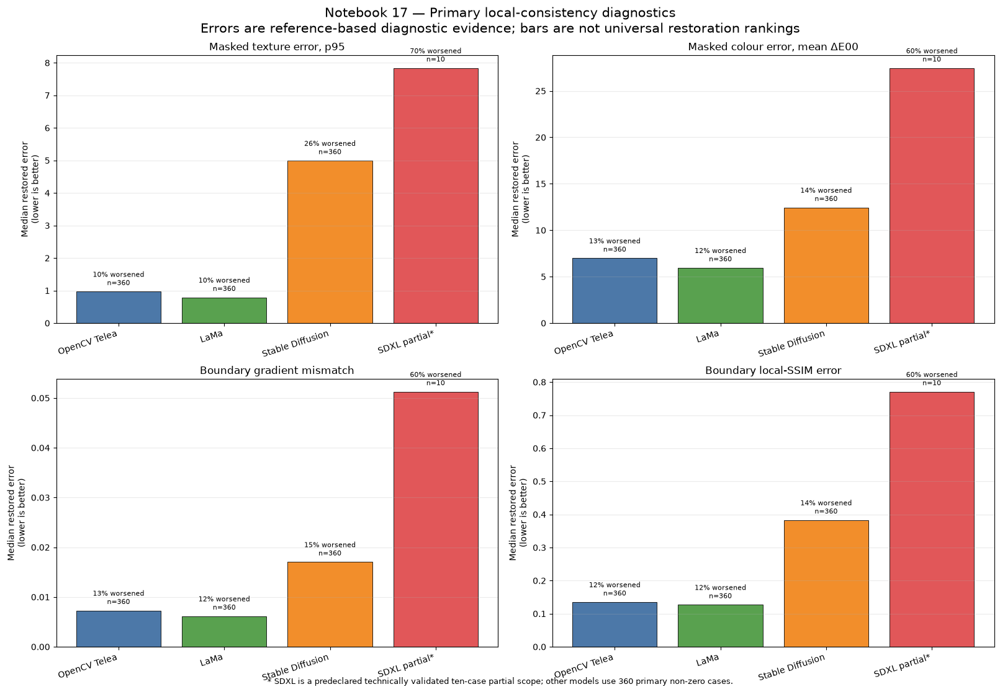

,relative_path,format,mode,width,height,size_bytes,sha256
0,outputs/17_local_consistency_metrics/figures/l...,PNG,RGBA,2900,2009,340100,74cb4c422e60d711a904c47b861a0b4844728fb8611897...


Canonical summary figure rendered.
Path: outputs/17_local_consistency_metrics/figures/local_consistency_summary.png
Dimensions: (2900, 2009)
Size bytes: 340100
SHA-256: 74cb4c422e60d711a904c47b861a0b4844728fb86118979d7429e3c182e963df


In [29]:
# ---------------------------------------------------------------------------
# Four representative metric summaries
# ---------------------------------------------------------------------------

SUMMARY_METRIC_ORDER = [
    "local_texture_error_p95",
    "delta_e_ciede2000_mean",
    "boundary_gradient_mismatch",
    "boundary_local_ssim_map_error",
]

SUMMARY_METRIC_LABELS = {
    "local_texture_error_p95": (
        "Masked texture error, p95"
    ),
    "delta_e_ciede2000_mean": (
        "Masked colour error, mean ΔE00"
    ),
    "boundary_gradient_mismatch": (
        "Boundary gradient mismatch"
    ),
    "boundary_local_ssim_map_error": (
        "Boundary local-SSIM error"
    ),
}

summary_figure, summary_axes = plt.subplots(
    2,
    2,
    figsize=(16, 11),
    constrained_layout=True,
)

for axis, metric_name in zip(
    summary_axes.ravel(),
    SUMMARY_METRIC_ORDER,
):
    metric_rows = (
        representative_metric_distribution_df.loc[
            representative_metric_distribution_df[
                "metric_name"
            ].astype(str).eq(metric_name)
        ]
        .set_index("model_id")
    )

    available_models = [
        model_id
        for model_id in MODEL_ORDER
        if model_id in metric_rows.index
    ]

    restored_medians = [
        float(
            metric_rows.loc[
                model_id,
                "restored_median",
            ]
        )
        for model_id in available_models
    ]

    worsened_fractions = [
        float(
            metric_rows.loc[
                model_id,
                "worsened_fraction",
            ]
        )
        for model_id in available_models
    ]

    candidate_counts = [
        int(
            metric_rows.loc[
                model_id,
                "candidates",
            ]
        )
        for model_id in available_models
    ]

    x_positions = np.arange(
        len(available_models)
    )

    bars = axis.bar(
        x_positions,
        restored_medians,
        color=[
            MODEL_COLOURS[model_id]
            for model_id in available_models
        ],
        edgecolor="black",
        linewidth=0.6,
    )

    axis.set_title(
        SUMMARY_METRIC_LABELS[
            metric_name
        ]
    )
    axis.set_ylabel(
        "Median restored error\n(lower is better)"
    )
    axis.set_xticks(x_positions)
    axis.set_xticklabels(
        [
            MODEL_LABELS[model_id]
            for model_id in available_models
        ],
        rotation=18,
        ha="right",
    )
    axis.grid(
        axis="y",
        alpha=0.25,
    )

    for bar, worsened_fraction, count in zip(
        bars,
        worsened_fractions,
        candidate_counts,
    ):
        axis.annotate(
            (
                f"{worsened_fraction:.0%} worsened\n"
                f"n={count}"
            ),
            xy=(
                bar.get_x()
                + bar.get_width() / 2,
                bar.get_height(),
            ),
            xytext=(0, 5),
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=8,
        )

summary_figure.suptitle(
    (
        "Notebook 17 — Primary local-consistency diagnostics\n"
        "Errors are reference-based diagnostic evidence; "
        "bars are not universal restoration rankings"
    ),
    fontsize=15,
)

summary_figure.text(
    0.5,
    0.002,
    (
        "* SDXL is a predeclared technically validated "
        "ten-case partial scope; other models use 360 "
        "primary non-zero cases."
    ),
    ha="center",
    fontsize=9,
)

summary_figure.savefig(
    OUTPUTS["summary_figure"],
    dpi=180,
    bbox_inches="tight",
)

display(summary_figure)
plt.close(summary_figure)

with Image.open(
    OUTPUTS["summary_figure"]
) as image:
    image.load()

    summary_figure_audit = {
        "relative_path": to_repo_relative(
            OUTPUTS["summary_figure"],
            PROJECT_ROOT,
        ),
        "format": image.format,
        "mode": image.mode,
        "width": image.width,
        "height": image.height,
        "size_bytes": int(
            OUTPUTS[
                "summary_figure"
            ].stat().st_size
        ),
        "sha256": sha256_file(
            OUTPUTS["summary_figure"]
        ),
    }

display(
    pd.DataFrame(
        [summary_figure_audit]
    )
)

print("Canonical summary figure rendered.")
print(
    "Path:",
    summary_figure_audit[
        "relative_path"
    ],
)
print(
    "Dimensions:",
    (
        summary_figure_audit["width"],
        summary_figure_audit["height"],
    ),
)
print(
    "Size bytes:",
    summary_figure_audit[
        "size_bytes"
    ],
)
print(
    "SHA-256:",
    summary_figure_audit["sha256"],
)

In [30]:
# ---------------------------------------------------------------------------
# Candidate lookup
# ---------------------------------------------------------------------------

candidate_worklist_lookup = (
    evaluation_worklist_df
    .set_index("candidate_id")
)

candidate_panel_manifest_frames = []
candidate_panel_audit_records = []

for selection in (
    candidate_panel_selections_df.to_dict(
        orient="records"
    )
):
    candidate_id = selection[
        "candidate_id"
    ]

    candidate_row = (
        candidate_worklist_lookup.loc[
            candidate_id
        ]
    )

    model_slug = MODEL_FILE_SLUGS[
        selection["model_id"]
    ]

    role_slug = (
        "median_texture"
        if selection[
            "selection_role"
        ]
        == "model_median_texture_error"
        else "highest_seam"
    )

    panel_path = (
        OUTPUTS["selected_panels_root"]
        / (
            f"cp_{model_slug}_"
            f"{role_slug}.png"
        )
    )

    candidate_figure = (
        render_candidate_review_panel(
            candidate_row,
            project_root=PROJECT_ROOT,
            config=LOCAL_CONFIG_DOCUMENT,
            scales=canonical_display_scales,
            output_path=panel_path,
            selection_role=selection[
                "selection_role"
            ],
        )
    )

    plt.close(candidate_figure)

    panel_manifest_frame = (
        register_selected_panel(
            panel_path,
            project_root=PROJECT_ROOT,
            selection_role=selection[
                "selection_role"
            ],
            cross_model=False,
            candidate_id=candidate_id,
            case_id=selection["case_id"],
            model_id=selection["model_id"],
            painting_id=selection[
                "painting_id"
            ],
        )
    )

    candidate_panel_manifest_frames.append(
        panel_manifest_frame
    )

    with Image.open(panel_path) as image:
        image.load()

        candidate_panel_audit_records.append(
            {
                **selection,
                "relative_path": (
                    to_repo_relative(
                        panel_path,
                        PROJECT_ROOT,
                    )
                ),
                "format": image.format,
                "mode": image.mode,
                "width": image.width,
                "height": image.height,
                "size_bytes": (
                    panel_path.stat().st_size
                ),
                "sha256": sha256_file(
                    panel_path
                ),
            }
        )

candidate_panel_manifest_df = (
    pd.concat(
        candidate_panel_manifest_frames,
        ignore_index=True,
    )
)

candidate_panel_audit_df = pd.DataFrame(
    candidate_panel_audit_records
)

display(candidate_panel_audit_df)

print("Candidate review-panel rendering complete.")
print(
    "Candidate panels rendered:",
    len(candidate_panel_audit_df),
)
print(
    "Manifest rows:",
    len(candidate_panel_manifest_df),
)
print(
    "Selection roles:",
    candidate_panel_audit_df[
        "selection_role"
    ].value_counts().to_dict(),
)
print(
    "Models:",
    candidate_panel_audit_df[
        "model_id"
    ].value_counts().to_dict(),
)

,selection_role,model_id,candidate_id,case_id,painting_id,metric_name,region_id,selection_value,selection_reference,relative_path,format,mode,width,height,size_bytes,sha256
0,model_highest_seam_error,lama,candidate__lama__canonical__p016__loss_large__c00,canonical__p016__loss_large,p016,boundary_gradient_mismatch,boundary_ring,0.017881,0.017881,outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3258,1589,2005203,bda9201a8e0fc06255c23a02b056e9d03cc331c24ce874...
1,model_median_texture_error,lama,candidate__lama__canonical__p010__loss_large__c00,canonical__p010__loss_large,p010,local_texture_error_p95,masked_region,0.786074,0.785899,outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3258,1589,2396317,2658a170b83527fbae0c34d57b8eae01ec77b92ec81015...
2,model_highest_seam_error,opencv_telea,candidate__opencv_telea__canonical__p016__loss...,canonical__p016__loss_large,p016,boundary_gradient_mismatch,boundary_ring,0.021766,0.021766,outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3258,1589,1953279,1c9255614314ebecfc8147552f552ebf0b91de003ecf22...
3,model_median_texture_error,opencv_telea,candidate__opencv_telea__damage_size__p001__lo...,damage_size__p001__loss_large__size_10pct,p001,local_texture_error_p95,masked_region,0.963948,0.964415,outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3258,1589,1682461,f08473f66a1486543d7eb7a22343ae1346eaed102a711a...
4,model_highest_seam_error,sdxl_inpainting,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,p001,boundary_gradient_mismatch,boundary_ring,0.078041,0.078041,outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3258,1589,1782476,43fd1f03916c056611e63f1f33ccb3f0d24e0007f3e667...
5,model_median_texture_error,sdxl_inpainting,sdxl__37161b5099c0__p00_generic__seed2026,canonical__p039__loss_large,p039,local_texture_error_p95,masked_region,7.651986,7.834756,outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3258,1589,1824740,fd212ceb5d258d7a9197a6309f8533624647ac2737dfe2...
6,model_highest_seam_error,stable_diffusion_inpainting,sd15__p00__s2026__90a2f3553dd5,canonical__p036__scratch_thin,p036,boundary_gradient_mismatch,boundary_ring,0.079360,0.079360,outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3258,1589,1153880,2bc6113fdbbcb8aa1469b842018dcb34a5638fabb13a52...
7,model_median_texture_error,stable_diffusion_inpainting,sd15__p00__s2026__9b665738d67f,synthetic_degradation__p018__water_stain_dirt_...,p018,local_texture_error_p95,masked_region,4.990888,4.989383,outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3258,1589,1869562,a1006d2a23f5bd7fc1580393d4f1115b70683cd5987553...


Candidate review-panel rendering complete.
Candidate panels rendered: 8
Manifest rows: 8
Selection roles: {'model_highest_seam_error': 4, 'model_median_texture_error': 4}
Models: {'lama': 2, 'opencv_telea': 2, 'sdxl_inpainting': 2, 'stable_diffusion_inpainting': 2}


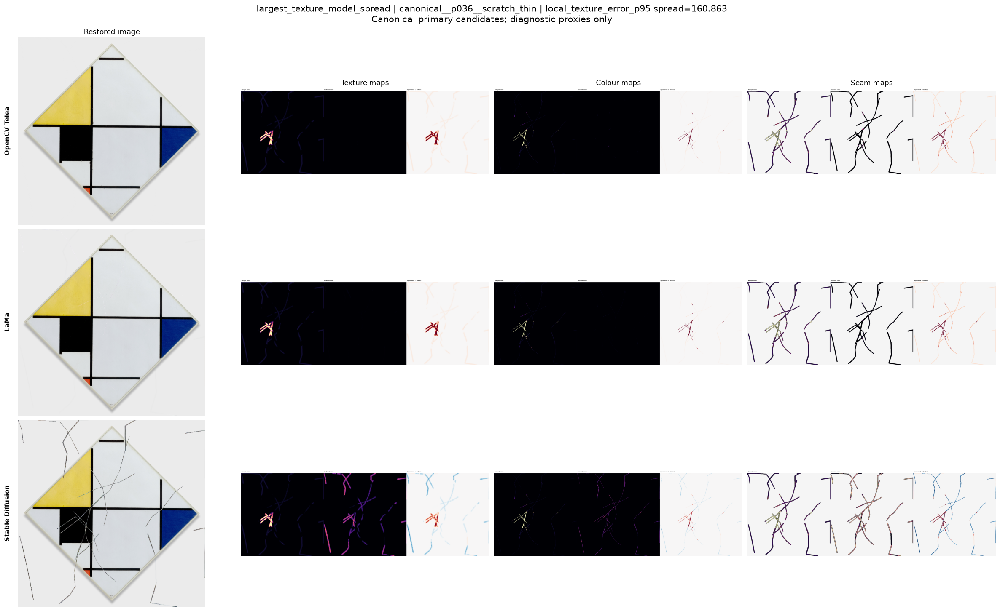

[1/4] Rendered largest_texture_model_spread: xm_texture_spread.png


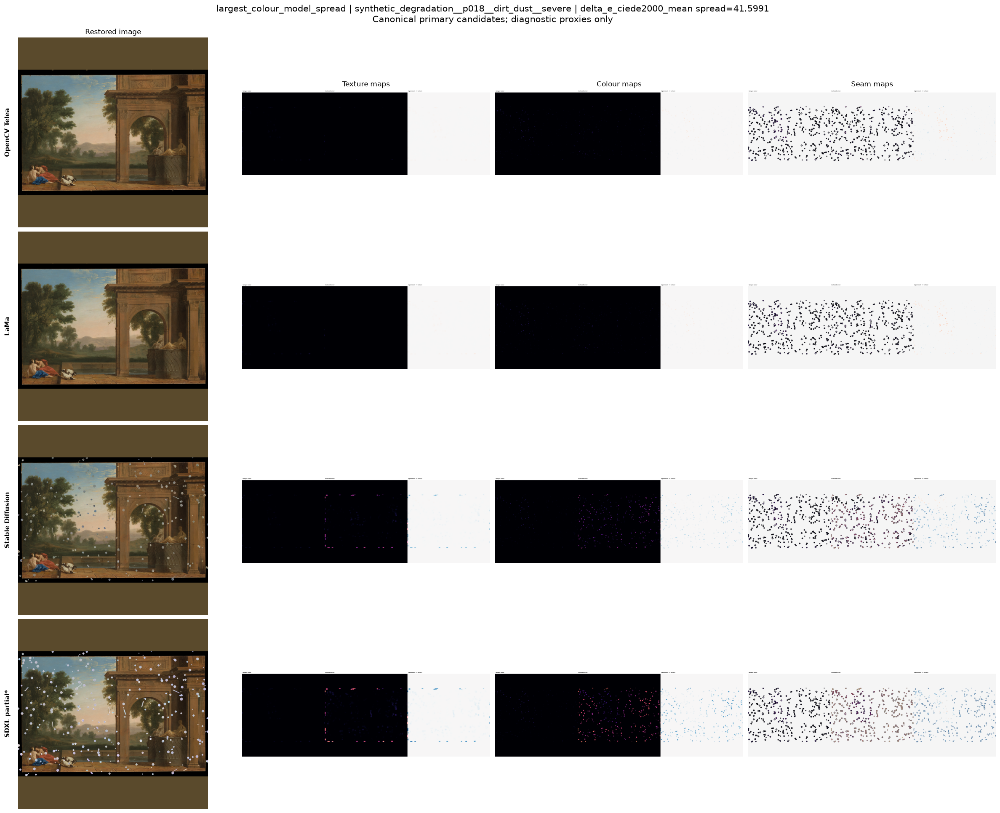

[2/4] Rendered largest_colour_model_spread: xm_colour_spread.png


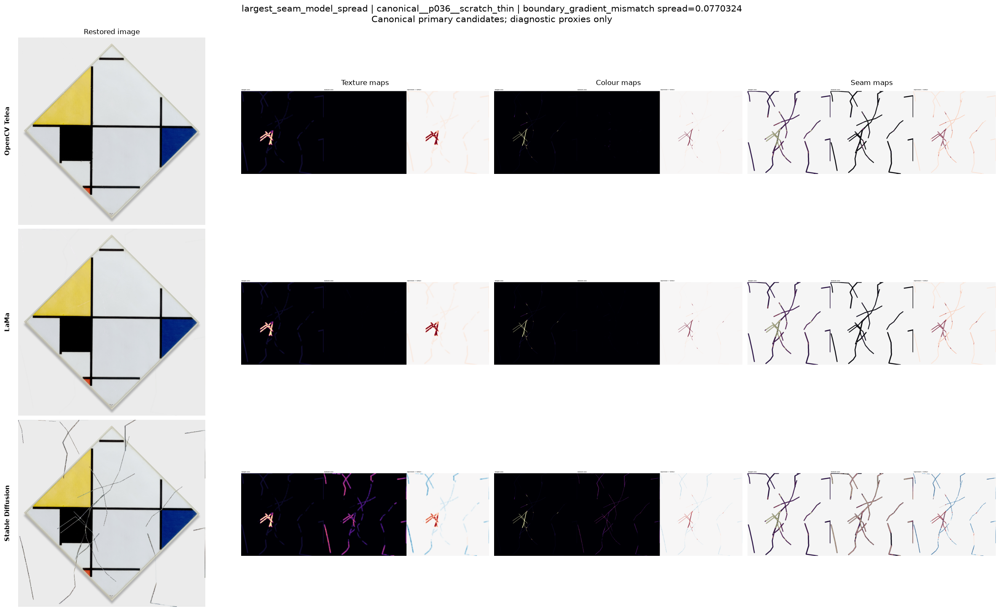

[3/4] Rendered largest_seam_model_spread: xm_seam_spread.png


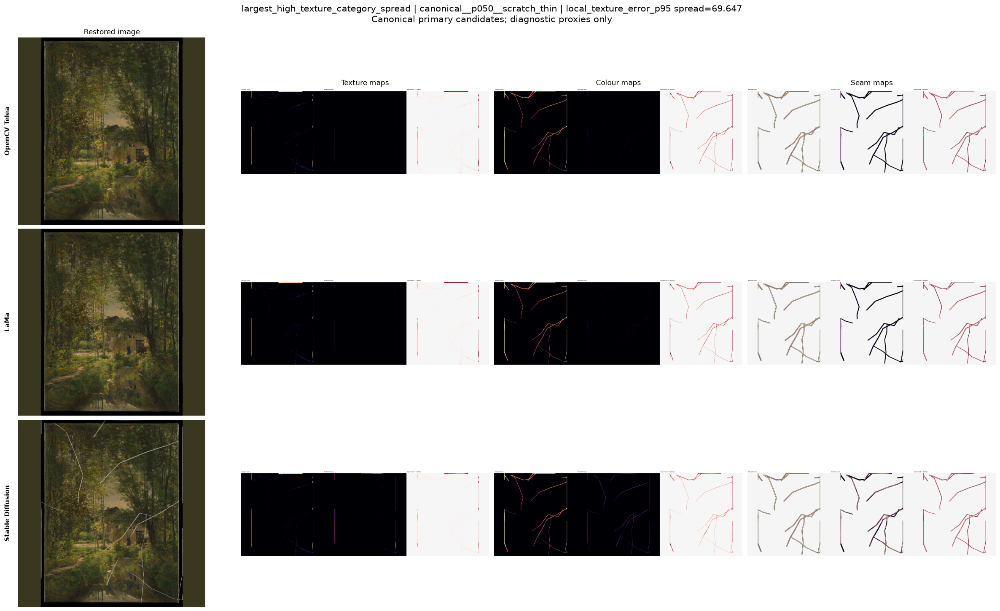

[4/4] Rendered largest_high_texture_category_spread: xm_high_texture_spread.png


,selection_role,metric_name,region_id,category_filter,case_id,painting_id,category,model_count,models,minimum_restored_error,maximum_restored_error,model_spread,observed_models,relative_path,format,mode,width,height,size_bytes,sha256
0,largest_texture_model_spread,local_texture_error_p95,masked_region,,canonical__p036__scratch_thin,p036,abstraction_surrealism,3,"(lama, opencv_telea, stable_diffusion_inpainting)",1.746058,162.608598,160.862540,"(opencv_telea, lama, stable_diffusion_inpainting)",outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3558,2177,1403433,32e16e4aec446daf243f3f19340ed83e1f0eb7f4b91280...
1,largest_colour_model_spread,delta_e_ciede2000_mean,masked_region,,synthetic_degradation__p018__dirt_dust__severe,p018,landscape_natural,4,"(lama, opencv_telea, sdxl_inpainting, stable_d...",2.581260,44.180328,41.599069,"(opencv_telea, lama, stable_diffusion_inpainti...",outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3563,2897,2895519,6afec6f660c303083e8e721b899d284ab84bb35cf41ac3...
2,largest_seam_model_spread,boundary_gradient_mismatch,boundary_ring,,canonical__p036__scratch_thin,p036,abstraction_surrealism,3,"(lama, opencv_telea, stable_diffusion_inpainting)",0.002327,0.079360,0.077032,"(opencv_telea, lama, stable_diffusion_inpainting)",outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3558,2177,1399329,73a0b80895b44b835f4982a62a9d96c0c04cbefdf4a2dd...
3,largest_high_texture_category_spread,local_texture_error_p95,masked_region,high_texture_brushwork,canonical__p050__scratch_thin,p050,high_texture_brushwork,3,"(lama, opencv_telea, stable_diffusion_inpainting)",0.328817,69.975805,69.646988,"(opencv_telea, lama, stable_diffusion_inpainting)",outputs/17_local_consistency_metrics/figures/s...,PNG,RGBA,3558,2177,2551659,be282613b97af6577df3b0e8950e862a37a206e3c38a23...


Cross-model review-panel rendering complete.
Cross-model panels rendered: 4
Manifest rows: 4
Selection roles: ['largest_texture_model_spread', 'largest_colour_model_spread', 'largest_seam_model_spread', 'largest_high_texture_category_spread']


In [32]:
# ---------------------------------------------------------------------------
# Render the four deterministic cross-model review panels
# ---------------------------------------------------------------------------

def resolve_notebook_image_path(path_value):
    image_path = Path(str(path_value))

    if not image_path.is_absolute():
        image_path = PROJECT_ROOT / image_path

    return image_path


def load_panel_image(path_value):
    image_path = resolve_notebook_image_path(
        path_value
    )

    if not image_path.is_file():
        raise FileNotFoundError(
            f"Panel image not found: {image_path}"
        )

    with Image.open(image_path) as image:
        image.load()
        return np.asarray(
            image.convert("RGB")
        ).copy()


def get_candidate_map_panel(
    candidate_id,
    map_type,
):
    matching_rows = (
        canonical_candidate_map_manifest_df.loc[
            canonical_candidate_map_manifest_df[
                "candidate_id"
            ].astype(str).eq(
                str(candidate_id)
            )
            & canonical_candidate_map_manifest_df[
                "map_type"
            ].astype(str).eq(
                str(map_type)
            )
            & canonical_candidate_map_manifest_df[
                "asset_kind"
            ].astype(str).eq(
                "candidate_map"
            )
        ]
        .copy()
    )

    if len(matching_rows) != 1:
        raise RuntimeError(
            "Expected exactly one candidate map for "
            f"candidate_id={candidate_id!r}, "
            f"map_type={map_type!r}; "
            f"found {len(matching_rows)}."
        )

    return load_panel_image(
        matching_rows.iloc[0][
            "relative_path"
        ]
    )


def render_cross_model_panel(
    selection,
    output_path,
):
    case_id = str(selection["case_id"])

    case_candidates_df = (
        evaluation_worklist_df.loc[
            evaluation_worklist_df[
                "case_id"
            ].astype(str).eq(case_id)
            & evaluation_worklist_df[
                "execution_role"
            ].astype(str).eq(
                "primary"
            )
            & ~evaluation_worklist_df[
                "is_zero_control"
            ].astype(bool)
            & evaluation_worklist_df[
                "model_id"
            ].astype(str).isin(
                MODEL_ORDER
            )
        ]
        .copy()
    )

    case_candidates_df[
        "model_sort_order"
    ] = pd.Categorical(
        case_candidates_df["model_id"],
        categories=MODEL_ORDER,
        ordered=True,
    )

    case_candidates_df = (
        case_candidates_df
        .sort_values(
            [
                "model_sort_order",
                "candidate_id",
            ],
            kind="stable",
        )
        .reset_index(drop=True)
    )

    observed_models = (
        case_candidates_df[
            "model_id"
        ]
        .astype(str)
        .tolist()
    )

    if len(case_candidates_df) < 3:
        raise RuntimeError(
            "Cross-model panel requires at least "
            f"three primary models for {case_id!r}; "
            f"found {observed_models}."
        )

    if (
        case_candidates_df[
            "model_id"
        ].astype(str).duplicated().any()
    ):
        raise RuntimeError(
            "Cross-model panel found duplicate primary "
            f"model rows for {case_id!r}: "
            f"{observed_models}"
        )

    row_count = len(case_candidates_df)

    figure, axes = plt.subplots(
        row_count,
        4,
        figsize=(
            24,
            max(6.0, 4.8 * row_count),
        ),
        constrained_layout=True,
        squeeze=False,
    )

    column_titles = [
        "Restored image",
        "Texture maps",
        "Colour maps",
        "Seam maps",
    ]

    for row_index, candidate_row in (
        case_candidates_df.iterrows()
    ):
        candidate_id = str(
            candidate_row["candidate_id"]
        )

        model_id = str(
            candidate_row["model_id"]
        )

        restored_image = load_panel_image(
            candidate_row["restored_path"]
        )

        panel_images = [
            restored_image,
            get_candidate_map_panel(
                candidate_id,
                "texture",
            ),
            get_candidate_map_panel(
                candidate_id,
                "colour",
            ),
            get_candidate_map_panel(
                candidate_id,
                "seam",
            ),
        ]

        for column_index, (
            axis,
            panel_image,
        ) in enumerate(
            zip(
                axes[row_index],
                panel_images,
            )
        ):
            axis.imshow(panel_image)
            axis.axis("off")

            if row_index == 0:
                axis.set_title(
                    column_titles[column_index],
                    fontsize=12,
                )

        axes[row_index, 0].text(
            -0.04,
            0.5,
            MODEL_LABELS[model_id],
            transform=(
                axes[row_index, 0].transAxes
            ),
            rotation=90,
            ha="right",
            va="center",
            fontsize=11,
            fontweight="bold",
        )

    figure.suptitle(
        (
            f"{selection['selection_role']} | "
            f"{case_id} | "
            f"{selection['metric_name']} "
            f"spread={selection['model_spread']:.6g}\n"
            "Canonical primary candidates; "
            "diagnostic proxies only"
        ),
        fontsize=15,
    )

    output_path.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    figure.savefig(
        output_path,
        dpi=150,
        bbox_inches="tight",
    )

    return figure, observed_models


cross_model_filename_by_role = {
    "largest_texture_model_spread": (
        "xm_texture_spread.png"
    ),
    "largest_colour_model_spread": (
        "xm_colour_spread.png"
    ),
    "largest_seam_model_spread": (
        "xm_seam_spread.png"
    ),
    "largest_high_texture_category_spread": (
        "xm_high_texture_spread.png"
    ),
}

cross_model_panel_manifest_frames = []
cross_model_panel_audit_records = []

cross_model_selection_records = (
    cross_model_selections_df.to_dict(
        orient="records"
    )
)

for panel_number, selection in enumerate(
    cross_model_selection_records,
    start=1,
):
    selection_role = str(
        selection["selection_role"]
    )

    if (
        selection_role
        not in cross_model_filename_by_role
    ):
        raise KeyError(
            "No compact filename configured for "
            f"selection role {selection_role!r}."
        )

    panel_path = (
        OUTPUTS["selected_panels_root"]
        / cross_model_filename_by_role[
            selection_role
        ]
    )

    (
        cross_model_figure,
        observed_panel_models,
    ) = render_cross_model_panel(
        selection,
        panel_path,
    )

    display(cross_model_figure)
    plt.close(cross_model_figure)

    panel_manifest_frame = (
        register_selected_panel(
            panel_path,
            project_root=PROJECT_ROOT,
            selection_role=selection_role,
            cross_model=True,
            candidate_id="",
            case_id=str(
                selection["case_id"]
            ),
            model_id="",
            painting_id=str(
                selection["painting_id"]
            ),
        )
    )

    cross_model_panel_manifest_frames.append(
        panel_manifest_frame
    )

    with Image.open(panel_path) as image:
        image.load()

        cross_model_panel_audit_records.append(
            {
                **selection,
                "observed_models": tuple(
                    observed_panel_models
                ),
                "relative_path": (
                    to_repo_relative(
                        panel_path,
                        PROJECT_ROOT,
                    )
                ),
                "format": image.format,
                "mode": image.mode,
                "width": image.width,
                "height": image.height,
                "size_bytes": (
                    panel_path.stat().st_size
                ),
                "sha256": sha256_file(
                    panel_path
                ),
            }
        )

    print(
        f"[{panel_number}/"
        f"{len(cross_model_selection_records)}] "
        f"Rendered {selection_role}: "
        f"{panel_path.name}"
    )

cross_model_panel_manifest_df = (
    pd.concat(
        cross_model_panel_manifest_frames,
        ignore_index=True,
    )
)

cross_model_panel_audit_df = pd.DataFrame(
    cross_model_panel_audit_records
)

display(cross_model_panel_audit_df)

print("Cross-model review-panel rendering complete.")
print(
    "Cross-model panels rendered:",
    len(cross_model_panel_audit_df),
)
print(
    "Manifest rows:",
    len(cross_model_panel_manifest_df),
)
print(
    "Selection roles:",
    cross_model_panel_audit_df[
        "selection_role"
    ].tolist(),
)

In [33]:
# ---------------------------------------------------------------------------
# Assemble and validate all selected-panel records
# ---------------------------------------------------------------------------

selected_panel_manifest_df = (
    pd.concat(
        [
            candidate_panel_manifest_df,
            cross_model_panel_manifest_df,
        ],
        ignore_index=True,
    )
)

selected_panel_validation = (
    validate_map_manifest(
        selected_panel_manifest_df,
        project_root=PROJECT_ROOT,
        verify_checksums=True,
    )
)

final_map_manifest_df = (
    pd.concat(
        [
            candidate_map_manifest_df,
            selected_panel_manifest_df,
        ],
        ignore_index=True,
    )
    .sort_values(
        [
            "asset_kind",
            "model_id",
            "case_id",
            "candidate_id",
            "map_type",
            "map_image_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

final_map_manifest_validation = (
    validate_map_manifest(
        final_map_manifest_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)

write_dataframe_atomic(
    final_map_manifest_df,
    OUTPUTS["map_manifest"],
    attempts=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_retry_seconds"
    ],
)

final_map_manifest_reloaded_df = (
    pd.read_csv(
        OUTPUTS["map_manifest"],
        low_memory=False,
    )
)

final_map_manifest_schema = (
    validate_dataframe(
        final_map_manifest_reloaded_df,
        LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

final_reloaded_map_validation = (
    validate_map_manifest(
        final_map_manifest_reloaded_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)

(
    final_map_manifest_reload_equivalent,
    final_map_manifest_reload_comparison_df,
) = compare_map_manifest_roundtrip(
    final_map_manifest_df,
    final_map_manifest_reloaded_df,
)


# ---------------------------------------------------------------------------
# Filesystem and manifest reconciliation
# ---------------------------------------------------------------------------

selected_manifest_paths = set(
    selected_panel_manifest_df[
        "relative_path"
    ].astype(str)
)

selected_filesystem_paths = {
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in OUTPUTS[
        "selected_panels_root"
    ].glob("*.png")
}

selected_panel_type_counts = {
    str(map_type): int(count)
    for map_type, count in (
        selected_panel_manifest_df[
            "map_type"
        ].value_counts().items()
    )
}

expected_selected_panel_type_counts = {
    "local_consistency_candidate_panel": (
        EXPECTED_COUNTS[
            "selected_candidate_panels"
        ]
    ),
    (
        "cross_model_"
        "local_consistency_panel"
    ): (
        EXPECTED_COUNTS[
            "selected_cross_model_panels"
        ]
    ),
}

candidate_role_counts = {
    str(role): int(count)
    for role, count in (
        candidate_panel_manifest_df[
            "selection_role"
        ].value_counts().items()
    )
}

expected_candidate_role_counts = {
    role: len(MODEL_ORDER)
    for role in LOCAL_CONFIG[
        "representative_panels"
    ][
        "candidate_roles"
    ]
}

observed_cross_model_roles = set(
    cross_model_panel_manifest_df[
        "selection_role"
    ].astype(str)
)

expected_cross_model_roles = set(
    LOCAL_CONFIG[
        "representative_panels"
    ][
        "cross_model_roles"
    ]
)

maximum_selected_filename_length = max(
    len(
        Path(relative_path).name
    )
    for relative_path in (
        selected_manifest_paths
    )
)

invalid_selected_panel_metadata = int(
    (
        pd.to_numeric(
            selected_panel_manifest_df[
                "size_bytes"
            ],
            errors="coerce",
        ).le(0)
        | pd.to_numeric(
            selected_panel_manifest_df[
                "width"
            ],
            errors="coerce",
        ).le(0)
        | pd.to_numeric(
            selected_panel_manifest_df[
                "height"
            ],
            errors="coerce",
        ).le(0)
        | ~selected_panel_manifest_df[
            "format"
        ].astype(str).eq("PNG")
        | ~selected_panel_manifest_df[
            "status"
        ].astype(str).eq("passed")
    ).sum()
)

final_manifest_asset_counts = {
    str(asset_kind): int(count)
    for asset_kind, count in (
        final_map_manifest_reloaded_df[
            "asset_kind"
        ].value_counts().items()
    )
}

summary_figure_valid = bool(
    OUTPUTS["summary_figure"].is_file()
    and summary_figure_audit[
        "format"
    ] == "PNG"
    and summary_figure_audit[
        "size_bytes"
    ] > 0
    and len(
        summary_figure_audit["sha256"]
    )
    == 64
)

display(selected_panel_manifest_df)
display(final_map_manifest_reload_comparison_df)


# ---------------------------------------------------------------------------
# Batch 7 validation
# ---------------------------------------------------------------------------

def add_batch_7_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_7_analysis_visualization"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_7_check(
    "candidate_panel_selection_count",
    "Two deterministic candidate panels are selected per model.",
    EXPECTED_COUNTS[
        "selected_candidate_panels"
    ],
    len(candidate_panel_selections_df),
    (
        len(candidate_panel_selections_df)
        == EXPECTED_COUNTS[
            "selected_candidate_panels"
        ]
    ),
)

add_batch_7_check(
    "candidate_panel_roles",
    "Each candidate selection role occurs once for every model.",
    expected_candidate_role_counts,
    candidate_role_counts,
    (
        candidate_role_counts
        == expected_candidate_role_counts
    ),
)

add_batch_7_check(
    "cross_model_panel_count",
    "Four deterministic cross-model panels were selected.",
    EXPECTED_COUNTS[
        "selected_cross_model_panels"
    ],
    len(cross_model_selections_df),
    (
        len(cross_model_selections_df)
        == EXPECTED_COUNTS[
            "selected_cross_model_panels"
        ]
    ),
)

add_batch_7_check(
    "cross_model_panel_roles",
    "Every configured cross-model selection role is represented.",
    sorted(expected_cross_model_roles),
    sorted(observed_cross_model_roles),
    (
        observed_cross_model_roles
        == expected_cross_model_roles
    ),
)

add_batch_7_check(
    "selected_panel_manifest_count",
    "The selected-panel manifest contains exactly 12 rows.",
    EXPECTED_COUNTS[
        "selected_panels_total"
    ],
    len(selected_panel_manifest_df),
    (
        len(selected_panel_manifest_df)
        == EXPECTED_COUNTS[
            "selected_panels_total"
        ]
    ),
)

add_batch_7_check(
    "selected_panel_type_counts",
    "Candidate and cross-model panel counts match the contract.",
    expected_selected_panel_type_counts,
    selected_panel_type_counts,
    (
        selected_panel_type_counts
        == expected_selected_panel_type_counts
    ),
)

add_batch_7_check(
    "selected_panel_validation",
    "Every selected panel passes schema, decoding, and checksum validation.",
    True,
    selected_panel_validation,
    selected_panel_validation["passed"],
)

add_batch_7_check(
    "selected_panel_filesystem",
    "Selected-panel manifest paths match the PNG directory exactly.",
    sorted(selected_manifest_paths),
    sorted(selected_filesystem_paths),
    (
        selected_manifest_paths
        == selected_filesystem_paths
    ),
)

add_batch_7_check(
    "selected_panel_metadata",
    "Every selected panel has valid image metadata.",
    0,
    invalid_selected_panel_metadata,
    invalid_selected_panel_metadata == 0,
)

add_batch_7_check(
    "selected_panel_filename_lengths",
    "Selected-panel filenames satisfy the compact filename policy.",
    (
        "<= "
        f"{LOCAL_CONFIG['execution']['maximum_map_filename_characters']}"
    ),
    maximum_selected_filename_length,
    (
        maximum_selected_filename_length
        <= LOCAL_CONFIG[
            "execution"
        ][
            "maximum_map_filename_characters"
        ]
    ),
)

add_batch_7_check(
    "summary_figure",
    "The canonical summary figure is a valid non-empty PNG.",
    True,
    summary_figure_audit,
    summary_figure_valid,
)

add_batch_7_check(
    "final_map_manifest_count",
    "Candidate maps and selected panels produce the final manifest size.",
    EXPECTED_COUNTS[
        "map_manifest_rows"
    ],
    len(
        final_map_manifest_reloaded_df
    ),
    (
        len(
            final_map_manifest_reloaded_df
        )
        == EXPECTED_COUNTS[
            "map_manifest_rows"
        ]
    ),
)

add_batch_7_check(
    "final_manifest_asset_counts",
    "The final manifest retains all candidate maps and selected panels.",
    {
        "candidate_map": EXPECTED_COUNTS[
            "candidate_map_images"
        ],
        "selected_panel": EXPECTED_COUNTS[
            "selected_panels_total"
        ],
    },
    final_manifest_asset_counts,
    (
        final_manifest_asset_counts
        == {
            "candidate_map": (
                EXPECTED_COUNTS[
                    "candidate_map_images"
                ]
            ),
            "selected_panel": (
                EXPECTED_COUNTS[
                    "selected_panels_total"
                ]
            ),
        }
    ),
)

add_batch_7_check(
    "final_map_manifest_schema",
    "The reloaded final map manifest satisfies its exact schema.",
    True,
    final_map_manifest_schema.to_dict(),
    final_map_manifest_schema.passed,
)

add_batch_7_check(
    "final_map_manifest_validation",
    "Every final manifest path and image remains valid.",
    True,
    final_reloaded_map_validation,
    final_reloaded_map_validation[
        "passed"
    ],
)

add_batch_7_check(
    "final_map_manifest_reload",
    "The final map manifest is unchanged after CSV reload.",
    True,
    {
        "equivalent": (
            final_map_manifest_reload_equivalent
        ),
        "mismatched_columns": int(
            (
                ~final_map_manifest_reload_comparison_df[
                    "matches"
                ]
            ).sum()
        ),
    },
    final_map_manifest_reload_equivalent,
)

add_batch_7_check(
    "inline_cross_model_previews",
    "All four cross-model panels are embedded for human review.",
    LOCAL_CONFIG[
        "representative_panels"
    ][
        "preview_panel_count"
    ],
    len(cross_model_panel_audit_df),
    (
        len(cross_model_panel_audit_df)
        == LOCAL_CONFIG[
            "representative_panels"
        ][
            "preview_panel_count"
        ]
    ),
)


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_7_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(
            "batch_7_analysis_visualization"
        )
    ]
    .reset_index(drop=True)
)

display(batch_7_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 17 Batch 7 summary")
print("---------------------------")
print(
    "Summary figure:",
    summary_figure_audit[
        "relative_path"
    ],
)
print(
    "Candidate panels:",
    len(candidate_panel_audit_df),
)
print(
    "Cross-model panels:",
    len(cross_model_panel_audit_df),
)
print(
    "Selected-panel rows:",
    len(selected_panel_manifest_df),
)
print(
    "Final map-manifest rows:",
    len(
        final_map_manifest_reloaded_df
    ),
)
print(
    "Final manifest asset counts:",
    final_manifest_asset_counts,
)
print(
    "Batch 7 validation checks:",
    len(batch_7_validation_df),
)
print(
    "Blocking failures across Batches 1–7:",
    len(VALIDATION.blocking_failures),
)
print(
    "Batch 7 passed: the summary figure, eight "
    "candidate panels, four cross-model panels, and "
    "final 3,282-row map manifest are complete."
)

,map_image_id,asset_kind,map_id,candidate_id,case_id,model_id,painting_id,map_type,selection_role,relative_path,...,cmap,vmin,vmax,center,scale_scope,quantization_policy,no_data_policy,renderer_version,status,issue
0,lcmi_fe6893faf9481d222150,selected_panel,lcp_b594b6b033318bd4,candidate__lama__canonical__p016__loss_large__c00,canonical__p016__loss_large,lama,p016,local_consistency_candidate_panel,model_highest_seam_error,outputs/17_local_consistency_metrics/figures/s...,...,mixed_panel,0.0,0.0,NaN,panel-specific layout using canonical global f...,matplotlib PNG presentation panel,not_applicable,local_consistency_map_renderer.v1,passed,
1,lcmi_96f78b7ef4af8f070a18,selected_panel,lcp_4c15282d350a2fca,candidate__lama__canonical__p010__loss_large__c00,canonical__p010__loss_large,lama,p010,local_consistency_candidate_panel,model_median_texture_error,outputs/17_local_consistency_metrics/figures/s...,...,mixed_panel,0.0,0.0,NaN,panel-specific layout using canonical global f...,matplotlib PNG presentation panel,not_applicable,local_consistency_map_renderer.v1,passed,
2,lcmi_21895053f49b9adb7281,selected_panel,lcp_cc015eb38ca5fb00,candidate__opencv_telea__canonical__p016__loss...,canonical__p016__loss_large,opencv_telea,p016,local_consistency_candidate_panel,model_highest_seam_error,outputs/17_local_consistency_metrics/figures/s...,...,mixed_panel,0.0,0.0,NaN,panel-specific layout using canonical global f...,matplotlib PNG presentation panel,not_applicable,local_consistency_map_renderer.v1,passed,
3,lcmi_c6cc6ed6b9c2610b4693,selected_panel,lcp_083897e147fbefb3,candidate__opencv_telea__damage_size__p001__lo...,damage_size__p001__loss_large__size_10pct,opencv_telea,p001,local_consistency_candidate_panel,model_median_texture_error,outputs/17_local_consistency_metrics/figures/s...,...,mixed_panel,0.0,0.0,NaN,panel-specific layout using canonical global f...,matplotlib PNG presentation panel,not_applicable,local_consistency_map_renderer.v1,passed,
4,lcmi_68eee3ca465e1b1fd353,selected_panel,lcp_acb59973c0c43cbf,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,sdxl_inpainting,p001,local_consistency_candidate_panel,model_highest_seam_error,outputs/17_local_consistency_metrics/figures/s...,...,mixed_panel,0.0,0.0,NaN,panel-specific layout using canonical global f...,matplotlib PNG presentation panel,not_applicable,local_consistency_map_renderer.v1,passed,
5,lcmi_ab21b1b315d510a86e0d,selected_panel,lcp_8d45187311913385,sdxl__37161b5099c0__p00_generic__seed2026,canonical__p039__loss_large,sdxl_inpainting,p039,local_consistency_candidate_panel,model_median_texture_error,outputs/17_local_consistency_metrics/figures/s...,...,mixed_panel,0.0,0.0,NaN,panel-specific layout using canonical global f...,matplotlib PNG presentation panel,not_applicable,local_consistency_map_renderer.v1,passed,
6,lcmi_7e7b6462e4337d4777e6,selected_panel,lcp_32df45e7e7a32d52,sd15__p00__s2026__90a2f3553dd5,canonical__p036__scratch_thin,stable_diffusion_inpainting,p036,local_consistency_candidate_panel,model_highest_seam_error,outputs/17_local_consistency_metrics/figures/s...,...,mixed_panel,0.0,0.0,NaN,panel-specific layout using canonical global f...,matplotlib PNG presentation panel,not_applicable,local_consistency_map_renderer.v1,passed,
7,lcmi_b111212f7d28789e060f,selected_panel,lcp_a2f85bc2f25b4132,sd15__p00__s2026__9b665738d67f,synthetic_degradation__p018__water_stain_dirt_...,stable_diffusion_inpainting,p018,local_consistency_candidate_panel,model_median_texture_error,outputs/17_local_consistency_metrics/figures/s...,...,mixed_panel,0.0,0.0,NaN,panel-specific layout using canonical global f...,matplotlib PNG presentation panel,not_applicable,local_consistency_map_renderer.v1,passed,
8,lcmi_cccfcab0258e86c6bfd5,selected_panel,lcp_b1417a1276af85c2,,canonical__p036__scratch_thin,,p036,cross_model_local_consistency_panel,largest_texture_model_spread,outputs/17_local_consistency_metrics/figures/s...,...,mixed_panel,0.0,0.0,NaN,panel-specific layout usi

,column,matches
0,map_image_id,True
1,asset_kind,True
2,map_id,True
3,candidate_id,True
4,case_id,True
5,model_id,True
6,painting_id,True
7,map_type,True
8,selection_role,True
9,relative_path,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_analysis_visualization,candidate_panel_selection_count,Two deterministic candidate panels are selecte...,blocking,8,8,True,
1,batch_7_analysis_visualization,candidate_panel_roles,Each candidate selection role occurs once for ...,blocking,"{""model_highest_seam_error"": 4, ""model_median_...","{""model_highest_seam_error"": 4, ""model_median_...",True,
2,batch_7_analysis_visualization,cross_model_panel_count,Four deterministic cross-model panels were sel...,blocking,4,4,True,
3,batch_7_analysis_visualization,cross_model_panel_roles,Every configured cross-model selection role is...,blocking,"[""largest_colour_model_spread"", ""largest_high_...","[""largest_colour_model_spread"", ""largest_high_...",True,
4,batch_7_analysis_visualization,selected_panel_manifest_count,The selected-panel manifest contains exactly 1...,blocking,12,12,True,
5,batch_7_analysis_visualization,selected_panel_type_counts,Candidate and cross-model panel counts match t...,blocking,"{""cross_model_local_consistency_panel"": 4, ""lo...","{""cross_model_local_consistency_panel"": 4, ""lo...",True,
6,batch_7_analysis_visualization,selected_panel_validation,"Every selected panel passes schema, decoding, ...",blocking,True,"{""checksum_mismatches"": [], ""duplicate_primary...",True,
7,batch_7_analysis_visualization,selected_panel_filesystem,Selected-panel manifest paths match the PNG di...,blocking,"[""outputs/17_local_consistency_metrics/figures...","[""outputs/17_local_consistency_metrics/figures...",True,
8,batch_7_analysis_visualization,selected_panel_metadata,Every selected panel has valid image metadata.,blocking,0,0,True,
9,batch_7_analysis_visualization,selected_panel_filename_lengths,Selected-panel filenames satisfy the compact f...,blocking,<= 32,27,True,


Notebook 17 Batch 7 summary
---------------------------
Summary figure: outputs/17_local_consistency_metrics/figures/local_consistency_summary.png
Candidate panels: 8
Cross-model panels: 4
Selected-panel rows: 12
Final map-manifest rows: 3282
Final manifest asset counts: {'candidate_map': 3270, 'selected_panel': 12}
Batch 7 validation checks: 17
Blocking failures across Batches 1–7: 0
Batch 7 passed: the summary figure, eight candidate panels, four cross-model panels, and final 3,282-row map manifest are complete.


### Roadmap-level grouped summaries

The roadmap requires local-consistency evidence to be summarized by model, artwork category and style, damage type, damage percentage, and experiment.

To avoid creating another redundant CSV, this section constructs one normalized in-memory summary using the four representative texture, colour, and seam diagnostics already selected for scientific interpretation. Candidate counts, case counts, painting counts, restored-error distributions, improvement distributions, and worsening fractions retain the candidate-level dependency structure.

These summaries are descriptive diagnostic evidence. They are not model rankings, conservation thresholds, or independent-painting statistical tests.

In [35]:
# ---------------------------------------------------------------------------
# Representative metric scope for roadmap-level grouped summaries
# ---------------------------------------------------------------------------

ROADMAP_GROUPING_STAGE = (
    "batch_7_grouped_roadmap_summaries"
)

representative_metric_keys = {
    (
        specification["metric_name"],
        specification["region_id"],
    )
    for specification in representative_metric_specs
}

representative_scope_mask = pd.Series(
    [
        (
            str(metric_name),
            str(region_id),
        )
        in representative_metric_keys
        for metric_name, region_id in zip(
            primary_nonzero_metrics_df[
                "metric_name"
            ],
            primary_nonzero_metrics_df[
                "region_id"
            ],
        )
    ],
    index=primary_nonzero_metrics_df.index,
)

roadmap_summary_source_df = (
    primary_nonzero_metrics_df.loc[
        representative_scope_mask
    ]
    .copy()
)

artwork_grouping_df = (
    artworks_df[
        [
            "painting_id",
            "category",
            "style_or_period",
        ]
    ]
    .drop_duplicates(
        subset=["painting_id"]
    )
)

roadmap_summary_source_df = (
    roadmap_summary_source_df.merge(
        artwork_grouping_df,
        on="painting_id",
        how="left",
        validate="many_to_one",
    )
)

for metadata_column in (
    "category",
    "style_or_period",
):
    roadmap_summary_source_df[
        metadata_column
    ] = (
        roadmap_summary_source_df[
            metadata_column
        ]
        .fillna("")
        .astype(str)
        .str.strip()
        .replace("", "unspecified")
    )


# ---------------------------------------------------------------------------
# Human-readable damage-percentage grouping
# ---------------------------------------------------------------------------

def format_damage_percentage(value):
    numeric_value = pd.to_numeric(
        pd.Series([value]),
        errors="coerce",
    ).iloc[0]

    if pd.isna(numeric_value):
        return "not_applicable"

    return f"{100.0 * float(numeric_value):.1f}%"


roadmap_summary_source_df[
    "damage_percentage_group"
] = roadmap_summary_source_df[
    "target_damage_fraction"
].map(format_damage_percentage)


# ---------------------------------------------------------------------------
# One normalized summary across all required grouping dimensions
# ---------------------------------------------------------------------------

roadmap_grouping_columns = {
    "model": "model_id",
    "category": "category",
    "style_or_period": "style_or_period",
    "damage_type": (
        "damage_or_degradation_type"
    ),
    "damage_percentage": (
        "damage_percentage_group"
    ),
    "experiment": "experiment_id",
}

roadmap_grouped_summary_frames = []

for (
    grouping_dimension,
    grouping_column,
) in roadmap_grouping_columns.items():
    groupby_columns = ["model_id"]

    # The model-only summary must not group by model_id twice.
    if grouping_column != "model_id":
        groupby_columns.append(
            grouping_column
        )

    groupby_columns.extend(
        [
            "metric_family",
            "metric_name",
            "region_id",
        ]
    )

    grouped_frame = (
        roadmap_summary_source_df
        .groupby(
            groupby_columns,
            as_index=False,
            dropna=False,
            sort=True,
        )
        .agg(
            rows=(
                "local_consistency_id",
                "size",
            ),
            candidates=(
                "candidate_id",
                "nunique",
            ),
            cases=(
                "case_id",
                "nunique",
            ),
            paintings=(
                "painting_id",
                "nunique",
            ),
            restored_median=(
                "restored_value",
                "median",
            ),
            restored_p95=(
                "restored_value",
                lambda values: float(
                    pd.to_numeric(
                        values,
                        errors="coerce",
                    ).quantile(0.95)
                ),
            ),
            improvement_median=(
                "improvement_value",
                "median",
            ),
            improvement_p05=(
                "improvement_value",
                lambda values: float(
                    pd.to_numeric(
                        values,
                        errors="coerce",
                    ).quantile(0.05)
                ),
            ),
            worsened_fraction=(
                "improvement_value",
                lambda values: float(
                    pd.to_numeric(
                        values,
                        errors="coerce",
                    ).lt(0).mean()
                ),
            ),
        )
    )

    if grouping_column == "model_id":
        grouped_frame[
            "group_value"
        ] = grouped_frame[
            "model_id"
        ].astype(str)
    else:
        grouped_frame = (
            grouped_frame.rename(
                columns={
                    grouping_column: (
                        "group_value"
                    ),
                }
            )
        )

    grouped_frame.insert(
        0,
        "grouping_dimension",
        grouping_dimension,
    )

    grouped_frame = grouped_frame[
        [
            "grouping_dimension",
            "group_value",
            "model_id",
            "metric_family",
            "metric_name",
            "region_id",
            "rows",
            "candidates",
            "cases",
            "paintings",
            "restored_median",
            "restored_p95",
            "improvement_median",
            "improvement_p05",
            "worsened_fraction",
        ]
    ]

    roadmap_grouped_summary_frames.append(
        grouped_frame
    )

roadmap_grouped_summary_df = (
    pd.concat(
        roadmap_grouped_summary_frames,
        ignore_index=True,
    )
    .sort_values(
        [
            "grouping_dimension",
            "model_id",
            "metric_family",
            "metric_name",
            "region_id",
            "group_value",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Coverage and row reconciliation
# ---------------------------------------------------------------------------

roadmap_grouping_coverage_df = (
    roadmap_grouped_summary_df
    .groupby(
        [
            "grouping_dimension",
            "model_id",
        ],
        as_index=False,
    )
    .agg(
        groups=(
            "group_value",
            "nunique",
        ),
        summary_rows=(
            "group_value",
            "size",
        ),
        represented_metric_rows=(
            "rows",
            "sum",
        ),
    )
)

roadmap_dimension_reconciliation_df = (
    roadmap_grouped_summary_df
    .groupby(
        "grouping_dimension",
        as_index=False,
    )
    .agg(
        represented_metric_rows=(
            "rows",
            "sum",
        ),
        summary_rows=(
            "group_value",
            "size",
        ),
        groups=(
            "group_value",
            "nunique",
        ),
    )
)

roadmap_dimension_reconciliation_df[
    "expected_metric_rows"
] = len(roadmap_summary_source_df)

roadmap_dimension_reconciliation_df[
    "row_count_matches"
] = (
    roadmap_dimension_reconciliation_df[
        "represented_metric_rows"
    ].eq(
        roadmap_dimension_reconciliation_df[
            "expected_metric_rows"
        ]
    )
)

observed_grouping_dimensions = set(
    roadmap_grouped_summary_df[
        "grouping_dimension"
    ].astype(str)
)

expected_grouping_dimensions = set(
    roadmap_grouping_columns
)

observed_representative_metric_keys = {
    (
        str(metric_name),
        str(region_id),
    )
    for metric_name, region_id in zip(
        roadmap_grouped_summary_df[
            "metric_name"
        ],
        roadmap_grouped_summary_df[
            "region_id"
        ],
    )
}

expected_dimension_model_pairs = {
    (
        grouping_dimension,
        model_id,
    )
    for grouping_dimension in (
        expected_grouping_dimensions
    )
    for model_id in MODEL_ORDER
}

observed_dimension_model_pairs = {
    (
        str(grouping_dimension),
        str(model_id),
    )
    for grouping_dimension, model_id in zip(
        roadmap_grouping_coverage_df[
            "grouping_dimension"
        ],
        roadmap_grouping_coverage_df[
            "model_id"
        ],
    )
}

summary_numeric_columns = [
    "restored_median",
    "restored_p95",
    "improvement_median",
    "improvement_p05",
    "worsened_fraction",
]

nonfinite_grouped_summary_values = int(
    (
        ~np.isfinite(
            roadmap_grouped_summary_df[
                summary_numeric_columns
            ].to_numpy(dtype=float)
        )
    ).sum()
)

invalid_worsened_fractions = int(
    (
        ~roadmap_grouped_summary_df[
            "worsened_fraction"
        ].between(
            0.0,
            1.0,
            inclusive="both",
        )
    ).sum()
)


# ---------------------------------------------------------------------------
# Safely rerunnable validation stage
# ---------------------------------------------------------------------------

retained_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != ROADMAP_GROUPING_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(
    retained_validation_checks
)


def add_grouped_summary_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
):
    VALIDATION.add(
        validation_stage=(
            ROADMAP_GROUPING_STAGE
        ),
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_grouped_summary_check(
    "required_grouping_dimensions",
    (
        "The summary covers model, category, style, "
        "damage type, damage percentage, and experiment."
    ),
    sorted(expected_grouping_dimensions),
    sorted(observed_grouping_dimensions),
    (
        observed_grouping_dimensions
        == expected_grouping_dimensions
    ),
)

add_grouped_summary_check(
    "representative_metric_scope",
    (
        "Every grouped dimension covers the four "
        "predeclared representative diagnostics."
    ),
    sorted(representative_metric_keys),
    sorted(
        observed_representative_metric_keys
    ),
    (
        observed_representative_metric_keys
        == representative_metric_keys
    ),
)

add_grouped_summary_check(
    "dimension_model_coverage",
    (
        "Every required grouping dimension contains "
        "all four evaluated model scopes."
    ),
    sorted(expected_dimension_model_pairs),
    sorted(observed_dimension_model_pairs),
    (
        observed_dimension_model_pairs
        == expected_dimension_model_pairs
    ),
)

add_grouped_summary_check(
    "grouped_row_reconciliation",
    (
        "Every grouping dimension reconciles to the "
        "same representative candidate-level metric scope."
    ),
    True,
    roadmap_dimension_reconciliation_df[
        [
            "grouping_dimension",
            "represented_metric_rows",
            "expected_metric_rows",
            "row_count_matches",
        ]
    ].to_dict(
        orient="records"
    ),
    roadmap_dimension_reconciliation_df[
        "row_count_matches"
    ].all(),
)

add_grouped_summary_check(
    "grouped_summary_numeric_validity",
    (
        "Grouped descriptive statistics are finite and "
        "worsening fractions remain in [0, 1]."
    ),
    {
        "nonfinite_values": 0,
        "invalid_worsened_fractions": 0,
    },
    {
        "nonfinite_values": (
            nonfinite_grouped_summary_values
        ),
        "invalid_worsened_fractions": (
            invalid_worsened_fractions
        ),
    },
    (
        nonfinite_grouped_summary_values == 0
        and invalid_worsened_fractions == 0
    ),
)


# ---------------------------------------------------------------------------
# Compact notebook presentation
# ---------------------------------------------------------------------------

grouped_summary_preview_df = (
    roadmap_grouped_summary_df
    .groupby(
        "grouping_dimension",
        sort=True,
        group_keys=False,
    )
    .head(4)
    .reset_index(drop=True)
)

grouped_summary_validation_df = (
    VALIDATION.to_dataframe().loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(ROADMAP_GROUPING_STAGE)
    ]
    .reset_index(drop=True)
)

display(
    roadmap_dimension_reconciliation_df
)

display(
    roadmap_grouping_coverage_df
)

display(
    grouped_summary_preview_df
)

display(
    grouped_summary_validation_df
)

VALIDATION.raise_for_blocking()

print("Roadmap-level grouped summaries complete.")
print(
    "Source representative metric rows:",
    len(roadmap_summary_source_df),
)
print(
    "Normalized grouped-summary rows:",
    len(roadmap_grouped_summary_df),
)
print(
    "Grouping dimensions:",
    sorted(observed_grouping_dimensions),
)
print(
    "Representative metric-region pairs:",
    len(observed_representative_metric_keys),
)
print(
    "Validation checks:",
    len(grouped_summary_validation_df),
)
print(
    "Blocking failures across the notebook:",
    len(VALIDATION.blocking_failures),
)
print(
    "No additional canonical CSV was persisted; "
    "the normalized metric table remains the sole "
    "machine-readable local-consistency evidence table."
)

,grouping_dimension,represented_metric_rows,summary_rows,groups,expected_metric_rows,row_count_matches
0,category,4360,80,5,4360,True
1,damage_percentage,4360,144,11,4360,True
2,damage_type,4360,80,5,4360,True
3,experiment,4360,56,4,4360,True
4,model,4360,16,4,4360,True
5,style_or_period,4360,180,14,4360,True


,grouping_dimension,model_id,groups,summary_rows,represented_metric_rows
0,category,lama,5,20,1440
1,category,opencv_telea,5,20,1440
2,category,sdxl_inpainting,5,20,40
3,category,stable_diffusion_inpainting,5,20,1440
4,damage_percentage,lama,11,44,1440
5,damage_percentage,opencv_telea,11,44,1440
6,damage_percentage,sdxl_inpainting,3,12,40
7,damage_percentage,stable_diffusion_inpainting,11,44,1440
8,damage_type,lama,5,20,1440
9,damage_type,opencv_telea,5,20,1440


,grouping_dimension,group_value,model_id,metric_family,metric_name,region_id,rows,candidates,cases,paintings,restored_median,restored_p95,improvement_median,improvement_p05,worsened_fraction
0,category,abstraction_surrealism,lama,colour,delta_e_ciede2000_mean,masked_region,72,72,72,10,8.243047,17.540718,31.860981,-13.976443,0.138889
1,category,architecture_structured,lama,colour,delta_e_ciede2000_mean,masked_region,72,72,72,10,5.889385,10.924305,37.267023,-6.464728,0.125000
2,category,high_texture_brushwork,lama,colour,delta_e_ciede2000_mean,masked_region,72,72,72,10,7.061769,14.660372,44.582514,-10.785232,0.125000
3,category,landscape_natural,lama,colour,delta_e_ciede2000_mean,masked_region,72,72,72,10,5.278236,11.737719,32.639284,-7.820128,0.111111
4,damage_percentage,10.0%,lama,colour,delta_e_ciede2000_mean,masked_region,5,5,5,5,9.211072,12.197165,36.117208,28.117889,0.000000
5,damage_percentage,11.5%,lama,colour,delta_e_ciede2000_mean,masked_region,50,50,50,50,6.280239,11.167144,43.606887,16.870790,0.000000
6,damage_percentage,12.5%,lama,colour,delta_e_ciede2000_mean,masked_region,75,75,75,50,9.293564,14.678890,36.312385,16.925040,0.000000
7,damage_percentage,15.0%,lama,colour,delta_e_ciede2000_mean,masked_region,5,5,5,5,11.115549,14.986038,31.984220,27.236292,0.000000
8,damage_type,binary_missing_region,lama,colour,delta_e_ciede2000_mean,masked_region,310,310,310,50,5.666589,12.647406,41.534952,18.599482,0.000000
9,damage_type,dirt_dust,lama,colour,delta_e_ciede2000_mean,masked_region,15,15,15,5,3.436760,4.302905,-1.002168,-2.234505,0.800000


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_grouped_roadmap_summaries,required_grouping_dimensions,"The summary covers model, category, style, dam...",blocking,"[""category"", ""damage_percentage"", ""damage_type...","[""category"", ""damage_percentage"", ""damage_type...",True,
1,batch_7_grouped_roadmap_summaries,representative_metric_scope,Every grouped dimension covers the four predec...,blocking,"[[""boundary_gradient_mismatch"", ""boundary_ring...","[[""boundary_gradient_mismatch"", ""boundary_ring...",True,
2,batch_7_grouped_roadmap_summaries,dimension_model_coverage,Every required grouping dimension contains all...,blocking,"[[""category"", ""lama""], [""category"", ""opencv_te...","[[""category"", ""lama""], [""category"", ""opencv_te...",True,
3,batch_7_grouped_roadmap_summaries,grouped_row_reconciliation,Every grouping dimension reconciles to the sam...,blocking,True,"[{""expected_metric_rows"": 4360, ""grouping_dime...",True,
4,batch_7_grouped_roadmap_summaries,grouped_summary_numeric_validity,Grouped descriptive statistics are finite and ...,blocking,"{""invalid_worsened_fractions"": 0, ""nonfinite_v...","{""invalid_worsened_fractions"": 0, ""nonfinite_v...",True,


Roadmap-level grouped summaries complete.
Source representative metric rows: 4360
Normalized grouped-summary rows: 556
Grouping dimensions: ['category', 'damage_percentage', 'damage_type', 'experiment', 'model', 'style_or_period']
Representative metric-region pairs: 4
Validation checks: 5
Blocking failures across the notebook: 0
No additional canonical CSV was persisted; the normalized metric table remains the sole machine-readable local-consistency evidence table.


## Batch 8 — Final handoff, provenance, and completion gate

This batch completes Notebook 17 by:

- persisting one consolidated validation table;
- writing the universal artifact and run manifests;
- registering the normalized metrics, candidate maps, summary figure, selected panels, map manifest, and validation evidence;
- updating the authoritative JSON and Markdown project-path registries;
- removing only the two validated Notebook 17 checkpoint files;
- mapping the roadmap responsibilities to implementation evidence;
- independently reloading and validating the complete handoff.

The final completion gate requires:

- 271,988 normalized local-consistency rows;
- 3,270 canonical candidate-map images;
- 12 deterministic selected panels;
- one canonical summary figure;
- 3,282 normalized map-manifest rows;
- exactly 3,288 Notebook 17 canonical files;
- zero remaining temporary work files;
- zero blocking or warning validation failures;
- complete artifact-checksum and project-registry agreement.

The project inventory is refreshed externally only after the completed notebook has been saved and independently inspected.

In [36]:
import os
import time

from uuid import uuid4

from restoration_eval.manifests import (
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    sha256_path,
)

from restoration_eval.paths import (
    upsert_project_path_artifacts,
    write_project_paths_registry,
)

from restoration_eval.schemas import (
    VALIDATION_CHECKS_SCHEMA,
    validate_dataframe,
)


FINAL_ARTIFACT_RECORD_COUNT = 6

FINAL_CANONICAL_FILE_COUNT = (
    EXPECTED_COUNTS["map_manifest_rows"]
    + 6
)

FINAL_RUN_ID = (
    f"run_{uuid4().hex}"
)


# ---------------------------------------------------------------------------
# Windows-safe JSON and registry persistence
# ---------------------------------------------------------------------------

def write_json_atomic_retry(
    payload,
    destination,
    attempts=8,
    initial_retry_seconds=0.125,
):
    destination = Path(destination)

    destination.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    retry_seconds = initial_retry_seconds
    last_error = None

    for attempt_number in range(
        1,
        attempts + 1,
    ):
        temporary_path = (
            destination.parent
            / (
                "."
                + destination.name
                + "."
                + uuid4().hex
                + ".tmp"
            )
        )

        try:
            temporary_path.write_text(
                json.dumps(
                    payload,
                    indent=2,
                    ensure_ascii=False,
                )
                + "\n",
                encoding="utf-8",
                newline="\n",
            )

            os.replace(
                temporary_path,
                destination,
            )

            return {
                "path": destination,
                "attempts": attempt_number,
            }

        except PermissionError as error:
            last_error = error

            temporary_path.unlink(
                missing_ok=True
            )

            if attempt_number < attempts:
                time.sleep(retry_seconds)
                retry_seconds = min(
                    retry_seconds * 2,
                    2.0,
                )

        except Exception:
            temporary_path.unlink(
                missing_ok=True
            )
            raise

    raise PermissionError(
        "Could not atomically persist JSON "
        f"after {attempts} attempts: "
        f"{last_error}"
    )


def call_with_permission_retry(
    function,
    *args,
    attempts=8,
    initial_retry_seconds=0.125,
    **kwargs,
):
    retry_seconds = initial_retry_seconds
    last_error = None

    for attempt_number in range(
        1,
        attempts + 1,
    ):
        try:
            return {
                "result": function(
                    *args,
                    **kwargs,
                ),
                "attempts": attempt_number,
            }

        except PermissionError as error:
            last_error = error

            if attempt_number < attempts:
                time.sleep(retry_seconds)
                retry_seconds = min(
                    retry_seconds * 2,
                    2.0,
                )

    raise PermissionError(
        "Operation remained unavailable after "
        f"{attempts} attempts: {last_error}"
    )


# ---------------------------------------------------------------------------
# Validation summary for the run manifest
# ---------------------------------------------------------------------------

def validation_stage_summary():
    validation_frame = (
        VALIDATION.to_dataframe()
    )

    stage_records = []

    for stage_name, stage_frame in (
        validation_frame.groupby(
            "validation_stage",
            sort=False,
        )
    ):
        passed_values = stage_frame[
            "passed"
        ].astype(bool)

        stage_records.append(
            {
                "validation_stage": str(
                    stage_name
                ),
                "check_count": int(
                    len(stage_frame)
                ),
                "passed_count": int(
                    passed_values.sum()
                ),
                "failed_count": int(
                    (~passed_values).sum()
                ),
                "blocking_failure_count": int(
                    (
                        ~passed_values
                        & stage_frame[
                            "severity"
                        ].eq("blocking")
                    ).sum()
                ),
                "warning_failure_count": int(
                    (
                        ~passed_values
                        & stage_frame[
                            "severity"
                        ].eq("warning")
                    ).sum()
                ),
            }
        )

    return {
        **VALIDATION.summary(),
        "warning_failure_count": int(
            (
                ~validation_frame[
                    "passed"
                ].astype(bool)
                & validation_frame[
                    "severity"
                ].eq("warning")
            ).sum()
        ),
        "stages": stage_records,
    }


# ---------------------------------------------------------------------------
# Exact expected Notebook 17 canonical files
# ---------------------------------------------------------------------------

def expected_notebook_17_owned_files():
    registered_image_files = {
        (
            PROJECT_ROOT
            / str(relative_path)
        ).resolve()
        for relative_path in (
            final_map_manifest_reloaded_df[
                "relative_path"
            ].astype(str)
        )
    }

    single_file_outputs = {
        OUTPUTS[
            "local_consistency"
        ].resolve(),
        OUTPUTS[
            "summary_figure"
        ].resolve(),
        OUTPUTS[
            "map_manifest"
        ].resolve(),
        OUTPUTS[
            "validation"
        ].resolve(),
        OUTPUTS[
            "artifacts"
        ].resolve(),
        OUTPUTS[
            "run_manifest"
        ].resolve(),
    }

    return (
        registered_image_files
        | single_file_outputs
    )


print("Batch 8 completion utilities prepared.")
print(
    "Expected canonical files:",
    FINAL_CANONICAL_FILE_COUNT,
)
print(
    "Expected registered artifacts:",
    FINAL_ARTIFACT_RECORD_COUNT,
)
print("Final run ID:", FINAL_RUN_ID)

Batch 8 completion utilities prepared.
Expected canonical files: 3288
Expected registered artifacts: 6
Final run ID: run_a322000b2a0445c9b5b71a2e0502fdf0


In [37]:
# ---------------------------------------------------------------------------
# Five stable non-validation artifact records
# ---------------------------------------------------------------------------

def build_notebook_17_base_artifact_records():
    artifact_specifications = [
        {
            "artifact_key": (
                "local_consistency.metrics"
            ),
            "path": OUTPUTS[
                "local_consistency"
            ],
            "artifact_type": "table",
            "artifact_role": (
                "primary_downstream_evidence"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_SCHEMA.version
            ),
            "row_count": len(
                canonical_metrics_df
            ),
        },
        {
            "artifact_key": (
                "local_consistency.candidate_maps"
            ),
            "path": OUTPUTS["maps_root"],
            "artifact_type": (
                "image_collection"
            ),
            "artifact_role": (
                "reusable_local_consistency_maps"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_RENDERER_VERSION
            ),
            "row_count": EXPECTED_COUNTS[
                "candidate_map_images"
            ],
        },
        {
            "artifact_key": (
                "local_consistency.summary_figure"
            ),
            "path": OUTPUTS[
                "summary_figure"
            ],
            "artifact_type": "figure",
            "artifact_role": (
                "thesis_facing_summary"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_RENDERER_VERSION
            ),
            "row_count": 1,
        },
        {
            "artifact_key": (
                "local_consistency.selected_panels"
            ),
            "path": OUTPUTS[
                "selected_panels_root"
            ],
            "artifact_type": (
                "figure_collection"
            ),
            "artifact_role": (
                "deterministic_human_review_figures"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_RENDERER_VERSION
            ),
            "row_count": EXPECTED_COUNTS[
                "selected_panels_total"
            ],
        },
        {
            "artifact_key": (
                "local_consistency.map_manifest"
            ),
            "path": OUTPUTS[
                "map_manifest"
            ],
            "artifact_type": "table",
            "artifact_role": (
                "normalized_local_consistency_image_index"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA.version
            ),
            "row_count": len(
                final_map_manifest_reloaded_df
            ),
        },
    ]

    artifact_records = []

    for artifact_number, specification in enumerate(
        artifact_specifications,
        start=1,
    ):
        print(
            f"[{artifact_number}/"
            f"{len(artifact_specifications)}] "
            "Hashing and registering "
            f"{specification['artifact_key']}..."
        )

        artifact_records.append(
            build_artifact_record(
                artifact_key=(
                    specification[
                        "artifact_key"
                    ]
                ),
                producer_notebook=NOTEBOOK_STEM,
                path=specification["path"],
                artifact_type=(
                    specification[
                        "artifact_type"
                    ]
                ),
                artifact_role=(
                    specification[
                        "artifact_role"
                    ]
                ),
                schema_version=(
                    specification[
                        "schema_version"
                    ]
                ),
                dataset_scope="controlled_50",
                experiment_id=(
                    "cross_model_local_consistency"
                ),
                validation_status="passed",
                row_count=(
                    specification["row_count"]
                ),
                project_root=PROJECT_ROOT,
            )
        )

    return artifact_records


def build_notebook_17_validation_record():
    return build_artifact_record(
        artifact_key=(
            "validation."
            "17_local_consistency_metrics"
        ),
        producer_notebook=NOTEBOOK_STEM,
        path=OUTPUTS["validation"],
        artifact_type="validation_table",
        artifact_role="validation_evidence",
        schema_version=(
            VALIDATION_CHECKS_SCHEMA.version
        ),
        dataset_scope="controlled_50",
        experiment_id=(
            "cross_model_local_consistency"
        ),
        validation_status="passed",
        row_count=len(
            VALIDATION.to_dataframe()
        ),
        project_root=PROJECT_ROOT,
    )


# ---------------------------------------------------------------------------
# Universal run-manifest output records
# ---------------------------------------------------------------------------

def build_notebook_17_run_outputs(
    validation_rows,
):
    return [
        {
            "artifact_key": (
                "local_consistency.metrics"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS[
                    "local_consistency"
                ],
                PROJECT_ROOT,
            ),
            "artifact_type": "table",
            "artifact_role": (
                "primary_downstream_evidence"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_SCHEMA.version
            ),
            "expected_row_count": (
                EXPECTED_COUNTS[
                    "total_metric_rows"
                ]
            ),
        },
        {
            "artifact_key": (
                "local_consistency.candidate_maps"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS["maps_root"],
                PROJECT_ROOT,
            ),
            "artifact_type": (
                "image_collection"
            ),
            "artifact_role": (
                "reusable_local_consistency_maps"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_RENDERER_VERSION
            ),
            "expected_row_count": (
                EXPECTED_COUNTS[
                    "candidate_map_images"
                ]
            ),
        },
        {
            "artifact_key": (
                "local_consistency.summary_figure"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS[
                    "summary_figure"
                ],
                PROJECT_ROOT,
            ),
            "artifact_type": "figure",
            "artifact_role": (
                "thesis_facing_summary"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_RENDERER_VERSION
            ),
            "expected_row_count": 1,
        },
        {
            "artifact_key": (
                "local_consistency.selected_panels"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS[
                    "selected_panels_root"
                ],
                PROJECT_ROOT,
            ),
            "artifact_type": (
                "figure_collection"
            ),
            "artifact_role": (
                "deterministic_human_review_figures"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_RENDERER_VERSION
            ),
            "expected_row_count": (
                EXPECTED_COUNTS[
                    "selected_panels_total"
                ]
            ),
        },
        {
            "artifact_key": (
                "local_consistency.map_manifest"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS[
                    "map_manifest"
                ],
                PROJECT_ROOT,
            ),
            "artifact_type": "table",
            "artifact_role": (
                "normalized_local_consistency_image_index"
            ),
            "schema_version": (
                LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA.version
            ),
            "expected_row_count": (
                EXPECTED_COUNTS[
                    "map_manifest_rows"
                ]
            ),
        },
        {
            "artifact_key": (
                "validation."
                "17_local_consistency_metrics"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS["validation"],
                PROJECT_ROOT,
            ),
            "artifact_type": (
                "validation_table"
            ),
            "artifact_role": (
                "validation_evidence"
            ),
            "schema_version": (
                VALIDATION_CHECKS_SCHEMA.version
            ),
            "expected_row_count": int(
                validation_rows
            ),
        },
        {
            "artifact_key": (
                "local_consistency.artifacts"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS["artifacts"],
                PROJECT_ROOT,
            ),
            "artifact_type": "manifest",
            "artifact_role": (
                "artifact_discovery"
            ),
            "schema_version": (
                ARTIFACT_MANIFEST_SCHEMA.version
            ),
            "expected_row_count": (
                FINAL_ARTIFACT_RECORD_COUNT
            ),
        },
        {
            "artifact_key": (
                "local_consistency.run_manifest"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS["run_manifest"],
                PROJECT_ROOT,
            ),
            "artifact_type": "manifest",
            "artifact_role": (
                "run_provenance"
            ),
            "schema_version": (
                "run_manifest.v1"
            ),
            "expected_row_count": 1,
        },
    ]


# ---------------------------------------------------------------------------
# Universal Notebook 17 run-manifest builder
# ---------------------------------------------------------------------------

def build_notebook_17_run_manifest(
    run_status,
    completion_gate_passed,
):
    validation_rows = len(
        VALIDATION.to_dataframe()
    )

    configuration_paths = [
        to_repo_relative(
            LOCAL_CONSISTENCY_CONFIG_PATH,
            PROJECT_ROOT,
        ),
        to_repo_relative(
            INPUTS[
                "evaluation_contract_config"
            ],
            PROJECT_ROOT,
        ),
    ]

    configuration_checksums = {
        relative_path: sha256_file(
            PROJECT_ROOT / relative_path
        )
        for relative_path in (
            configuration_paths
        )
    }

    manifest_inputs = json.loads(
        input_contract_df.to_json(
            orient="records"
        )
    )

    candidate_map_rows = int(
        final_map_manifest_reloaded_df[
            "asset_kind"
        ].astype(str).eq(
            "candidate_map"
        ).sum()
    )

    selected_panel_rows = int(
        final_map_manifest_reloaded_df[
            "asset_kind"
        ].astype(str).eq(
            "selected_panel"
        ).sum()
    )

    observed_metric_families = {
        str(key): int(value)
        for key, value in (
            canonical_metrics_df[
                "metric_family"
            ].value_counts().items()
        )
    }

    observed_metric_statuses = {
        str(key): int(value)
        for key, value in (
            canonical_metrics_df[
                "status"
            ].value_counts().items()
        )
    }

    observed_models = {
        str(key): int(value)
        for key, value in (
            canonical_metrics_df[
                [
                    "model_id",
                    "candidate_id",
                ]
            ]
            .drop_duplicates()[
                "model_id"
            ]
            .value_counts()
            .items()
        )
    }

    observed_map_types = {
        str(key): int(value)
        for key, value in (
            final_map_manifest_reloaded_df[
                "map_type"
            ].value_counts().items()
        )
    }

    work_root = (
        NOTEBOOK_OUTPUT_ROOT / "work"
    )

    current_work_files = (
        [
            path
            for path in work_root.rglob("*")
            if path.is_file()
        ]
        if work_root.exists()
        else []
    )

    expected_counts = {
        **EXPECTED_COUNTS,
        "summary_figure_count": 1,
        "canonical_file_count": (
            FINAL_CANONICAL_FILE_COUNT
        ),
        "artifact_record_count": (
            FINAL_ARTIFACT_RECORD_COUNT
        ),
        "validation_row_count": int(
            validation_rows
        ),
        "temporary_work_file_count": 0,
        "blocking_validation_failures": 0,
        "warning_validation_failures": 0,
    }

    observed_counts = {
        "evaluated_unique_cases": int(
            canonical_metrics_df[
                "case_id"
            ].nunique()
        ),
        "evaluated_candidates": int(
            canonical_metrics_df[
                "candidate_id"
            ].nunique()
        ),
        "total_metric_rows": int(
            len(canonical_metrics_df)
        ),
        "metric_rows_by_family": (
            observed_metric_families
        ),
        "metric_rows_by_status": (
            observed_metric_statuses
        ),
        "candidates_by_model": (
            observed_models
        ),
        "candidate_map_images": (
            candidate_map_rows
        ),
        "selected_panels_total": (
            selected_panel_rows
        ),
        "selected_candidate_panels": int(
            final_map_manifest_reloaded_df[
                "map_type"
            ].astype(str).eq(
                "local_consistency_candidate_panel"
            ).sum()
        ),
        "selected_cross_model_panels": int(
            final_map_manifest_reloaded_df[
                "map_type"
            ].astype(str).eq(
                "cross_model_local_consistency_panel"
            ).sum()
        ),
        "map_manifest_rows": int(
            len(
                final_map_manifest_reloaded_df
            )
        ),
        "map_rows_by_type": (
            observed_map_types
        ),
        "summary_figure_count": int(
            OUTPUTS[
                "summary_figure"
            ].is_file()
        ),
        "grouped_summary_rows": int(
            len(
                roadmap_grouped_summary_df
            )
        ),
        "grouped_summary_dimensions": int(
            roadmap_grouped_summary_df[
                "grouping_dimension"
            ].nunique()
        ),
        "canonical_file_count": (
            FINAL_CANONICAL_FILE_COUNT
        ),
        "artifact_record_count": (
            FINAL_ARTIFACT_RECORD_COUNT
        ),
        "validation_row_count": int(
            validation_rows
        ),
        "temporary_work_file_count": len(
            current_work_files
        ),
        "blocking_validation_failures": int(
            len(
                VALIDATION.blocking_failures
            )
        ),
        "warning_validation_failures": int(
            (
                ~VALIDATION.to_dataframe()[
                    "passed"
                ].astype(bool)
                & VALIDATION.to_dataframe()[
                    "severity"
                ].eq("warning")
            ).sum()
        ),
    }

    manifest = build_run_manifest(
        notebook_id=NOTEBOOK_ID,
        notebook_name=NOTEBOOK_STEM,
        origin=LOCAL_CONFIG["origin"],
        run_status=run_status,
        started_at_utc=RUN_STARTED_AT_UTC,
        completed_at_utc=utc_now_iso(),
        inventory_run_id=(
            inventory_run[
                "inventory_run_id"
            ]
        ),
        dataset_versions={
            "artworks": (
                ARTWORKS_SCHEMA.version
            ),
            "preprocessed_images": (
                PREPROCESSED_IMAGES_SCHEMA.version
            ),
            "case_registry": (
                CASE_REGISTRY_SCHEMA.version
            ),
            "model_eligibility": (
                MODEL_ELIGIBILITY_SCHEMA.version
            ),
            "region_policy": (
                REGION_POLICY_SCHEMA.version
            ),
            "restorations": (
                RESTORATIONS_SCHEMA.version
            ),
            "stable_diffusion_candidates": (
                STABLE_DIFFUSION_CANDIDATES_SCHEMA.version
            ),
            "sdxl_partial_candidates": (
                SDXL_PARTIAL_CANDIDATES_SCHEMA.version
            ),
            "evaluation_worklist": (
                EVALUATION_WORKLIST_SCHEMA_VERSION
            ),
            "local_consistency": (
                LOCAL_CONSISTENCY_SCHEMA.version
            ),
            "local_consistency_map_images": (
                LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA.version
            ),
        },
        configuration_paths=(
            configuration_paths
        ),
        configuration_checksums_by_path=(
            configuration_checksums
        ),
        helper_versions={
            "restoration_eval": PACKAGE_VERSION,
            "local_consistency": (
                LOCAL_CONSISTENCY_MODULE_VERSION
            ),
            "local_consistency_metric": (
                LOCAL_CONSISTENCY_METRIC_VERSION
            ),
            "local_consistency_renderer": (
                LOCAL_CONSISTENCY_RENDERER_VERSION
            ),
            "evaluation_inputs": (
                EVALUATION_INPUTS_MODULE_VERSION
            ),
            "manifests": (
                MANIFESTS_MODULE_VERSION
            ),
            "paths": PATHS_MODULE_VERSION,
            "regions": REGIONS_MODULE_VERSION,
            "schemas": SCHEMAS_MODULE_VERSION,
            "validation": (
                VALIDATION_MODULE_VERSION
            ),
        },
        inputs=manifest_inputs,
        outputs=(
            build_notebook_17_run_outputs(
                validation_rows
            )
        ),
        expected_counts=expected_counts,
        observed_counts=observed_counts,
        validation_summary=(
            validation_stage_summary()
        ),
        known_limitations=list(
            LOCAL_CONFIG[
                "known_limitations"
            ]
        )
        + [
            (
                "Selected median and extreme panels "
                "are deterministic diagnostic examples, "
                "not population-average performance estimates."
            ),
            (
                "SDXL evidence is restricted to its "
                "predeclared technically validated "
                "ten-case partial scope."
            ),
            (
                "Repeated Stable Diffusion prompt and "
                "seed candidates are candidate-level "
                "observations rather than independent paintings."
            ),
        ],
        project_root=PROJECT_ROOT,
        package_names=(
            "numpy",
            "pandas",
            "scipy",
            "scikit-image",
            "opencv-python",
            "matplotlib",
            "Pillow",
            "PyYAML",
        ),
        hardware={
            "execution_role": (
                "CPU local-consistency analysis "
                "and diagnostic rendering"
            ),
            "upstream_restoration_hardware": (
                "recorded in upstream run manifests"
            ),
        },
        run_id=FINAL_RUN_ID,
    )

    manifest.update(
        {
            "refactor_status": (
                "refactored"
                if completion_gate_passed
                else "in_progress"
            ),
            "validation_status": (
                "passed"
                if completion_gate_passed
                else "pending"
            ),
            "completion_gate_passed": bool(
                completion_gate_passed
            ),
            "scientific_validation_passed": bool(
                canonical_metric_validation[
                    "passed"
                ]
                and final_reloaded_map_validation[
                    "passed"
                ]
            ),
            "depends_on": [
                "01_dataset_verification",
                "02_image_preprocessing",
                (
                    "08_experiment_contracts_"
                    "and_region_policy"
                ),
                "09_opencv_telea_restoration",
                "10_lama_restoration",
                (
                    "11_stable_diffusion_"
                    "restoration"
                ),
                (
                    "12_sdxl_feasibility_"
                    "or_restoration"
                ),
            ],
            "applicable_dataset_scopes": [
                "controlled_50",
            ],
            "applicable_experiment_scopes": sorted(
                evaluation_worklist_df[
                    "experiment_id"
                ].astype(str).unique().tolist()
            ),
            "visualization_scales": json.loads(
                canonical_display_scales_df.to_json(
                    orient="records"
                )
            ),
            "representative_selection": {
                "candidate_panels": json.loads(
                    candidate_panel_selections_df[
                        [
                            "selection_role",
                            "model_id",
                            "case_id",
                            "candidate_id",
                        ]
                    ].to_json(
                        orient="records"
                    )
                ),
                "cross_model_panels": json.loads(
                    cross_model_selections_df[
                        [
                            "selection_role",
                            "case_id",
                            "painting_id",
                            "metric_name",
                            "region_id",
                            "model_count",
                            "model_spread",
                        ]
                    ].to_json(
                        orient="records"
                    )
                ),
            },
            "grouped_summary_dimensions": (
                roadmap_dimension_reconciliation_df[
                    [
                        "grouping_dimension",
                        "represented_metric_rows",
                        "summary_rows",
                        "groups",
                        "row_count_matches",
                    ]
                ].to_dict(
                    orient="records"
                )
            ),
            "evidence_policy": dict(
                LOCAL_CONFIG[
                    "evidence_policy"
                ]
            ),
        }
    )

    return manifest


print("Notebook 17 handoff builders prepared.")
print(
    "Registered artifact records:",
    FINAL_ARTIFACT_RECORD_COUNT,
)
print(
    "Run-manifest output records:",
    len(
        build_notebook_17_run_outputs(
            len(
                VALIDATION.to_dataframe()
            )
        )
    ),
)

Notebook 17 handoff builders prepared.
Registered artifact records: 6
Run-manifest output records: 8


In [38]:
# ---------------------------------------------------------------------------
# Stage consolidated validation
# ---------------------------------------------------------------------------

staged_validation_df = (
    VALIDATION.to_dataframe()
)

write_dataframe_atomic(
    staged_validation_df,
    OUTPUTS["validation"],
    attempts=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_retry_seconds"
    ],
)


# ---------------------------------------------------------------------------
# Build and cache the expensive non-validation artifact records
# ---------------------------------------------------------------------------

base_artifact_records = (
    build_notebook_17_base_artifact_records()
)

staged_validation_record = (
    build_notebook_17_validation_record()
)

staged_artifact_records = [
    *base_artifact_records,
    staged_validation_record,
]

staged_artifacts_df = (
    artifact_records_dataframe(
        staged_artifact_records
    )
)

write_dataframe_atomic(
    staged_artifacts_df,
    OUTPUTS["artifacts"],
    attempts=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_retry_seconds"
    ],
)

staged_run_manifest = (
    build_notebook_17_run_manifest(
        run_status="partial",
        completion_gate_passed=False,
    )
)

staged_run_manifest_write = (
    write_json_atomic_retry(
        staged_run_manifest,
        OUTPUTS["run_manifest"],
    )
)


# ---------------------------------------------------------------------------
# Strictly identify the two approved temporary checkpoint files
# ---------------------------------------------------------------------------

work_root = (
    NOTEBOOK_OUTPUT_ROOT / "work"
)

expected_work_files = {
    path.resolve()
    for path in WORK_PATHS.values()
}

work_files_before_cleanup = (
    {
        path.resolve()
        for path in work_root.rglob("*")
        if path.is_file()
    }
    if work_root.exists()
    else set()
)

unexpected_work_files = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in (
        work_files_before_cleanup
        - expected_work_files
    )
)

missing_expected_work_files = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in (
        expected_work_files
        - work_files_before_cleanup
    )
)

# An empty work population means this cell is being
# safely rerun after a successful previous cleanup.
if (
    work_files_before_cleanup
    and (
        unexpected_work_files
        or missing_expected_work_files
    )
):
    raise RuntimeError(
        "Notebook 17 work cleanup contract "
        "does not match the observed files. "
        f"Unexpected={unexpected_work_files}; "
        f"missing={missing_expected_work_files}"
    )

for temporary_path in sorted(
    work_files_before_cleanup,
    key=lambda path: str(path),
):
    temporary_path.unlink()

if work_root.exists():
    for directory in sorted(
        (
            path
            for path in work_root.rglob("*")
            if path.is_dir()
        ),
        key=lambda path: len(path.parts),
        reverse=True,
    ):
        if not any(directory.iterdir()):
            directory.rmdir()

if (
    work_root.exists()
    and not any(work_root.iterdir())
):
    work_root.rmdir()

remaining_work_files = (
    sorted(
        path
        for path in work_root.rglob("*")
        if path.is_file()
    )
    if work_root.exists()
    else []
)


# ---------------------------------------------------------------------------
# Build, but do not yet write, the registry proposal
# ---------------------------------------------------------------------------

proposed_project_paths_registry = (
    upsert_project_path_artifacts(
        project_paths_registry,
        staged_artifact_records,
    )
)

proposed_registry_errors = (
    validate_project_paths_registry(
        proposed_project_paths_registry
    )
)

print("Notebook 17 handoff staged.")
print(
    "Staged validation rows:",
    len(staged_validation_df),
)
print(
    "Staged artifact records:",
    len(staged_artifacts_df),
)
print(
    "Run-manifest write attempts:",
    staged_run_manifest_write[
        "attempts"
    ],
)
print(
    "Temporary files removed:",
    len(work_files_before_cleanup),
)
print(
    "Expected temporary files:",
    len(expected_work_files),
)
print(
    "Temporary work files remaining:",
    len(remaining_work_files),
)
print(
    "Registry proposal errors:",
    proposed_registry_errors,
)
print(
    "Project-path registry has not yet been mutated."
)

[1/5] Hashing and registering local_consistency.metrics...
[2/5] Hashing and registering local_consistency.candidate_maps...
[3/5] Hashing and registering local_consistency.summary_figure...
[4/5] Hashing and registering local_consistency.selected_panels...
[5/5] Hashing and registering local_consistency.map_manifest...
Notebook 17 handoff staged.
Staged validation rows: 162
Staged artifact records: 6
Run-manifest write attempts: 1
Temporary files removed: 2
Expected temporary files: 2
Temporary work files remaining: 0
Registry proposal errors: []
Project-path registry has not yet been mutated.


In [39]:
# ---------------------------------------------------------------------------
# Reload and verify the staged artifact manifest
# ---------------------------------------------------------------------------

staged_artifacts_reloaded_df = pd.read_csv(
    OUTPUTS["artifacts"],
    keep_default_na=False,
)

staged_artifact_schema = (
    validate_dataframe(
        staged_artifacts_reloaded_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

staged_artifact_checksum_failures = []

for artifact_number, record in enumerate(
    staged_artifacts_reloaded_df.to_dict(
        orient="records"
    ),
    start=1,
):
    print(
        f"[{artifact_number}/"
        f"{len(staged_artifacts_reloaded_df)}] "
        "Verifying "
        f"{record['artifact_key']}..."
    )

    artifact_path = resolve_repo_path(
        record["relative_path"],
        PROJECT_ROOT,
        must_exist=True,
    )

    if (
        sha256_path(artifact_path)
        != record["checksum"]
    ):
        staged_artifact_checksum_failures.append(
            record["artifact_key"]
        )


# ---------------------------------------------------------------------------
# Independent canonical scientific validation
# ---------------------------------------------------------------------------

completion_metric_validation = (
    validate_local_consistency_metrics(
        canonical_metrics_df,
        evaluation_worklist_df,
        expected_rows=(
            EXPECTED_COUNTS[
                "total_metric_rows"
            ]
        ),
    )
)

completion_map_validation = (
    validate_map_manifest(
        final_map_manifest_reloaded_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)


# ---------------------------------------------------------------------------
# Roadmap implementation traceability
# ---------------------------------------------------------------------------

observed_metric_names = set(
    canonical_metrics_df[
        "metric_name"
    ].astype(str)
)

observed_region_ids = set(
    canonical_metrics_df[
        "region_id"
    ].astype(str)
)

successful_completion_rows = (
    canonical_metrics_df.loc[
        canonical_metrics_df[
            "status"
        ].astype(str).eq("ok")
    ]
)

successful_improvements_finite = bool(
    np.isfinite(
        pd.to_numeric(
            successful_completion_rows[
                "improvement_value"
            ],
            errors="coerce",
        ).to_numpy(dtype=float)
    ).all()
)

candidate_identity_matches = bool(
    set(
        canonical_metrics_df[
            "candidate_id"
        ].astype(str)
    )
    == set(
        evaluation_worklist_df[
            "candidate_id"
        ].astype(str)
    )
)

roadmap_traceability_records = []


def add_traceability_record(
    area,
    requirement,
    implementation_evidence,
    passed,
    omission_reason="",
):
    roadmap_traceability_records.append(
        {
            "area": area,
            "requirement": requirement,
            "implementation_evidence": (
                implementation_evidence
            ),
            "status": (
                "implemented"
                if passed
                else "missing"
            ),
            "passed": bool(passed),
            "omission_reason": (
                omission_reason
            ),
        }
    )


add_traceability_record(
    "scope",
    "All 2,160 candidates receive numeric evidence.",
    (
        "271,988-row canonical metric table "
        "with exact candidate identity coverage"
    ),
    (
        len(canonical_metrics_df)
        == EXPECTED_COUNTS[
            "total_metric_rows"
        ]
        and candidate_identity_matches
    ),
)

add_traceability_record(
    "texture",
    "LBP, Gabor, and validated GLCM descriptors.",
    (
        "lbp_histogram_distance, "
        "gabor_response_distance, "
        "glcm_feature_distance"
    ),
    {
        "lbp_histogram_distance",
        "gabor_response_distance",
        "glcm_feature_distance",
    }.issubset(observed_metric_names),
)

add_traceability_record(
    "texture",
    (
        "Local texture distance and improvement "
        "relative to the damaged input."
    ),
    (
        "local_texture_error_mean/p95 with "
        "damaged, restored, and improvement values"
    ),
    (
        {
            "local_texture_error_mean",
            "local_texture_error_p95",
        }.issubset(observed_metric_names)
        and successful_improvements_finite
    ),
)

add_traceability_record(
    "texture",
    (
        "Smoothing, hallucinated-detail, and "
        "repeated-texture proxies."
    ),
    (
        "smoothing_proxy_fraction, "
        "hallucinated_detail_proxy_fraction, "
        "periodicity_excess_proxy"
    ),
    {
        "smoothing_proxy_fraction",
        "hallucinated_detail_proxy_fraction",
        "periodicity_excess_proxy",
    }.issubset(observed_metric_names),
)

add_traceability_record(
    "texture",
    (
        "Gradient, edge-density, orientation, and "
        "brushstroke-like proxy diagnostics."
    ),
    (
        "gradient magnitude, edge density, "
        "orientation coherence and histogram metrics"
    ),
    (
        {
            "gradient_magnitude_error",
            "edge_density_error",
            "orientation_coherence_error",
            "orientation_histogram_distance",
        }.issubset(observed_metric_names)
        and LOCAL_CONFIG[
            "evidence_policy"
        ][
            "brushstroke_authentication_claim"
        ] is False
    ),
)

add_traceability_record(
    "grouped analysis",
    (
        "Summaries by model, category, style, "
        "damage type, percentage, and experiment."
    ),
    (
        "556-row in-memory grouped summary; "
        "all dimensions reconcile to 4,360 rows"
    ),
    (
        observed_grouping_dimensions
        == expected_grouping_dimensions
        and roadmap_dimension_reconciliation_df[
            "row_count_matches"
        ].all()
    ),
)

add_traceability_record(
    "colour",
    (
        "Documented sRGB-to-CIELAB D65/2-degree "
        "policy with CIEDE2000."
    ),
    (
        "Configuration colour policy and "
        "delta_e_ciede2000 metrics"
    ),
    (
        LOCAL_CONFIG[
            "colour_policy"
        ][
            "lab_illuminant"
        ]
        == "D65"
        and LOCAL_CONFIG[
            "colour_policy"
        ][
            "lab_observer"
        ]
        == "2"
        and {
            "delta_e_ciede2000_mean",
            "delta_e_ciede2000_median",
            "delta_e_ciede2000_p95",
        }.issubset(observed_metric_names)
    ),
)

add_traceability_record(
    "colour",
    (
        "Hue, chroma, channel-distribution, "
        "and histogram differences."
    ),
    (
        "hue/chroma shifts, three Lab Wasserstein "
        "metrics, and Lab Hellinger distance"
    ),
    {
        "hue_shift_mean_degrees",
        "chroma_shift_mean",
        "lab_l_wasserstein",
        "lab_a_wasserstein",
        "lab_b_wasserstein",
        "lab_histogram_hellinger",
    }.issubset(observed_metric_names),
)

add_traceability_record(
    "colour",
    (
        "Masked, crop, boundary, outside-mask, "
        "and spillover spatial support."
    ),
    (
        "Canonical colour evidence across all "
        "required region identifiers"
    ),
    {
        "masked_region",
        "mask_bbox_crop",
        "inner_boundary_band",
        "outer_boundary_band",
        "boundary_ring",
        "outside_mask_content",
        "outside_boundary_ring",
    }.issubset(observed_region_ids),
)

add_traceability_record(
    "seam",
    (
        "Inner, outer, and symmetric boundary "
        "regions."
    ),
    (
        "inner_boundary_band, outer_boundary_band, "
        "and boundary_ring"
    ),
    {
        "inner_boundary_band",
        "outer_boundary_band",
        "boundary_ring",
    }.issubset(observed_region_ids),
)

add_traceability_record(
    "seam",
    (
        "Luminance, colour, gradient, orientation, "
        "structural, roughness, and spillover evidence."
    ),
    (
        "Complete seam metric family in the "
        "canonical normalized table"
    ),
    {
        "local_luminance_error",
        "local_colour_error",
        "local_gradient_mismatch",
        "local_orientation_mismatch",
        "local_ssim_map_error",
        "cross_boundary_luminance_discontinuity_error",
        "cross_boundary_colour_discontinuity_error",
        "boundary_gradient_mismatch",
        "boundary_orientation_mismatch",
        "boundary_local_ssim_map_error",
        "transition_roughness_mismatch",
        "boundary_spillover_change_mean",
        "boundary_spillover_change_p95",
    }.issubset(observed_metric_names),
)

add_traceability_record(
    "seam",
    (
        "Mathematically valid full-frame local SSIM "
        "before boundary sampling."
    ),
    LOCAL_CONFIG[
        "regions"
    ][
        "local_ssim_policy"
    ],
    (
        "full-frame local SSIM map"
        in LOCAL_CONFIG[
            "regions"
        ][
            "local_ssim_policy"
        ]
        and "sparse masked-pixel SSIM is prohibited"
        in LOCAL_CONFIG[
            "regions"
        ][
            "local_ssim_policy"
        ]
    ),
)

add_traceability_record(
    "visualization",
    (
        "Comparable texture, colour, and seam maps "
        "for primary non-zero candidates."
    ),
    (
        "3,270 globally scaled candidate maps "
        "covering 1,090 candidates"
    ),
    (
        len(
            final_map_manifest_reloaded_df.loc[
                final_map_manifest_reloaded_df[
                    "asset_kind"
                ].astype(str).eq(
                    "candidate_map"
                )
            ]
        )
        == EXPECTED_COUNTS[
            "candidate_map_images"
        ]
        and set(
            canonical_display_scales
        )
        == set(MAP_TYPES)
    ),
)

add_traceability_record(
    "visualization",
    (
        "Deterministically selected review panels "
        "and canonical summary figure."
    ),
    (
        "Eight candidate panels, four cross-model "
        "panels, and one summary figure"
    ),
    (
        len(selected_panel_manifest_df)
        == EXPECTED_COUNTS[
            "selected_panels_total"
        ]
        and OUTPUTS[
            "summary_figure"
        ].is_file()
    ),
)

add_traceability_record(
    "scientific boundary",
    (
        "No authentication, semantic recognition, "
        "universal seam threshold, or final flag."
    ),
    (
        "Explicit diagnostic-only evidence policy"
    ),
    (
        LOCAL_CONFIG[
            "evidence_policy"
        ][
            "evidence_role"
        ]
        == "diagnostic_only"
        and LOCAL_CONFIG[
            "evidence_policy"
        ][
            "is_final_trustworthiness_flag"
        ] is False
        and LOCAL_CONFIG[
            "evidence_policy"
        ][
            "brushstroke_authentication_claim"
        ] is False
        and LOCAL_CONFIG[
            "evidence_policy"
        ][
            "semantic_texture_recognition_claim"
        ] is False
        and LOCAL_CONFIG[
            "evidence_policy"
        ][
            "universal_visible_seam_threshold"
        ] is False
    ),
)

add_traceability_record(
    "canonical outputs",
    (
        "Normalized metrics, maps, figures, and "
        "map manifest exist under Notebook 17."
    ),
    (
        "All declared scientific outputs exist and "
        "the map manifest contains 3,282 rows"
    ),
    (
        OUTPUTS[
            "local_consistency"
        ].is_file()
        and OUTPUTS[
            "summary_figure"
        ].is_file()
        and OUTPUTS[
            "map_manifest"
        ].is_file()
        and len(
            final_map_manifest_reloaded_df
        )
        == EXPECTED_COUNTS[
            "map_manifest_rows"
        ]
    ),
)

requirement_traceability_df = (
    pd.DataFrame(
        roadmap_traceability_records
    )
)

traceability_failures_df = (
    requirement_traceability_df.loc[
        ~requirement_traceability_df[
            "passed"
        ].astype(bool)
    ]
)


# ---------------------------------------------------------------------------
# Exact owned-file and registry proposal
# ---------------------------------------------------------------------------

expected_owned_files = (
    expected_notebook_17_owned_files()
)

observed_owned_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

proposed_registry_records = {
    record["artifact_key"]: record
    for record in (
        proposed_project_paths_registry[
            "artifacts"
        ]
    )
}

required_registry_keys = {
    record["artifact_key"]
    for record in staged_artifact_records
}

registry_proposal_matches = all(
    (
        artifact_key
        in proposed_registry_records
        and proposed_registry_records[
            artifact_key
        ][
            "validation_status"
        ]
        == "passed"
        and proposed_registry_records[
            artifact_key
        ][
            "checksum"
        ]
        == next(
            record["checksum"]
            for record in (
                staged_artifact_records
            )
            if record[
                "artifact_key"
            ]
            == artifact_key
        )
    )
    for artifact_key in (
        required_registry_keys
    )
)

completed_manifest_preview = (
    build_notebook_17_run_manifest(
        run_status="completed",
        completion_gate_passed=True,
    )
)


# ---------------------------------------------------------------------------
# Safely rerunnable Batch 8 validation stage
# ---------------------------------------------------------------------------

BATCH_8_VALIDATION_STAGE = (
    "batch_8_completion_gate"
)

retained_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_8_VALIDATION_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(
    retained_validation_checks
)


def add_batch_8_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            BATCH_8_VALIDATION_STAGE
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_8_check(
    "artifact_manifest_schema",
    (
        "The six-record artifact manifest satisfies "
        "artifact_manifest.v1."
    ),
    True,
    staged_artifact_schema.to_dict(),
    staged_artifact_schema.passed,
)

add_batch_8_check(
    "artifact_record_count",
    "Exactly six downstream artifacts are registered.",
    FINAL_ARTIFACT_RECORD_COUNT,
    len(staged_artifacts_reloaded_df),
    (
        len(staged_artifacts_reloaded_df)
        == FINAL_ARTIFACT_RECORD_COUNT
    ),
)

add_batch_8_check(
    "artifact_checksums",
    (
        "Every staged artifact checksum matches "
        "its persisted target."
    ),
    [],
    staged_artifact_checksum_failures,
    not staged_artifact_checksum_failures,
)

add_batch_8_check(
    "canonical_scientific_validation",
    (
        "Canonical metrics and map metadata remain "
        "scientifically and structurally valid."
    ),
    True,
    {
        "metrics": (
            completion_metric_validation[
                "passed"
            ]
        ),
        "map_manifest": (
            completion_map_validation[
                "passed"
            ]
        ),
    },
    (
        completion_metric_validation[
            "passed"
        ]
        and completion_map_validation[
            "passed"
        ]
    ),
)

add_batch_8_check(
    "canonical_output_contract",
    (
        "Exactly the approved Notebook 17 "
        "canonical files exist."
    ),
    FINAL_CANONICAL_FILE_COUNT,
    len(observed_owned_files),
    (
        observed_owned_files
        == expected_owned_files
        and len(observed_owned_files)
        == FINAL_CANONICAL_FILE_COUNT
    ),
    details={
        "missing": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in (
                expected_owned_files
                - observed_owned_files
            )
        ),
        "unexpected": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in (
                observed_owned_files
                - expected_owned_files
            )
        ),
    },
)

add_batch_8_check(
    "temporary_work_cleanup",
    (
        "All validated Notebook 17 checkpoints "
        "are absent."
    ),
    [],
    [
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in remaining_work_files
    ],
    not remaining_work_files,
)

validation_files = sorted(
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT
        / "validation"
    ).rglob("*")
    if path.is_file()
)

add_batch_8_check(
    "consolidated_validation_only",
    (
        "Exactly one consolidated validation "
        "CSV exists."
    ),
    [
        to_repo_relative(
            OUTPUTS["validation"],
            PROJECT_ROOT,
        )
    ],
    [
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in validation_files
    ],
    (
        validation_files
        == [
            OUTPUTS[
                "validation"
            ].resolve()
        ]
    ),
)

add_batch_8_check(
    "roadmap_requirement_traceability",
    (
        "Every Notebook 17 roadmap responsibility "
        "has implementation evidence."
    ),
    0,
    len(traceability_failures_df),
    traceability_failures_df.empty,
    details=(
        traceability_failures_df.to_dict(
            orient="records"
        )
    ),
)

manifest_status_preview = {
    "run_status": (
        completed_manifest_preview[
            "run_status"
        ]
    ),
    "validation_status": (
        completed_manifest_preview[
            "validation_status"
        ]
    ),
    "refactor_status": (
        completed_manifest_preview[
            "refactor_status"
        ]
    ),
    "completion_gate_passed": (
        completed_manifest_preview[
            "completion_gate_passed"
        ]
    ),
}

add_batch_8_check(
    "run_manifest_contract",
    (
        "The final manifest records completed, "
        "passed, and refactored status."
    ),
    {
        "run_status": "completed",
        "validation_status": "passed",
        "refactor_status": "refactored",
        "completion_gate_passed": True,
    },
    manifest_status_preview,
    (
        manifest_status_preview
        == {
            "run_status": "completed",
            "validation_status": "passed",
            "refactor_status": "refactored",
            "completion_gate_passed": True,
        }
    ),
)

add_batch_8_check(
    "registry_proposal_valid",
    (
        "The proposed project-path registry "
        "satisfies its schema."
    ),
    [],
    proposed_registry_errors,
    not proposed_registry_errors,
)

add_batch_8_check(
    "registry_artifact_handoff",
    (
        "All passed downstream artifacts appear "
        "in the registry proposal."
    ),
    sorted(required_registry_keys),
    sorted(
        required_registry_keys.intersection(
            proposed_registry_records
        )
    ),
    registry_proposal_matches,
)

output_ownership_violations = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in observed_owned_files
    if not path.is_relative_to(
        NOTEBOOK_OUTPUT_ROOT.resolve()
    )
)

add_batch_8_check(
    "output_ownership",
    (
        "Every observed Notebook 17 output remains "
        "inside its owned output root."
    ),
    [],
    output_ownership_violations,
    not output_ownership_violations,
)

warning_failures = int(
    (
        ~VALIDATION.to_dataframe()[
            "passed"
        ].astype(bool)
        & VALIDATION.to_dataframe()[
            "severity"
        ].eq("warning")
    ).sum()
)

add_batch_8_check(
    "zero_warning_failures",
    "No warning-level validation failure remains.",
    0,
    warning_failures,
    warning_failures == 0,
)

add_batch_8_check(
    "zero_blocking_failures",
    (
        "No blocking validation failure exists "
        "before final persistence."
    ),
    0,
    len(VALIDATION.blocking_failures),
    len(VALIDATION.blocking_failures) == 0,
)

VALIDATION.raise_for_blocking()


# ---------------------------------------------------------------------------
# Persist the checksum-consistent final handoff
# ---------------------------------------------------------------------------

final_validation_df = (
    VALIDATION.to_dataframe()
)

write_dataframe_atomic(
    final_validation_df,
    OUTPUTS["validation"],
    attempts=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_retry_seconds"
    ],
)

final_validation_record = (
    build_notebook_17_validation_record()
)

final_artifact_records = [
    *base_artifact_records,
    final_validation_record,
]

final_artifacts_df = (
    artifact_records_dataframe(
        final_artifact_records
    )
)

write_dataframe_atomic(
    final_artifacts_df,
    OUTPUTS["artifacts"],
    attempts=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=LOCAL_CONFIG[
        "execution"
    ][
        "atomic_replace_retry_seconds"
    ],
)

final_run_manifest = (
    build_notebook_17_run_manifest(
        run_status="completed",
        completion_gate_passed=True,
    )
)

final_run_manifest_write = (
    write_json_atomic_retry(
        final_run_manifest,
        OUTPUTS["run_manifest"],
    )
)

final_project_paths_registry = (
    upsert_project_path_artifacts(
        project_paths_registry,
        final_artifact_records,
    )
)

registry_write_result = (
    call_with_permission_retry(
        write_project_paths_registry,
        final_project_paths_registry,
        PROJECT_ROOT,
    )
)

display(requirement_traceability_df)

print("Notebook 17 final handoff persisted.")
print(
    "Final validation rows:",
    len(final_validation_df),
)
print(
    "Final artifact records:",
    len(final_artifacts_df),
)
print(
    "Roadmap responsibilities:",
    len(requirement_traceability_df),
)
print(
    "Missing roadmap responsibilities:",
    len(traceability_failures_df),
)
print(
    "Run-manifest write attempts:",
    final_run_manifest_write[
        "attempts"
    ],
)
print(
    "Project-path registry write attempts:",
    registry_write_result[
        "attempts"
    ],
)
print(
    "Blocking failures:",
    len(VALIDATION.blocking_failures),
)

[1/6] Verifying local_consistency.metrics...
[2/6] Verifying local_consistency.candidate_maps...
[3/6] Verifying local_consistency.summary_figure...
[4/6] Verifying local_consistency.selected_panels...
[5/6] Verifying local_consistency.map_manifest...
[6/6] Verifying validation.17_local_consistency_metrics...


,area,requirement,implementation_evidence,status,passed,omission_reason
0,scope,"All 2,160 candidates receive numeric evidence.","271,988-row canonical metric table with exact ...",implemented,True,
1,texture,"LBP, Gabor, and validated GLCM descriptors.","lbp_histogram_distance, gabor_response_distanc...",implemented,True,
2,texture,Local texture distance and improvement relativ...,"local_texture_error_mean/p95 with damaged, res...",implemented,True,
3,texture,"Smoothing, hallucinated-detail, and repeated-t...","smoothing_proxy_fraction, hallucinated_detail_...",implemented,True,
4,texture,"Gradient, edge-density, orientation, and brush...","gradient magnitude, edge density, orientation ...",implemented,True,
5,grouped analysis,"Summaries by model, category, style, damage ty...",556-row in-memory grouped summary; all dimensi...,implemented,True,
6,colour,Documented sRGB-to-CIELAB D65/2-degree policy ...,Configuration colour policy and delta_e_ciede2...,implemented,True,
7,colour,"Hue, chroma, channel-distribution, and histogr...","hue/chroma shifts, three Lab Wasserstein metri...",implemented,True,
8,colour,"Masked, crop, boundary, outside-mask, and spil...",Canonical colour evidence across all required ...,implemented,True,
9,seam,"Inner, outer, and symmetric boundary regions.","inner_boundary_band, outer_boundary_band, and ...",implemented,True,


Notebook 17 final handoff persisted.
Final validation rows: 176
Final artifact records: 6
Roadmap responsibilities: 16
Missing roadmap responsibilities: 0
Run-manifest write attempts: 1
Project-path registry write attempts: 1
Blocking failures: 0


In [40]:
# ---------------------------------------------------------------------------
# Independent final reload
# ---------------------------------------------------------------------------

persisted_metrics_df = pd.read_csv(
    OUTPUTS["local_consistency"],
    low_memory=False,
)

persisted_map_manifest_df = pd.read_csv(
    OUTPUTS["map_manifest"],
    low_memory=False,
)

persisted_validation_df = pd.read_csv(
    OUTPUTS["validation"],
    keep_default_na=False,
)

persisted_artifacts_df = pd.read_csv(
    OUTPUTS["artifacts"],
    keep_default_na=False,
)

with OUTPUTS[
    "run_manifest"
].open(
    "r",
    encoding="utf-8",
) as manifest_handle:
    persisted_run_manifest = json.load(
        manifest_handle
    )

persisted_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)


# ---------------------------------------------------------------------------
# Schema and scientific reload validation
# ---------------------------------------------------------------------------

persisted_validation_schema = (
    validate_dataframe(
        persisted_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

persisted_artifact_schema = (
    validate_dataframe(
        persisted_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

persisted_metric_validation = (
    validate_local_consistency_metrics(
        persisted_metrics_df,
        evaluation_worklist_df,
        expected_rows=(
            EXPECTED_COUNTS[
                "total_metric_rows"
            ]
        ),
    )
)

persisted_map_validation = (
    validate_map_manifest(
        persisted_map_manifest_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)

persisted_registry_errors = (
    validate_project_paths_registry(
        persisted_registry
    )
)

persisted_registry_records = {
    record["artifact_key"]: record
    for record in persisted_registry[
        "artifacts"
    ]
}


# ---------------------------------------------------------------------------
# Independent artifact checksum and registry verification
# ---------------------------------------------------------------------------

final_checksum_failures = []

for artifact_number, record in enumerate(
    persisted_artifacts_df.to_dict(
        orient="records"
    ),
    start=1,
):
    print(
        f"[{artifact_number}/"
        f"{len(persisted_artifacts_df)}] "
        "Final checksum verification for "
        f"{record['artifact_key']}..."
    )

    artifact_path = resolve_repo_path(
        record["relative_path"],
        PROJECT_ROOT,
        must_exist=True,
    )

    if (
        sha256_path(artifact_path)
        != record["checksum"]
    ):
        final_checksum_failures.append(
            record["artifact_key"]
        )

final_registry_failures = []

for record in final_artifact_records:
    registry_record = (
        persisted_registry_records.get(
            record["artifact_key"]
        )
    )

    if (
        registry_record is None
        or registry_record[
            "relative_path"
        ]
        != record["relative_path"]
        or registry_record[
            "validation_status"
        ]
        != "passed"
        or registry_record[
            "checksum"
        ]
        != record["checksum"]
    ):
        final_registry_failures.append(
            record["artifact_key"]
        )


# ---------------------------------------------------------------------------
# Exact final owned-file state
# ---------------------------------------------------------------------------

final_expected_owned_files = {
    (
        PROJECT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in (
        persisted_map_manifest_df[
            "relative_path"
        ].astype(str)
    )
} | {
    OUTPUTS[
        "local_consistency"
    ].resolve(),
    OUTPUTS[
        "summary_figure"
    ].resolve(),
    OUTPUTS[
        "map_manifest"
    ].resolve(),
    OUTPUTS[
        "validation"
    ].resolve(),
    OUTPUTS[
        "artifacts"
    ].resolve(),
    OUTPUTS[
        "run_manifest"
    ].resolve(),
}

final_owned_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

persisted_passed_values = (
    persisted_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

persisted_blocking_failures = int(
    (
        ~persisted_passed_values
        & persisted_validation_df[
            "severity"
        ].eq("blocking")
    ).sum()
)

persisted_warning_failures = int(
    (
        ~persisted_passed_values
        & persisted_validation_df[
            "severity"
        ].eq("warning")
    ).sum()
)


# ---------------------------------------------------------------------------
# Final completion assertions
# ---------------------------------------------------------------------------

final_failures = []

if not persisted_validation_schema.passed:
    final_failures.append(
        "validation schema"
    )

if not persisted_artifact_schema.passed:
    final_failures.append(
        "artifact schema"
    )

if not persisted_metric_validation[
    "passed"
]:
    final_failures.append(
        "local-consistency metrics"
    )

if not persisted_map_validation[
    "passed"
]:
    final_failures.append(
        "map manifest"
    )

if (
    len(persisted_metrics_df)
    != EXPECTED_COUNTS[
        "total_metric_rows"
    ]
):
    final_failures.append(
        "metric row count"
    )

if (
    len(persisted_map_manifest_df)
    != EXPECTED_COUNTS[
        "map_manifest_rows"
    ]
):
    final_failures.append(
        "map-manifest row count"
    )

if (
    len(persisted_artifacts_df)
    != FINAL_ARTIFACT_RECORD_COUNT
):
    final_failures.append(
        "artifact record count"
    )

if (
    final_owned_files
    != final_expected_owned_files
    or len(final_owned_files)
    != FINAL_CANONICAL_FILE_COUNT
):
    final_failures.append(
        "canonical output contract"
    )

if final_checksum_failures:
    final_failures.append(
        "artifact checksums"
    )

if final_registry_failures:
    final_failures.append(
        "registry records"
    )

if persisted_registry_errors:
    final_failures.append(
        "registry schema"
    )

if (
    len(persisted_validation_df)
    != len(final_validation_df)
):
    final_failures.append(
        "validation row count"
    )

if persisted_blocking_failures:
    final_failures.append(
        "blocking validation failures"
    )

if persisted_warning_failures:
    final_failures.append(
        "warning validation failures"
    )

if not traceability_failures_df.empty:
    final_failures.append(
        "roadmap requirement traceability"
    )

if (
    persisted_run_manifest[
        "run_status"
    ]
    != "completed"
    or persisted_run_manifest[
        "validation_status"
    ]
    != "passed"
    or persisted_run_manifest[
        "refactor_status"
    ]
    != "refactored"
    or not persisted_run_manifest[
        "completion_gate_passed"
    ]
):
    final_failures.append(
        "run-manifest completion status"
    )

if (
    int(
        persisted_run_manifest[
            "validation_summary"
        ][
            "check_count"
        ]
    )
    != len(persisted_validation_df)
):
    final_failures.append(
        "run-manifest validation count"
    )

if (
    NOTEBOOK_OUTPUT_ROOT
    / "work"
).exists():
    final_failures.append(
        "temporary work directory"
    )

if final_failures:
    raise RuntimeError(
        "Notebook 17 final completion "
        "assertion failed: "
        + ", ".join(final_failures)
    )


# ---------------------------------------------------------------------------
# Final human-readable summaries
# ---------------------------------------------------------------------------

final_validation_stage_summary_df = (
    persisted_validation_df
    .groupby(
        "validation_stage",
        as_index=False,
    )
    .agg(
        checks=(
            "check_id",
            "size",
        ),
        passed=(
            "passed",
            lambda values: int(
                values.astype(str)
                .str.lower()
                .eq("true")
                .sum()
            ),
        ),
    )
)

registered_notebook_17_artifacts_df = (
    pd.DataFrame(
        [
            persisted_registry_records[
                artifact_key
            ]
            for artifact_key in sorted(
                {
                    record["artifact_key"]
                    for record
                    in final_artifact_records
                }
            )
        ]
    )
)

display(
    final_validation_stage_summary_df
)

display(persisted_artifacts_df)

display(
    registered_notebook_17_artifacts_df
)

display(requirement_traceability_df)

print("Notebook 17 completion gate passed.")
print(
    "Final validation rows:",
    len(persisted_validation_df),
)
print(
    "Blocking failures:",
    persisted_blocking_failures,
)
print(
    "Warning failures:",
    persisted_warning_failures,
)
print(
    "Local-consistency rows:",
    len(persisted_metrics_df),
)
print(
    "Map-manifest rows:",
    len(persisted_map_manifest_df),
)
print(
    "Canonical files:",
    len(final_owned_files),
)
print(
    "Registered downstream artifacts:",
    len(
        registered_notebook_17_artifacts_df
    ),
)
print(
    "Roadmap responsibilities:",
    len(requirement_traceability_df),
)
print(
    "Missing roadmap responsibilities:",
    len(traceability_failures_df),
)
print(
    "Artifact checksum failures:",
    final_checksum_failures,
)
print(
    "Registry failures:",
    final_registry_failures,
)
print(
    "Run status:",
    persisted_run_manifest[
        "run_status"
    ],
)
print(
    "Validation status:",
    persisted_run_manifest[
        "validation_status"
    ],
)
print(
    "Refactor status:",
    persisted_run_manifest[
        "refactor_status"
    ],
)
print(
    "Completion gate:",
    persisted_run_manifest[
        "completion_gate_passed"
    ],
)
print(
    "Temporary work directory exists:",
    (
        NOTEBOOK_OUTPUT_ROOT
        / "work"
    ).exists(),
)

[1/6] Final checksum verification for local_consistency.metrics...
[2/6] Final checksum verification for local_consistency.candidate_maps...
[3/6] Final checksum verification for local_consistency.summary_figure...
[4/6] Final checksum verification for local_consistency.selected_panels...
[5/6] Final checksum verification for local_consistency.map_manifest...
[6/6] Final checksum verification for validation.17_local_consistency_metrics...


,validation_stage,checks,passed
0,batch_1_preflight,26,26
1,batch_2_input_loading,46,46
2,batch_3_smoke_test,15,15
3,batch_4_full_execution,20,20
4,batch_5_map_generation,17,17
5,batch_6_scientific_validation,16,16
6,batch_7_analysis_visualization,17,17
7,batch_7_grouped_roadmap_summaries,5,5
8,batch_8_completion_gate,14,14


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_cbbcbe1be3aaf678065a,local_consistency.metrics,17_local_consistency_metrics,table,primary_downstream_evidence,outputs/17_local_consistency_metrics/metrics/l...,csv,controlled_50,cross_model_local_consistency,local_consistency.v1,271988,1,150969091,a0fd95fbddd0e70ac89507241cf4794217d1f27bd75d6b...,passed
1,artifact_a14375bd3471bb76371c,local_consistency.candidate_maps,17_local_consistency_metrics,image_collection,reusable_local_consistency_maps,outputs/17_local_consistency_metrics/images/maps,directory,controlled_50,cross_model_local_consistency,local_consistency_map_renderer.v1,3270,3270,461504546,3208e4a4c21b3bcd0373336abb95cf274831984ed688df...,passed
2,artifact_5bcae6215d3837157bd9,local_consistency.summary_figure,17_local_consistency_metrics,figure,thesis_facing_summary,outputs/17_local_consistency_metrics/figures/l...,png,controlled_50,cross_model_local_consistency,local_consistency_map_renderer.v1,1,1,340100,74cb4c422e60d711a904c47b861a0b4844728fb8611897...,passed
3,artifact_f833b0f0a7de72f6567b,local_consistency.selected_panels,17_local_consistency_metrics,figure_collection,deterministic_human_review_figures,outputs/17_local_consistency_metrics/figures/s...,directory,controlled_50,cross_model_local_consistency,local_consistency_map_renderer.v1,12,12,22917858,16fe653ab4803d4c8c7fc3979fe45cf9ebca82ee8f4e14...,passed
4,artifact_afa53ace9dc88ef63a42,local_consistency.map_manifest,17_local_consistency_metrics,table,normalized_local_consistency_image_index,outputs/17_local_consistency_metrics/manifests...,csv,controlled_50,cross_model_local_consistency,local_consistency_map_images.v1,3282,1,2163924,e62db622f9b4c0716f6693cd385fde19034215e26721f5...,passed
5,artifact_ccfcfa67772bfa5ef717,validation.17_local_consistency_metrics,17_local_consistency_metrics,validation_table,validation_evidence,outputs/17_local_consistency_metrics/validatio...,csv,controlled_50,cross_model_local_consistency,validation_checks.v1,176,1,49932,bd50b7dbcb90193d9c2e5a863551d260b5b388d5e7356a...,passed


,artifact_key,producer_notebook,relative_path,artifact_type,artifact_role,schema_version,dataset_scope,experiment_scope,validation_status,row_count,file_count,checksum
0,local_consistency.candidate_maps,17_local_consistency_metrics,outputs/17_local_consistency_metrics/images/maps,image_collection,reusable_local_consistency_maps,local_consistency_map_renderer.v1,controlled_50,cross_model_local_consistency,passed,3270,3270,3208e4a4c21b3bcd0373336abb95cf274831984ed688df...
1,local_consistency.map_manifest,17_local_consistency_metrics,outputs/17_local_consistency_metrics/manifests...,table,normalized_local_consistency_image_index,local_consistency_map_images.v1,controlled_50,cross_model_local_consistency,passed,3282,1,e62db622f9b4c0716f6693cd385fde19034215e26721f5...
2,local_consistency.metrics,17_local_consistency_metrics,outputs/17_local_consistency_metrics/metrics/l...,table,primary_downstream_evidence,local_consistency.v1,controlled_50,cross_model_local_consistency,passed,271988,1,a0fd95fbddd0e70ac89507241cf4794217d1f27bd75d6b...
3,local_consistency.selected_panels,17_local_consistency_metrics,outputs/17_local_consistency_metrics/figures/s...,figure_collection,deterministic_human_review_figures,local_consistency_map_renderer.v1,controlled_50,cross_model_local_consistency,passed,12,12,16fe653ab4803d4c8c7fc3979fe45cf9ebca82ee8f4e14...
4,local_consistency.summary_figure,17_local_consistency_metrics,outputs/17_local_consistency_metrics/figures/l...,figure,thesis_facing_summary,local_consistency_map_renderer.v1,controlled_50,cross_model_local_consistency,passed,1,1,74cb4c422e60d711a904c47b861a0b4844728fb8611897...
5,validation.17_local_consistency_metrics,17_local_consistency_metrics,outputs/17_local_consistency_metrics/validatio...,validation_table,validation_evidence,validation_checks.v1,controlled_50,cross_model_local_consistency,passed,176,1,bd50b7dbcb90193d9c2e5a863551d260b5b388d5e7356a...


,area,requirement,implementation_evidence,status,passed,omission_reason
0,scope,"All 2,160 candidates receive numeric evidence.","271,988-row canonical metric table with exact ...",implemented,True,
1,texture,"LBP, Gabor, and validated GLCM descriptors.","lbp_histogram_distance, gabor_response_distanc...",implemented,True,
2,texture,Local texture distance and improvement relativ...,"local_texture_error_mean/p95 with damaged, res...",implemented,True,
3,texture,"Smoothing, hallucinated-detail, and repeated-t...","smoothing_proxy_fraction, hallucinated_detail_...",implemented,True,
4,texture,"Gradient, edge-density, orientation, and brush...","gradient magnitude, edge density, orientation ...",implemented,True,
5,grouped analysis,"Summaries by model, category, style, damage ty...",556-row in-memory grouped summary; all dimensi...,implemented,True,
6,colour,Documented sRGB-to-CIELAB D65/2-degree policy ...,Configuration colour policy and delta_e_ciede2...,implemented,True,
7,colour,"Hue, chroma, channel-distribution, and histogr...","hue/chroma shifts, three Lab Wasserstein metri...",implemented,True,
8,colour,"Masked, crop, boundary, outside-mask, and spil...",Canonical colour evidence across all required ...,implemented,True,
9,seam,"Inner, outer, and symmetric boundary regions.","inner_boundary_band, outer_boundary_band, and ...",implemented,True,


Notebook 17 completion gate passed.
Final validation rows: 176
Blocking failures: 0
Warning failures: 0
Local-consistency rows: 271988
Map-manifest rows: 3282
Canonical files: 3288
Registered downstream artifacts: 6
Roadmap responsibilities: 16
Missing roadmap responsibilities: 0
Artifact checksum failures: []
Registry failures: []
Run status: completed
Validation status: passed
Refactor status: refactored
Completion gate: True
Temporary work directory exists: False
